<a href="https://colab.research.google.com/github/niklaust/Machine_Learning/blob/main/Introduction_to_Machine_Learning_notebook_of_niklaust.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Reference**
Andreas C. Müller, Sarah Guido. (2019). *Introduction to Machine Learning with Python*. O'Reilly

start 20221203 

github:niklaust

<h1><center><b>Introduction to Machine Learning</b></center></h1>

# **0. hands-on**

load library

In [168]:
import os

if not os.path.exists("mglearn"):
    os.makedirs("mglearn")

In [169]:
import requests

url = "https://api.github.com/repos/amueller/introduction_to_ml_with_python/contents/mglearn"

response = requests.get(url)

if response.status_code == 200:
    contents = response.json()
else:
    print("Could not retrieve contents of directory")

In [170]:
for item in contents:
    if item['type'] == 'file':
        file_url = item['download_url']
        file_response = requests.get(file_url)
        if file_response.status_code == 200:
            file_content = file_response.text
            # Save the file to the scratch directory
            with open(os.path.join("mglearn", item['name']), "w") as f:
                f.write(file_content)
        else:
            print(f"Could not download file {item['name']}")

load data

In [171]:
import os

if not os.path.exists("data"):
    os.makedirs("data")

In [172]:
import requests

url = "https://api.github.com/repos/amueller/introduction_to_ml_with_python/contents/data"

response = requests.get(url)

if response.status_code == 200:
    contents = response.json()
else:
    print("Could not retrieve contents of directory")

In [173]:
for item in contents:
    if item['type'] == 'file':
        file_url = item['download_url']
        file_response = requests.get(file_url)
        if file_response.status_code == 200:
            file_content = file_response.text
            # Save the file to the scratch directory
            with open(os.path.join("data", item['name']), "w") as f:
                f.write(file_content)
        else:
            print(f"Could not download file {item['name']}")

import numpy, pandas, matplotlib

In [174]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt

import mglearn

In [175]:
import mglearn

# <center><b>Chapter 1: Introduction</b></center>

**Machine Learning is about extracting knowledge from data.** 

Machine Learning is a reasearch field at the intersection of:
* statistics
* artificial intelligence
* computer science

**In the early days** of "intelligent" applications, many systems used **handcoded rules** of "if" and "else" decisions to process data or adjust to user input.

**Disadvantages** of using handcoded rules:
* The logic required to make a decision is **specific to a single domain and task**. Changing the task even slightly might require a rewrite of the whole system.
* Designing rules **requires a deep understanding of how a decision** should be made by a human expert.

**Problems Machine Learning Can Solve**



**Supervised learning:** automate decision-making processes by generalizing from **known examples**.
* user : Provides the algorithm with pairs of **inputs** and **desired outputs**
* algorithm : Finds a way to produce the desired output given an input. 

**Supervised algorithms:** **learns from  input/output pairs** and are well understood and their **performance is easy to measure**. 

**Examples of supervised machine learning tasks**:
* Identifying the zip code from handwritten digits on an envelope
  * input: a scan of the handwriting
  * output: actual digits in the zip code 
* Determining whether a tumor is benign based on a medical image (require field expertise)
  * input: image of human flesh
  * output: whether the tumor is benign or cancerous
* Detecting fraudulent activity in credit card transactions
  * input: a record of the credit card transaction
  * output: whether it is likely to be fraudulent or not.

**Unsupervised algorithms:** only the input data is known, and no known output data is given to the algorithm and are harder to understand and evaluate.

**Examples of unsupervised learning:**
* Identifying topics in a set of blog posts.
  * input: a large collection of text data
* Segmenting customers into groups with similar preferences.
  * input: a set of customer records
* Detecting abnormal access patterns to a website.
  * input: access patterns that are different from the norm

Both **supervised and unsupervised learning tasks**, it is important to have a representation of your **input data** that a computer can understand. 
* **Each data point or each entity** that you want to reason about (each emaiil, each customer, each transaction) is **row** or is also known as **a sample.**
* **Each property** that describes these entities (say, the age of a customer or the amount or location of a transaction) is **a column** or also called **a feature**.

**Knowing Your task and Knowing Your Data**

The **most important** part in the machine learning process is **understanding the data** you are working with and how it relates to the task you want to solve.

While you are building a machine learning solution, you should answer, thses following questions:
* What **question(s)** am i tryig to answer? Do i think the data collected can answer that question?
* What is the **best way to phrase my question(s)** as a machine learning problem?
* Have I **collected enough data** to represent the problem I want to solve?
* What **features of the data** did I extract, and will these enable the right predictions?
* How will I **measure success** in my application?
* How will the **machine learning solution interact with other parts** of my research or business product?



## **Essential libraries and Tools**

**NumPy**

one of the **fundamental packages** for scientific computing in Python. It contains functionality for **multi-dimensional arrays**, high-level mathematical functions such as linear algebra operations and the Fourier transform, and pseudorandom number generators.



In [ ]:
import numpy as np

x = np.array([[1, 2, 3,], [4, 5, 6]])
print("x:\n{0}".format(x))

x:
[[1 2 3]
 [4 5 6]]


**SciPy**

a collection of functions for scientific computing in Python. It provides, among other functionality, **advanced linear algebra routines**, mathematical function optimization, signal processing, special mathematical functions, and **statistical distributions**.

In [ ]:
from scipy import sparse

# Create a 2D NumPy array with a diagonal of ones, and zeroes every where else
eye = np.eye(4)
print("NumPy array:\n{0}".format(eye))

NumPy array:
[[1. 0. 0. 0.]
 [0. 1. 0. 0.]
 [0. 0. 1. 0.]
 [0. 0. 0. 1.]]


In [ ]:
# Convert the Numpy array to a SciPy sparse matrix in CSR format
# Only the nonzero entries are stored
sparse_matrix = sparse.csr_matrix(eye)
print("\nSciPy sparse CSR matrix:\n{0}".format(sparse_matrix))


SciPy sparse CSR matrix:
  (0, 0)	1.0
  (1, 1)	1.0
  (2, 2)	1.0
  (3, 3)	1.0


In [ ]:
data = np.ones(4)
row_indices = np.arange(4)
col_indices = np.arange(4)
eye_coo = sparse.coo_matrix((data, (row_indices, col_indices)))
print("COO representation:\n{}".format(eye_coo))

COO representation:
  (0, 0)	1.0
  (1, 1)	1.0
  (2, 2)	1.0
  (3, 3)	1.0


In [ ]:
row_indices, col_indices

(array([0, 1, 2, 3]), array([0, 1, 2, 3]))

**matplotlib**

the **primary scientific plotting library** in Python. It provides functions for making publication-quality visualizations such as line charts, histograms, scatter plots, and so on. Visualizing your data and different aspects of your analysis can **give you important insights**, and we will be using matplotlib for all our visualizations.

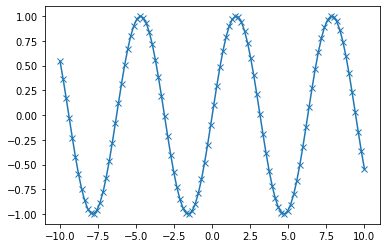

In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np

# Generate a sequence of numbers from -10 to 10 with 100 steps in between
X = np.linspace(-10, 10, 100)
# Create a second array using sine
y = np.sin(X)
# The plot function makes a line chart of one array against another 
plt.plot(X, y, marker='x');

**pandas**

A library for data wrangling and analysis. It is built around a data structure called the **DataFrame.** Simply put, a pandas DataFrame is a table, pandas provides a great range of methods to modify and operate on this table; in particular, it allows SQL-like queries and joins of tables. In contrast to NumPy, which requires that all entries in an array be of the same type, pandas **allows each column to have a separate type** (for example, integers, dates, floating-point numbers, and strings). Another valuable tool provided by pandas is **its ability to ingest from a great variety of file formats and databases**, like SQL, Excel files, and comma-separated vlaues (CSV) files. 

In [ ]:
import pandas as pd

# Create a simple dataset of people
data = {'Name': ["John", "Anna", "Peter", "Linda"],
        'Location': ["New York", "Paris", "Berlin", "London"],
        'Age': [24, 13, 53, 33]
        }

data_pandas = pd.DataFrame(data)
# IPython.display allows "pretty printing" of dataframes
display(data_pandas)

,Name,Location,Age
0,John,New York,24
1,Anna,Paris,13
2,Peter,Berlin,53
3,Linda,London,33


In [ ]:
display(data_pandas[data_pandas.Age>30])

,Name,Location,Age
2,Peter,Berlin,53
3,Linda,London,33


In [ ]:
display(data_pandas[data_pandas['Name']=="John"])

,Name,Location,Age
0,John,New York,24


## **A First Application: Classifying Iris Species**

A botanist is interested in **distinguishing the species of some iris flowers**. She has collected some measurements associated with each iris: the length and width of the petals and the length and width of the sepals (features), all measured in centimeters.

She also has the measurements of some irises that have been previously identified by an expert botanist as belonging to the species setosa, versicolar, or virginiaca. (desired output)


**supervised learning problem**: We want to predict one of several options (the species of iris). 

**a classification problem**:  the possible outputs (different species of irises) are called classes. Every iris in the dataset belongs to one of three classes, so this problem is a tree-class classification problem. 

The desired output for a single data point (an iris) is the species of this flower. For a particular data point, the species it belongs to is called its label.

### **Meet the Data**

In [ ]:
from sklearn.datasets import load_iris
iris_dataset = load_iris()

print("Keys of iris_dataset: \n{}".format(iris_dataset.keys()))

Keys of iris_dataset: 
dict_keys(['data', 'target', 'frame', 'target_names', 'DESCR', 'feature_names', 'filename', 'data_module'])


In [ ]:
# DESCR is a short description of the dataset.
print(iris_dataset['DESCR'][:193] + "\n...")

.. _iris_dataset:

Iris plants dataset
--------------------

**Data Set Characteristics:**

    :Number of Instances: 150 (50 in each of three classes)
    :Number of Attributes: 4 numeric, pre
...


**Label**

In [ ]:
# target_name
print("Target names: {}".format(iris_dataset['target_names']))

Target names: ['setosa' 'versicolor' 'virginica']


**Features**

In [ ]:
# feature_name
print("Feature names: \n{}".format(iris_dataset['feature_names']))

Feature names: 
['sepal length (cm)', 'sepal width (cm)', 'petal length (cm)', 'petal width (cm)']


**Data**

In [ ]:
print("Type of data: {}".format(type(iris_dataset['data'])))

Type of data: <class 'numpy.ndarray'>


In [ ]:
print("Shape of data: {}".format(iris_dataset['data'].shape))

Shape of data: (150, 4)


In [ ]:
print("First five columns of data:\n{}".format(iris_dataset['data'][:5]))

First five columns of data:
[[5.1 3.5 1.4 0.2]
 [4.9 3.  1.4 0.2]
 [4.7 3.2 1.3 0.2]
 [4.6 3.1 1.5 0.2]
 [5.  3.6 1.4 0.2]]


**Target**

In [ ]:
print("Type of target: {}".format(type(iris_dataset['target'])))

Type of target: <class 'numpy.ndarray'>


In [ ]:
print("Shape of target: {}".format(iris_dataset['target'].shape))

Shape of target: (150,)


In [ ]:
print("Target:\n{}".format(iris_dataset['target']))

Target:
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2]


### **Measuring Success: Training and Testing Data**

We want to build a machine learning model

To assess the model's performance
We **split** the labeled **data** we have collected (here, our 150 flower measurements) **into two parts**. 
* One part of the data is used ot build our machine learning model, and is called the training data or **training set**.
* The rest of the data will be used to assess how well the model works; this is called the test data, **test set**, or hold-out set.

**train_test_split** function. 
* This function extracts 75%  of the rows in the data as the training set,
* The remaining 25% of the data as the test set.



Inspired by the standard formulation in mathematics:

> $$ f\left(X\right)\:=\:y$$
  
* X is the input to a function 
* y is the output.

We use a capital X because the data is a two-dimensional array(a matrix) and a lowercase y because the target is a one-dimensional array(a vector).


In [ ]:
from sklearn.datasets import load_iris
from sklearn.model_selection import train_test_split


iris_dataset = load_iris()

X_train, X_test, y_train, y_test = train_test_split(iris_dataset['data'],
                                                    iris_dataset['target'], 
                                                    random_state=0) 

print("shape of data: {}".format(iris_dataset['data'].shape))
print("shape of target: {}".format(iris_dataset['target'].shape))
print("\nafter split:")
print("X_train shape: {}".format(X_train.shape))
print("y_train shape: {}".format(y_train.shape))
print("X_test shape: {}".format(X_test.shape))
print("y_test shape: {}".format(y_test.shape))

shape of data: (150, 4)
shape of target: (150,)

after split:
X_train shape: (112, 4)
y_train shape: (112,)
X_test shape: (38, 4)
y_test shape: (38,)


### **Look at Your Data**

One of the best ways to inspect data is to visualize it. One way to do this is by using **a scatter plot.**


A scatter plot of data puts one feature along the x-axis and another along the y-axis

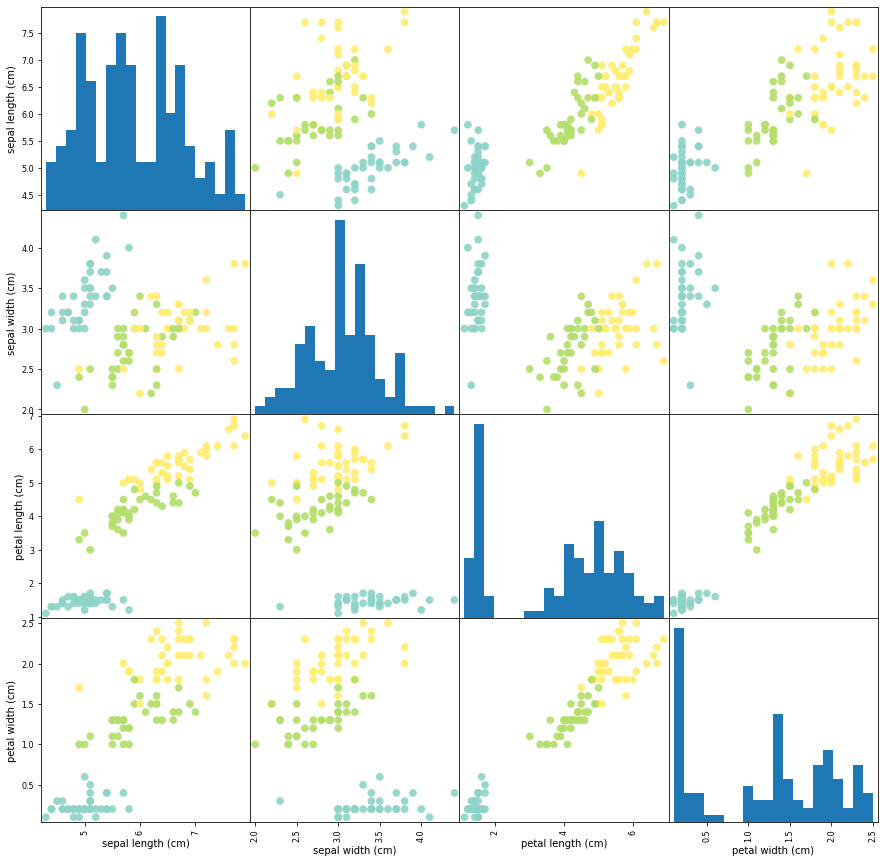

In [ ]:
from sklearn.datasets import load_iris
from sklearn.model_selection import train_test_split
import pandas as pd


iris_dataset = load_iris()

X_train, X_test, y_train, y_test = train_test_split(iris_dataset['data'],
                                                    iris_dataset['target'], 
                                                    random_state=0) 
# create data frame fro mdata in X_train
# label the columns using the string in iris_dataset.feature_name
iris_dataframe = pd.DataFrame(X_train, columns=iris_dataset.feature_names)


# create a scater matrix from the dataframe, color by y_train
grr = pd.plotting.scatter_matrix(iris_dataframe, c=y_train, figsize=(15,15), marker='o',
                        hist_kwds={'bins':20}, s=60, alpha=.9, cmap='Set3')

### **Building Your First Model: k-Nearest Neighbors**

k-nearest neighbors classifier: the **algorithm finds the point in the training set that is closest to the new point**. Then it assigns the label of this training point to the new data point.

The **k** in k-nearest neighbors signifies that instead of using only the closest neighbor to the new data point, we can **consider any fixed number k of neighbors** in the training (for example, the closet three or five neighbors). Then we can make a prediction **using the majority** class among these neighbors.

In [ ]:
import numpy as np
from sklearn.datasets import load_iris
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier


iris_dataset = load_iris()

X_train, X_test, y_train, y_test = train_test_split(iris_dataset['data'],
                                                    iris_dataset['target'], 
                                                    random_state=0) 

# instantiate KNeighborsClassifier class 
# which has k-nearest neighbors classification algorithm 
# knn object encapsulates the algorithm that will be used to build the model
knn = KNeighborsClassifier(n_neighbors=1) # n_neighbors=3, 5 or other 

# fit method to build the model
knn.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=1)

### **Making Predictions**

Using this model on new data for which we might not know the correct labels.

In [ ]:
import numpy as np
from sklearn.datasets import load_iris
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier


iris_dataset = load_iris()

X_train, X_test, y_train, y_test = train_test_split(iris_dataset['data'],
                                                    iris_dataset['target'], 
                                                    random_state=0) 

knn = KNeighborsClassifier(n_neighbors=1)  
knn.fit(X_train, y_train)

# an unknown-label data type and shape must match to the base data
X_new = np.array([[5, 2.9, 1, 0.2]]) # np.array to makes it the same type of data 
# print("X_new.shape: {}".format(X_new.shape)) 

# predict method to make a prediction
prediction = knn.predict(X_new)
print("Prediction: {}".format(prediction))
print("Prediction target name: {}".format(iris_dataset['target_names'][prediction]))

Prediction: [0]
Prediction target name: ['setosa']


### **Evaluating the Model**

Use the test set to Evaluating the model

We can **make a prediction for each iris** `X_test` in the test data and **compare it against its label** `y_test` (the known species). We can measure how well the model works by computing the accuracy, which is the fraction of flowers for which the right species was predicted

In [ ]:
from sklearn.datasets import load_iris
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier


iris_dataset = load_iris()

X_train, X_test, y_train, y_test = train_test_split(iris_dataset['data'],
                                                    iris_dataset['target'], 
                                                    random_state=0) 

knn = KNeighborsClassifier(n_neighbors=1)
knn.fit(X_train, y_train)

y_pred = knn.predict(X_test)
print("Test set predictions:\n {}".format(y_pred))
print("Test set score: {:.2f}".format(np.mean(y_pred == y_test)))
print("Test set score: {:.2f}".format(knn.score(X_test, y_test)))

Test set predictions:
 [2 1 0 2 0 2 0 1 1 1 2 1 1 1 1 0 1 1 0 0 2 1 0 0 2 0 0 1 1 0 2 1 0 2 2 1 0
 2]
Test set score: 0.97
Test set score: 0.97


# <center><b>Chapter 2: Supervised Learning</b></center>

## **Classification and Regression**

There are **two major types** of supervised machine learning problems, called:
* Classification 
* Regression

In **classification**, the goal is to **predict a class label**, which is a choice from a predefined list of possibilities.  

Classification is sometimes separated into:
* **Binary** classification which is the special case of distinguishing between exactly **two classes**.
* **Multiclass** classification, which is classification between **more than two** classes.

For **regression tasks**, the goal is to **predict a continuous number**, or a floating-point number in programming terms (or real number in mathematical terms). 

An easy way to **distinguish between classification and regression taks** is to  ask whether there is some kind of continuity in the output. If  there is continuity between possible outcomes, then the problem is a regression problem.

By contrast, for classification There is no continuity between two things.

## **Generalization, Overfitting, and Underfitting**

In supervised learning, we **want to build a model** on the training data and then be able to **make accurate predictions on new**, unseen data that has the same characteristics as the training set that we used. If a **model is able to make accurate predictions on unseen data**, we say it is able to **generalize** from the training set to the test set. We want to build a model that is  able to generalize as accurately as possible.

**Overfitting** occurs when you fit a model too closely to the particularities of the training set and obtain a **model that works well on the training set** but is **not able to genralize to new data**

**Underfitting** you might **not be able to capture all the aspects of and variability in the data**, and your model will do badly even on the training set. Choosing too simple a model.

The **more complex** we allow our model to be, the **better** we will be able to predict on the training data. However, if our model becores **too complex**, we start focusing too much on each individual data point in our training set, and the model will **not generalize well to new data**.

**Relation of Model Complexity to Dataset Size**

It's important to note that **model complexity** is intimately tied to the **variation of inputs contained in your training dataset**: the **larger variety** of data points your dataset contains, the **more complex a model you can use without overfitting**. Usually, collecting more data points will yield more variety, so larger datasets allow building more complex models. However, simply duplicating the same data points or collecting very similar data will not help.

Having more data and building appropriately more comple models can often work wonders for supervised learning tasks.

## **Supervised Machine Learning Algorithms**

**focus on**

* **Most popular** machine learning algorithms
* Explain **how they learn from data** and **how they make predictions**
* Overview of **how each algorithm builds a model**
* Examine the **strengths** and **weaknesses** of each algorithm
* What kind of **data** they can **best be applied to**
* Most important **parameters** and **options**.

### **Some Sample Datasets**

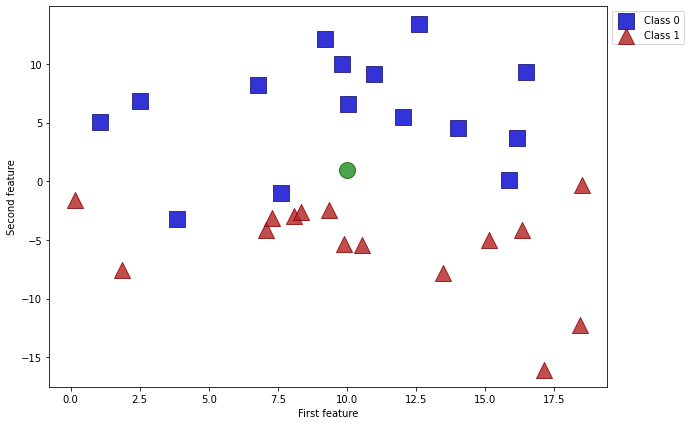

X shape: (30, 2)
y shape: (30,)


In [ ]:
# Generating dataset for a classification example.
import numpy as np
from sklearn.datasets import make_blobs
from matplotlib.colors import ListedColormap
import matplotlib.pyplot as plt

NUM_CLASSES = 2
NUM_FEATURES = 2
RANDOM_SEED = 24

X, y = make_blobs(n_samples=30,
                  n_features=NUM_FEATURES,
                  centers=NUM_CLASSES,
                  cluster_std=5, 
                  random_state=RANDOM_SEED)

plt.figure(figsize=(10, 7))

cmap = ListedColormap(['#0000CD', '#B22222']) 
cedge = ListedColormap(['#191970', '#8B0000'])

markers = 's^'
for m,i in zip(markers,np.unique(y)):
  mask = y==i
  scatter = plt.scatter(X[mask, 0], X[mask, 1],
                        color=cmap.colors[i], edgecolors=cedge.colors[i],
                        alpha=0.8, marker=m, s=2**8, label=i);

plt.scatter(10,1, color='#228B22', edgecolors='#006400' ,alpha=0.8, marker='o', s=2**8)

plt.legend(labels = ["Class 0", "Class 1"],
           bbox_to_anchor=(1.0, 1),
           loc='upper left')


plt.xlabel("First feature")
plt.ylabel("Second feature")
plt.show()

print("X shape: {}".format(X.shape))
print("y shape: {}".format(y.shape))

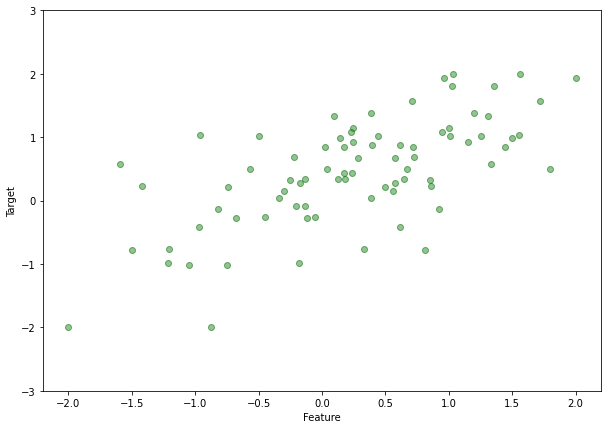

X shape: (40, 2)
y shape: (40,)


In [ ]:
# Generating dataset for a regression example.
from sklearn.datasets import make_regression
import matplotlib.pyplot as plt

NUM_FEATURES = 2
SD = 0.5
RANDOM_SEED = 24

X, y, coef = make_regression(n_samples=40,
                             n_features=NUM_FEATURES,
                             n_informative=NUM_FEATURES, # number of features used to build the linear
                             noise=SD,
                             coef=True,
                             random_state=RANDOM_SEED)


X = np.interp(X, (X.min(), X.max()), (-2, 2))
y = np.interp(y, (y.min(), y.max()), (-2, 2))

plt.figure(figsize=(10, 7))
plt.plot(X, y, 'o', color='#228B22', markeredgecolor='#006400', alpha=0.5)
plt.ylim(-3, 3)
plt.xlabel("Feature")
plt.ylabel("Target")
plt.show()

print("X shape: {}".format(X.shape))
print("y shape: {}".format(y.shape))

Ther are two real-word datasets 


* **The Wisconsin Breast Cancer dataset**, which records clinical measurements of breast cancer tumors. Each tumor is labeled as "benign" (for harmless tumors) or "malignant" (for cancerous tumors) and the task is to learn to predict whether a tumor is maglignant based on the measurements of the tissue.

* **The Boston Housing dataset. The task associated with this dataset is to predict the median value of homes in several Boston neighborhoods in the 1970s, using information such as crime rate, proximity to the Charles River, highway accessibility, and so on 

In [ ]:
# A real-world classification dataset
# The Wisconsin Breast Cancer dataset, which records clinical measurements of 
# breast cancer tumors. 
import numpy as np
from sklearn.datasets import load_breast_cancer

cancer = load_breast_cancer()
print("cancer.keys() : \n{}".format(cancer.keys()))

cancer.keys() : 
dict_keys(['data', 'target', 'frame', 'target_names', 'DESCR', 'feature_names', 'filename', 'data_module'])


In [ ]:
print("Shape of cancer data: {}".format(cancer.data.shape))

Shape of cancer data: (569, 30)


In [ ]:
print("Sample counts per class:\n{}".format(
    {n: v for n, v in zip(cancer.target_names, np.bincount(cancer.target))}
))

Sample counts per class:
{'malignant': 212, 'benign': 357}


In [ ]:
print("Feature names:\n{}".format(cancer.feature_names))

Feature names:
['mean radius' 'mean texture' 'mean perimeter' 'mean area'
 'mean smoothness' 'mean compactness' 'mean concavity'
 'mean concave points' 'mean symmetry' 'mean fractal dimension'
 'radius error' 'texture error' 'perimeter error' 'area error'
 'smoothness error' 'compactness error' 'concavity error'
 'concave points error' 'symmetry error' 'fractal dimension error'
 'worst radius' 'worst texture' 'worst perimeter' 'worst area'
 'worst smoothness' 'worst compactness' 'worst concavity'
 'worst concave points' 'worst symmetry' 'worst fractal dimension']


**ฺBoston Housing Dataset**

In [ ]:
import pandas as pd
import numpy as np

# load  the object that contains all the the information about Boston Housing Dataset.
data_url = "http://lib.stat.cmu.edu/datasets/boston"
raw_df = pd.read_csv(data_url, sep="\s+", skiprows=22, header=None)
data = np.hstack([raw_df.values[::2, :], raw_df.values[1::2, :2]])
target = raw_df.values[1::2, 2]

columns = ['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE',
           'DIS', 'RAD', 'TAX','PTRATIO', 'B', 'LSTAT']

In [ ]:
# A real-word regression dataset
# The Boston Housing dataset.

boston = data
print("Data shape: {}".format(boston.data.shape))

Data shape: (506, 13)


### **k-Nearest Neighbors**

The k-NN algorithm is arguably the simplest machine learning algorithm. **Building the model** consists only of **storing the training dataset**. **To make a prediction** for a new data point, the algorithm **finds the closet data points** in the training dataset - its "nearest neighbors."

**k-Neighbors classification**


In its simplest version, the k-NN algorithm only considers exactly one nearest neighbor, which is the closet training data point to the point we want to make a prediction for. The prediction is then simply the known output for this training point.

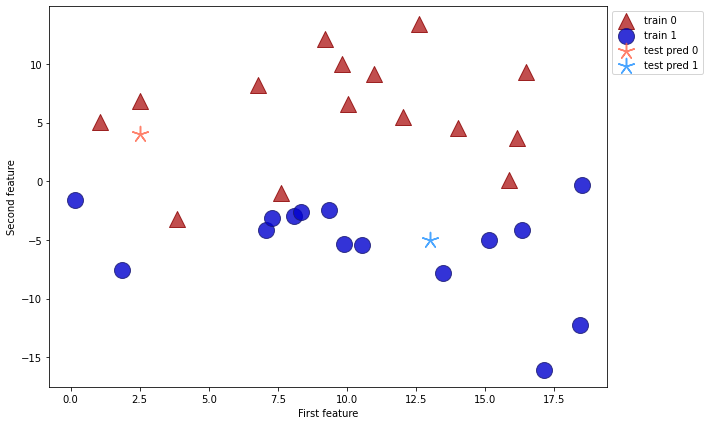

In [ ]:
import numpy as np
from sklearn.datasets import make_blobs
from matplotlib.colors import ListedColormap
import matplotlib.pyplot as plt

NUM_CLASSES = 2
NUM_FEATURES = 2
RANDOM_SEED = 24

X, y = make_blobs(n_samples=30,
                  n_features=NUM_FEATURES,
                  centers=NUM_CLASSES,
                  cluster_std=5, 
                  random_state=RANDOM_SEED)

plt.figure(figsize=(10, 7))

cmap = ListedColormap(['#B22222', '#0000CD']) 
cedge = ListedColormap(['#8B0000', '#191970'])

markers = '^o'
for m,i in zip(markers,np.unique(y)):
  mask = y==i
  scatter = plt.scatter(X[mask, 0], X[mask, 1],
                        color=cmap.colors[i], edgecolors=cedge.colors[i],
                        alpha=0.8, marker=m, s=2**8, label=i);

plt.scatter(2.5, 4, color='#FF6347', edgecolors='#FF6347', 
            alpha=0.8, marker=(5, 2), s=2**8, label='test class 0')  # red star

plt.scatter(13, -5, color='#1E90FF', edgecolors='#1E90FF',
            alpha=0.8, marker=(5, 2), s=2**8, label='test class 1')  # blue star


plt.legend(labels = ["train 0", "train 1", 
                     "test pred 0", 'test pred 1'],
           bbox_to_anchor=(1.0, 1),
           loc='upper left')


plt.xlabel("First feature")
plt.ylabel("Second feature")
plt.show()

We added two new data points (green stars)

Instead of considering only **the closet neighbor** (just one point), we can also consider an arbitrary number, k, of neighbors (any number of the closest points). This is where the name of the **k-nearest neighbors algorithm comes from** When considering more than one neighbor, we **use voting to assign a label**. This mean that for each test point, we count how many neighbors belogn to class 0 and how many neighbors belong  to class 1. We then assign the class that is more frequent: in other words, the magority class among the k-nearest neighbors. 

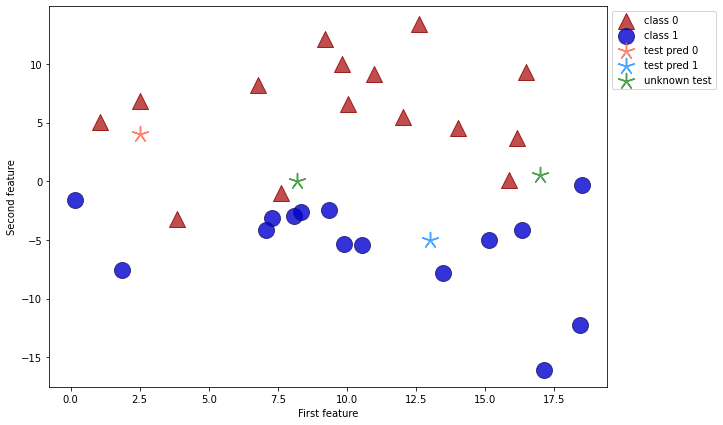

In [ ]:
import numpy as np
from sklearn.datasets import make_blobs
from matplotlib.colors import ListedColormap
import matplotlib.pyplot as plt

NUM_CLASSES = 2
NUM_FEATURES = 2
RANDOM_SEED = 24

X, y = make_blobs(n_samples=30,
                  n_features=NUM_FEATURES,
                  centers=NUM_CLASSES,
                  cluster_std=5, 
                  random_state=RANDOM_SEED)

plt.figure(figsize=(10, 7))

cmap = ListedColormap(['#B22222', '#0000CD']) 
cedge = ListedColormap(['#8B0000', '#191970'])

markers = '^o'
for m,i in zip(markers,np.unique(y)):
  mask = y==i
  scatter = plt.scatter(X[mask, 0], X[mask, 1],
                        color=cmap.colors[i], edgecolors=cedge.colors[i],
                        alpha=0.8, marker=m, s=2**8, label=i);

plt.scatter(2.5, 4, color='#FF6347', edgecolors='#FF6347', 
            alpha=0.8, marker=(5, 2), s=2**8, label='test class 0')  # red star

plt.scatter(13, -5, color='#1E90FF', edgecolors='#1E90FF',
            alpha=0.8, marker=(5, 2), s=2**8, label='test class 1')  # blue star


plt.scatter(8.2, 0, color='#228B22', edgecolors='#006400',
            alpha=0.8, marker=(5, 2), s=2**8, label='unknown test')  # unknown test 1

plt.scatter(17, 0.5, color='#228B22', edgecolors='#006400',
            alpha=0.8, marker=(5, 2), s=2**8, label='unknown test')  # unknown test 2         

plt.legend(labels = ["class 0", "class 1", 
                     "test pred 0", 'test pred 1', 'unknown test'],
           bbox_to_anchor=(1.0, 1),
           loc='upper left')


plt.xlabel("First feature")
plt.ylabel("Second feature")
plt.show()

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)

clf = KNeighborsClassifier(n_neighbors=3)
clf.fit(X_train, y_train)

print("Test set predictions: {}".format(clf.predict(X_test)))
print("Test set accuracy: {:.2f}".format(clf.score(X_test, y_test)))

Test set predictions: [0 1 0 0 1 1 0 1]
Test set accuracy: 0.88


In [ ]:
unknown_1 = np.array([[8.2, 0]])
unknown_2 = np.array([[17, 0.5]])

predict_un1 = clf.predict(unknown_1)
predict_un2 = clf.predict(unknown_2)

print("Prediction unknown 1: {}".format(predict_un1))
print("Prediction unknown 2: {}".format(predict_un2))

Prediction unknown 1: [1]
Prediction unknown 2: [0]


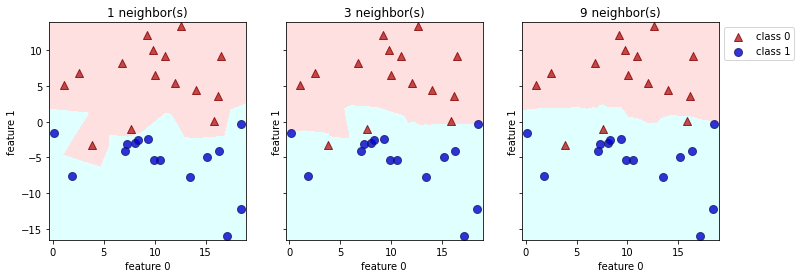

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.neighbors import KNeighborsClassifier
from matplotlib.colors import ListedColormap

cmap = ListedColormap(['#B22222', '#0000CD']) 
cedge = ListedColormap(['#8B0000', '#191970'])
clight = ListedColormap(['#FFE0E0', '#E0FFFF'])

fig, axes = plt.subplots( figsize=(12, 4), nrows = 1, ncols = 3, sharex=True, sharey=True)

for n_neighbors, ax in zip([1, 3, 9], axes):
  clf = KNeighborsClassifier(n_neighbors=n_neighbors).fit(X, y)
  
  x_min, x_max = X[:, 0].min() - .5, X[:, 0].max() + .5
  y_min, y_max = X[:, 1].min() - .5, X[:, 1].max() + .5

  h = 0.02
  xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
  Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
  Z = Z.reshape(xx.shape)
  
  ax.pcolormesh(xx, yy, Z, cmap=clight)

  markers = '^o'
  for m,i in zip(markers,np.unique(y)):
    mask = y==i
    scatter = ax.scatter(X[mask, 0], X[mask, 1],
                          color=cmap.colors[i], edgecolors=cedge.colors[i],
                          alpha=0.8, marker=m, s=2**6, label=i);
 
  ax.set_title("{} neighbor(s)".format(n_neighbors))
  ax.set_xlabel("feature 0")
  ax.set_ylabel("feature 1")


plt.legend(labels = ["class 0", "class 1"],
          bbox_to_anchor=(1.0, 1),
          loc='upper left')


plt.show()

As you can see on the left in the figure, using a **single neighbor results in decision boundary that follows the training data closely**. considering more and more neighbors leads to a smoother decision boundary. A smoother boundary corresponds to a simpler model

In other words, using **few neighbors** corresponds to **hight model complexity**(right side, and using **many neighbors** corresponds to **low model complexity**(left side)

Let's investigate whether we can confirm **the connection between model complexity and generalization**.

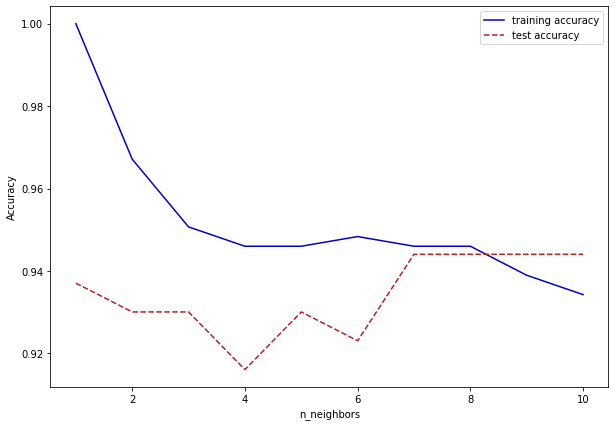

In [ ]:
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import train_test_split

cancer = load_breast_cancer()

X_train, X_test, y_train, y_test = train_test_split(cancer.data, 
                                                    cancer.target,
                                                    stratify=cancer.target, 
                                                    random_state=42)

training_accuracy = []
test_accuracy = []

# try n_neighbors from 1 to 10
neighbors_settings = range(1, 11)

for n_neighbors in neighbors_settings:
  # build the model
  clf = KNeighborsClassifier(n_neighbors=n_neighbors)
  clf.fit(X_train, y_train)
  # record training set accuracy
  training_accuracy.append(clf.score(X_train, y_train))
  # record generalization accuracy
  test_accuracy.append(clf.score(X_test, y_test))

plt.figure(figsize=(10, 7))

plt.plot(neighbors_settings, training_accuracy, 
         color='#0000CD', label="training accuracy")

plt.plot(neighbors_settings, test_accuracy, 
         color='#B22222', linestyle='dashed' ,label="test accuracy")

plt.ylabel("Accuracy")
plt.xlabel("n_neighbors")
plt.legend()
plt.show()

The plot shows the **training and test set accuracy** on the y-axis **against** the setting of **`n_neighbors`** on the x-axis. While real-world plots are rately very smooth, we can still recognize some of the characteristics of  overfitting and underfitting

**training set**

Considering a **single nearest neighbor**, the **prediction** on the training set is **perfect**. But when **more neighbors** are considered, the model becomes **simpler** and the **training accuracy drops.** 

**test set**
The test set accuracy for using a **single neighbor** is **lower** than when using **more neighbors**, indicating that using the single nearest neighbor leads to a model that is too complex. On the other hand, when considering 10 neighbors, the model is too simple and performance is even worse. 


The best performance is **somewhere in the middle**, using around six neighbors. 

**k-neighbors regression**

There is also a regression variant of the k-nearest neighbor algorithm. 

This time using the wave dataset. We've added three data points as green stars on the x-axis. The prediction using a single neighbor is just the target value of the nearest neighbor.

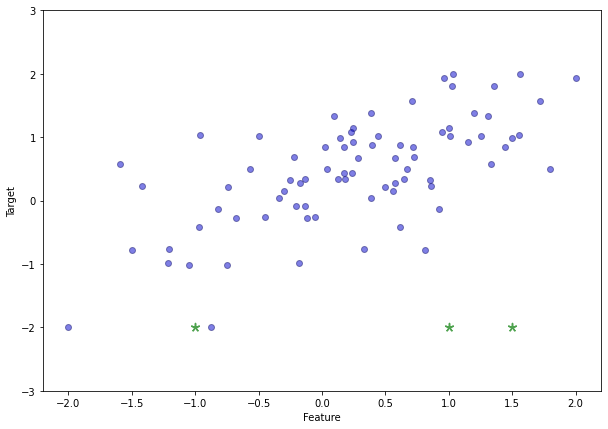

In [ ]:
# Generating dataset for a regression example.
from sklearn.datasets import make_regression
import matplotlib.pyplot as plt
import numpy as np

NUM_FEATURES = 2
SD = 0.5
RANDOM_SEED = 24

X, y, coef = make_regression(n_samples=40,
                             n_features=NUM_FEATURES,
                             n_informative=NUM_FEATURES, # number of features used to build the linear
                             noise=SD,
                             coef=True,
                             random_state=RANDOM_SEED)


X = np.interp(X, (X.min(), X.max()), (-2, 2))
y = np.interp(y, (y.min(), y.max()), (-2, 2))

plt.figure(figsize=(10, 7))
plt.plot(X, y, 'o', color='#0000CD', markeredgecolor='#191970', alpha=0.5)

plt.scatter([-1, 1, 1.5 ], [-2, -2, -2], color='#228B22', edgecolors='#006400',
            alpha=0.8, marker=(5, 2), s=2**6, label='unknown test')  # green star  

plt.ylim(-3, 3)
plt.xlabel("Feature")
plt.ylabel("Target")
plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import train_test_split

# split the wave dataset into a training adn a test set
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)

# instantiate the model and set the number of neighbors to consider to 3
reg = KNeighborsRegressor(n_neighbors=3)

# fit the model using the training data and training target
reg.fit(X_train, y_train)

print("Test set predictions:\n{}".format(reg.predict(X_test)))

Test set predictions:
[-0.57199515 -0.13304688  0.03738701  1.12622448  1.27899439  0.55943405
  0.21688104 -0.13304688  0.77550693  0.39098858]


In [ ]:
print("Unknown prediction:\n{}".format(reg.predict([(-1, -2), (1, -2), (1.5, -2)])))

Unknown prediction:
[-1.0941042   0.61509198  0.61509198]


**Evaluate the model** using the score method, which for regressors returns the **R<sup>2</sup>** score, also known as the **coefficient of determination**, is a measure of goodness of a prediction for a regression model, and yields a score between 0 and 1. A value of **1 corresponds to a perfect prediction**, and a value of **0 corresponds** to a constant model that just predicts the **mean of the training set responses**, `y_train`

In [ ]:
# evaluate the  model using R^2, coefficient of determination
print("Test set R^2 {:.2f}".format(reg.score(X_test, y_test)))

Test set R^2 0.93


In [ ]:
y

array([ 0.33517292,  1.14256043, -0.7587583 , -0.99259764,  1.07962231,
        1.01546785,  0.49434178,  0.5772579 ,  0.27182157,  0.0353705 ,
        1.56995247, -0.41981989,  1.93618393, -0.27052323,  2.        ,
        0.42783109,  0.91984812,  0.84878744,  0.88104794,  1.33758524,
       -0.13124968,  1.00991208, -0.77623239,  0.49755735,  0.68358638,
       -0.09304176,  0.34345104,  1.03962983,  0.1528634 ,  0.67210023,
        1.81269826,  0.2283882 , -0.25838238,  0.21748902,  0.98095112,
        0.84158678,  0.32424716, -2.        ,  1.38732555, -1.01178937])

**Analyzing KNeighborsRegressor**

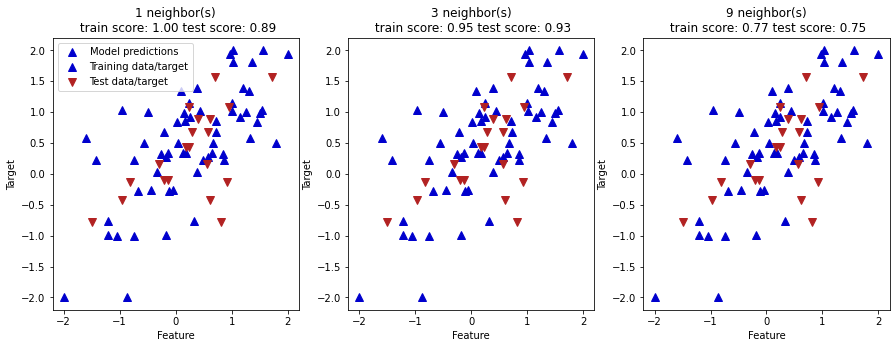

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import numpy as np

cmap = ListedColormap(['#B22222', '#0000CD']) 

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# create 1,000 data points, evenly spaced between -3 and 3
line = np.linspace(-3, 3, 10000).reshape(-1, 1)
# l = [[*i, *i] for i in line]

for n_neighbors, ax in zip([1, 3, 9], axes): 
  # make predictions using 1, 3, 9 neighbors
  reg = KNeighborsRegressor(n_neighbors=n_neighbors)
  reg.fit(X_train, y_train)
  # ax.plot(line, reg.predict(line))   # error when number of NUM_FEATURES more than 1 
  ax.plot(X_train, y_train, '^', c=cmap.colors[1], markersize=8)
  ax.plot(X_test, y_test, 'v', c=cmap.colors[0], markersize=8)

  ax.set_title(
      "{} neighbor(s)\n train score: {:.2f} test score: {:.2f}".format(
          n_neighbors, reg.score(X_train, y_train),
          reg.score(X_test, y_test)))
  ax.set_xlabel("Feature")
  ax.set_ylabel("Target")
axes[0].legend(["Model predictions", "Training data/target",
                "Test data/target"], loc="best")

plt.show()

As we can see from the plot, using only a single neighbor, **each point** in the training set has an obvious **influence on the predictions,** and the predicted values go through all of the data points. This leads to a **very unsteady prediction.** Considering **more neighbors leads to smoother predictions**, but these do not fit the training data as well

**Strengths, weaknesses, and parameters**

In principle, There are **two important parameters** to the **KNeighbors classifier**: 

* the number of neighbors
* how you measure distance between data points.

In practice, using a **small number of neighbors** like **three or five** often works well but you should certainly adjust this parameter. By default choosing distance measure, **Euclidean** is used, which works well in many settings.

**Model explanation**

One of the strengths of k-NN is that the model is **very easy to understand**, and often gives reasonable performance without a lot of adjustments. Using this algorithm is a good baseline method to try before considering more advanced techniques.

**Building model**

Building the nearest neighbors model is usually **very fast,** but when you training set is very large (either in number of features or in number of samples) prediction can be slow. When using the k-NN algorithm, it's important to preprocess your data. This approach often does **not perform well on datasets with many features** (hundreads or more), and it does particularly badly with datasets where most features are 0 most of the time (so-called sparse datasets).

So, while the nearest k-neighbors algorithm is **easy to understand**, it is not often used in practice, due to prediction being slow and its **inability to handle many features**. 

### **Linear Models**

Linear models are a class of models that are **widely used in practic** and have been studied extensively in the last few decades wiht roots going back over a hundread years. 

Linear models make a prediction using a **linear function** of the input features.

**Linear models for regression**

For regression, the general prediction formula for a linear model looks as follows:

$$ ŷ\:=\:w\left[0\right]\:\times \:x\left[0\right]\:+\:w\left[1\right]\:\times x\left[1\right]+...+w\left[p\right]\times x\left[p\right]+b$$

Here x[0] to x[p] denotes the **features** (in this example, the number of features is p) of a single data point, *w* and *b* are parameters of the model that are learned, and ŷ is the prediction the model makes. For a dataset with a single feature, this is 

$$ŷ\:=\:w\left[0\right]\:\times \:x\left[0\right]\:+b$$

which you might remember from high school mathematics as the equation for a line. Here, **w[0] is the slope** and **b is the y-axis offset**. w contains the slopes along each feature axis. Alternatively, you can think of the predicted response as being a weighted sum of the input features, with weihts (which can be negative) given by the entries of w

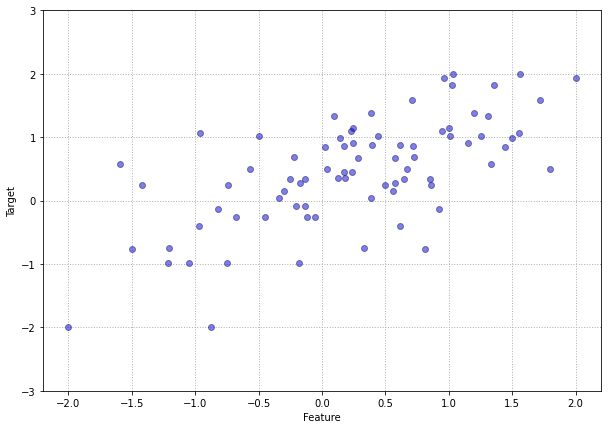

In [ ]:
# Generating dataset for a regression example.
from sklearn.datasets import make_regression
import matplotlib.pyplot as plt
import numpy as np

NUM_FEATURES = 2
SD = -0.3
RANDOM_SEED = 24

X, y, coef = make_regression(n_samples=40,
                              n_features=NUM_FEATURES,
                              n_informative=NUM_FEATURES, # number of features used to build the linear
                              noise=SD,
                              coef=True,
                              random_state=RANDOM_SEED)


X = np.interp(X, (X.min(), X.max()), (-2, 2))
y = np.interp(y, (y.min(), y.max()), (-2, 2))

plt.figure(figsize=(10, 7))
plt.plot(X, y, 'o', color='#0000CD', markeredgecolor='#191970', alpha=0.5)

plt.ylim(-3, 3)
plt.xlabel("Feature")
plt.ylabel("Target")
plt.grid(axis='both', linestyle=':', linewidth=1)
plt.show()

**Linear models for regression** can be characterized as **regression models** for which the prediction is a line **for a single feature**, a plane when using two features, or a hyperplane in higher dimensions(this is, when ysing more freatures).

If you compare the **predictions made by the straight line** with those made by the *KNeighborsRegressor*, using a straight line to make predictions seems **very restrictive**. It looks like all the **fine details of data ar lost**. In a sense, this is true. It is a strong (and somewhat unrealistic) assumption that our **target y** is a linear **combination of the features**. But looking at one-dimensional data gives a somewhat skewed perspective. For datasets with **many features**, **linear models can be very powerful**. In particular, if you have more features than training data points, and target y can be perfectly modeled (on the training set) as a linear function.

There are **many different linear models** for regression. the difference between these models lies in how the model parameters *w* and  *b* are learned from the training data, and how model complexity can be controlled.

#### **Linear regression (aka ordinary least squares)**

The **simplest** and most classic linera method for regression. Linear regression finds the parameters *w* and *b* that minimize the mean square error between predictions and the true regression targets, y , on the training set. the mean squared error is the sum of the squared differences between the predictions and the true values. Linear regression has no parameters, which is a benefit, but it also has no way to control model complexity.

**EX.1**

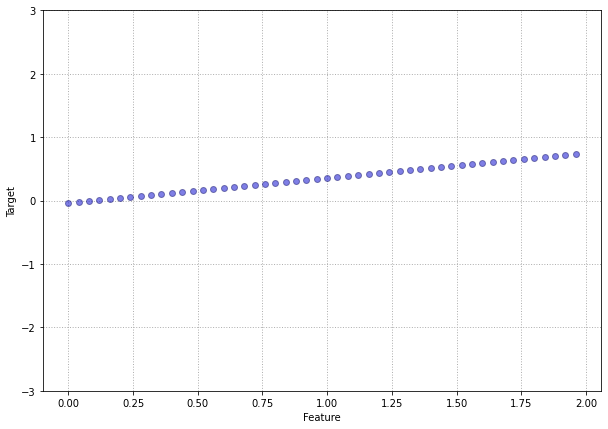

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

weight = 0.393906
bias = -0.031804

# create 
start = 0; stop = 2; step = 0.04

X = np.arange(start, stop, step).reshape(-1, 1)
y = weight * X + bias                                       # linear equation

plt.figure(figsize=(10, 7))
plt.plot(X, y, 'o', color='#0000CD', markeredgecolor='#191970', alpha=0.5)

plt.ylim(-3, 3)
plt.xlabel("Feature")
plt.ylabel("Target")
plt.grid(axis='both', linestyle=':', linewidth=1)
plt.show()

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

lr = LinearRegression().fit(X_train, y_train)
                                                      # y = mx + c
print("lr.coef_:{}".format(lr.coef_))                 # slope; coef m 
print("lr.intercept_:{}".format(lr.intercept_))       # intercept c 

lr.coef_:[[0.393906]]
lr.intercept_:[-0.031804]


In [ ]:
print("Training set score: {:.2f}".format(lr.score(X_train, y_train)))
print("Test set score: {:.2f}".format(lr.score(X_test, y_test)))

Training set score: 1.00
Test set score: 1.00


**EX.2**

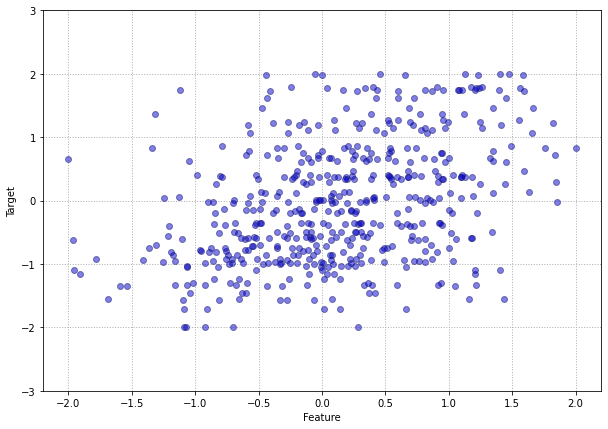

In [ ]:
# Generating dataset for a regression example.
from sklearn.datasets import make_regression
import matplotlib.pyplot as plt
import numpy as np

NUM_FEATURES = 5
SD = 0.5
RANDOM_SEED = 24

X, y, coef = make_regression(n_samples=100,
                              n_features=NUM_FEATURES,
                              n_informative=NUM_FEATURES, # number of features used to build the linear
                              noise=SD,
                              coef=True,
                              random_state=RANDOM_SEED)


X = np.interp(X, (X.min(), X.max()), (-2, 2))
y = np.interp(y, (y.min(), y.max()), (-2, 2))

plt.figure(figsize=(10, 7))
plt.plot(X, y, 'o', color='#0000CD', markeredgecolor='#191970', alpha=0.5)

plt.ylim(-3, 3)
plt.xlabel("Feature")
plt.ylabel("Target")
plt.grid(axis='both', linestyle=':', linewidth=1)
plt.show()

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

lr = LinearRegression().fit(X_train, y_train)
                                                      # y = mx + c
print("lr.coef_:{}".format(lr.coef_))                 # slope; coef m 
print("lr.intercept_:{}".format(lr.intercept_))       # intercept c 

lr.coef_:[0.0695009  0.60575964 0.78414471 0.24491668 0.74877122]
lr.intercept_:-0.32562308880979673


In [ ]:
print("Training set score: {:.2f}".format(lr.score(X_train, y_train)))
print("Test set score: {:.2f}".format(lr.score(X_test, y_test)))

Training set score: 1.00
Test set score: 1.00


For this **one-dimensional** dataset, there is **little danger of overfitting**, as the model is very simple (or restricted). However, with **higher-dimensional datasets** (meaning datasets with a large number of featues), linear models become more powerful, and there is a higer chance of overfitting.

**Ex.3 : more complex dataset**

In [ ]:
import pandas as pd
import numpy as np

# load  the object that contains all the the information about Boston Housing Dataset.
data_url = "http://lib.stat.cmu.edu/datasets/boston"
raw_df = pd.read_csv(data_url, sep="\s+", skiprows=22, header=None)
data = np.hstack([raw_df.values[::2, :], raw_df.values[1::2, :2]])
target = raw_df.values[1::2, 2]

columns = ['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE',
           'DIS', 'RAD', 'TAX','PTRATIO', 'B', 'LSTAT']

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

X = data
y = target

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)
lr = LinearRegression().fit(X_train, y_train)

print("Training set score: {:.2f}".format(lr.score(X_train, y_train)))
print("Test set score: {:.2f}".format(lr.score(X_test, y_test)))

Training set score: 0.77
Test set score: 0.64


#### **Ridge regression**

ให้น้ำหนักกับตัวแปรที่ทำนายได้ดีที่สุด ตัวแปรที่เหลือทั้งหมดผลักลงให้ใกล้กับศูนย์

Ridge regression is also a linear model for regression, so the **formula** is uses to make predictions is **the same** one used for **ordinary least squares**.

In ridge regression, the **coefficients (w) are chosen** not only so that they **predict well** on the training data, but also to **fit an additional constraint**. We also want the magnitude of coefficients to be as small as possible; in other words, **all entries of w should be close to zero**. Intuitively, this means **each feature should have as little effect on the outcome** as possible (which translates to having a small slope), while still predicting well. This constraint is an example of what is called **regularization.** Regularization means explicitly restricting a model to avoid overfitting. The particular kind used by ridge regression is known as L2 regularization.

In [ ]:
from sklearn.linear_model import Ridge

ridge = Ridge().fit(X_train, y_train)  # boston house price

print("Training set score: {:.2f}".format(ridge.score(X_train, y_train)))
print("Test set score: {:.2f}".format(ridge.score(X_test, y_test)))

Training set score: 0.77
Test set score: 0.63


**Ridge is a more restricted model**, so we are less likely to overfit. A less complex model means **worse performance on the training set, but beter generalization**. As we are only interested in generalization performance, we should choose the Ridge model over the LinearRegression model.

The Ridge model makes a **trade-off between** the **simplicity of the model** (near-zero coefficients) and **its performance** on the training set. How much importance the model places on simplicity versus training set. How much importance the model places on simplicity versus training set performance **can be specified** by the user, using the **alpah parameter**. 

In the previous example, we used the default parameter alpha=1.0. There is no reason why this will give us the best trade-off, though. The optimum setting of alpha depends on the particular dataset we are using. **Increasing alpha** forces coefficients to move more toward zero, which **decreases training set performance** but **might help generalization**. 
 

In [ ]:
ridge10 = Ridge(alpha=10).fit(X_train, y_train)

print("Training set score: {:.2f}".format(ridge10.score(X_train, y_train)))
print("Test set score: {:.2f}".format(ridge10.score(X_test, y_test)))

Training set score: 0.76
Test set score: 0.61


Decreasing alpha allows the coefficients to be less restricted. For very small values of alpha, coefficients are barely restricted at all, and we end up with a model that resembles LinearRegression

In [ ]:
ridge01 = Ridge(alpha=0.1).fit(X_train, y_train)

print("Training set score: {:.2f}".format(ridge01.score(X_train, y_train)))
print("Test set score: {:.2f}".format(ridge01.score(X_test, y_test)))

Training set score: 0.77
Test set score: 0.63


We can also get a more **qualitative insidght** into how the **alpha parameter changes the model** by inspecting the `coef_` attribute of models with different values of alpha. A higher alpha means a more restricted model, so we expect the entries of `coef_` to have smaller magnitude for a high value of alpha than for a low value of alpha. 

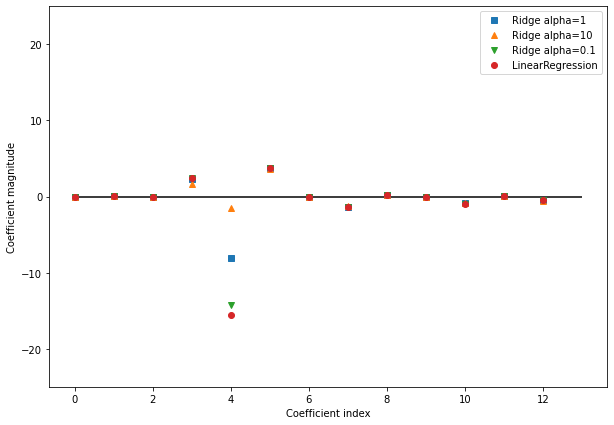

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 7))

plt.plot(ridge.coef_, 's', label="Ridge alpha=1")
plt.plot(ridge10.coef_, '^', label="Ridge alpha=10")
plt.plot(ridge01.coef_, 'v', label="Ridge alpha=0.1")
plt.plot(lr.coef_, 'o', label="LinearRegression")

plt.xlabel("Coefficient index")
plt.ylabel("Coefficient magnitude")
plt.hlines(0, 0, len(lr.coef_))
plt.ylim(-25, 25)
plt.legend()
plt.show()

(เริ่มต้นจากศูนย์) ตัวแปรลำดับที่ 4; Nox  มีความสามารถในการทำนายได้ดี แต่สัมประสิทธิ์เป็นลบ

* LinearRegression model: ให้น้ำหนักกับทุกตัวแปรมาคำนวณสมการเส้นตรง ตัวแปรที่ให้น้ำหนักมากที่สุด คือ 4

* Ridge alpha 1 model: ตัวแปรที่เลือกให้น้ำหนัก 3, 4(เน้นตัวแปรนี้มากที่สุด), 5, 7, 10 ตัวแปรที่เหลือถูกผลักให้เข้าใกล้ศูนย์
* Ridge alpha 10 model: กระจายน้ำหนักเหมือน LinearRegression, ตัวแปรที่เลือกให้น้ำหนัก 3 4 5 7 10 12 แต่ไม่มีตัวแปรไหนเน้นสุด 
* Ridge alpha 0.1 model: ตัวแปรที่เลือกให้น้ำหนัก 3, 4(เน้นตัวแปรนี้มากที่สุด; alpha=0.1 สุดโต่งกว่า alpha=1), 5, 7, 10 ตัวแปรที่เหลือถูกผลักให้เข้าใกล้ศูนย์

#### **Lasso**

ตัวแปรบางตัวแปรจะมีน้ำหนักเป็นศูนย์ และ ไม่ถูกน้ำมาพิจารณาในสมาการ แทนที่เราจะคัดเลือกตัวแปรที่ทำนายสมการเส้นตรงโดยตัวเอง 

An alternative to Ridge for regularizing linear regression is Lasso. As with ridge regression, using the **lasso also restricts coefficients to be close to zero**, but in a slightly different way, called **L1 regularization**.

The consequence of L1 regularization is that when using the lasso, **some coefficients are exactly zero**. This means **some features are entirely ignored by the model.** This can be seen as a form of **automatic feature selection** Having some coefficients be exactly zero often makes a model easier to interpret, and can reveal the most important features of your model

In [ ]:
from sklearn.linear_model import Lasso

lasso = Lasso().fit(X_train, y_train)

print("Training set score: {:.2f}".format(lasso.score(X_train, y_train)))
print("Test set score: {:.2f}".format(lasso.score(X_test, y_test)))
print("Number of features used: {}".format(np.sum(lasso.coef_ !=0)))

Training set score: 0.72
Test set score: 0.55
Number of features used: 11


The lasso also has a regularization parameter, alpha, that controls how strongly coefficients are pushed toward zero. 

In [ ]:
# we increase the default setting of "max_iter"
# otherwise the model would warn us that we should increase max_iter.

lasso001 = Lasso(alpha=0.01, max_iter=100000).fit(X_train, y_train)

print("Training set score: {:.2f}".format(lasso001.score(X_train, y_train)))
print("Test set score: {:.2f}".format(lasso001.score(X_test, y_test)))
print("Number of features used: {}".format(np.sum(lasso001.coef_ !=0)))

Training set score: 0.77
Test set score: 0.63
Number of features used: 13


A **lower alpha** allowed us to **fit a more complex model**, which worked better on the training and test data. The performance is slightly better than using Ridge.

If we set alpha too low, however, we again remove the effect of regularization and end up overfitting, with a result similar to LinearRegression

In [ ]:
lasso00001 = Lasso(alpha=0.0001, max_iter=100000).fit(X_train, y_train)

print("Training set score: {:.2f}".format(lasso00001.score(X_train, y_train)))
print("Test set score: {:.2f}".format(lasso00001.score(X_test, y_test)))
print("Number of features used: {}".format(np.sum(lasso00001.coef_ !=0)))

Training set score: 0.77
Test set score: 0.64
Number of features used: 13


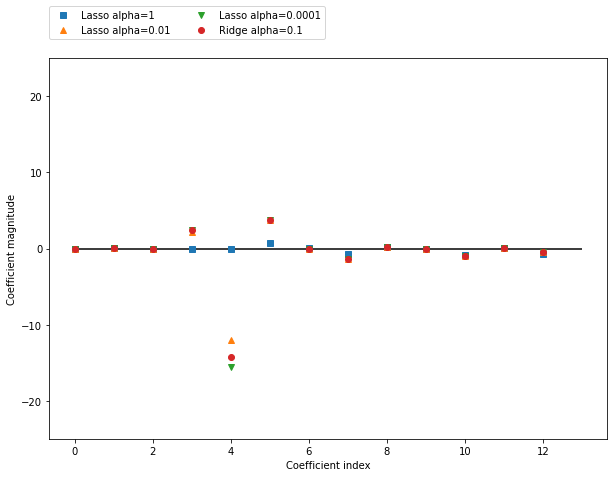

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 7))

plt.plot(lasso.coef_, 's', label="Lasso alpha=1")
plt.plot(lasso001.coef_, '^', label="Lasso alpha=0.01")
plt.plot(lasso00001.coef_, 'v', label="Lasso alpha=0.0001")
plt.plot(ridge01.coef_, 'o', label="Ridge alpha=0.1")

plt.legend(ncol=2, loc=(0, 1.05))
plt.hlines(0, 0, len(lr.coef_))
plt.ylim(-25, 25)
plt.xlabel("Coefficient index")
plt.ylabel("Coefficient magnitude")
plt.show()

#### **Linear models for classification**

Linear models are also **extensively used for classification**. 

$$ŷ\:=\:w\left[0\right]\:\times \:x\left[0\right]\:+\:w\left[1\right]\:\times \:x\left[1\right]\:+\:...\:+\:w\left[p\right]\:\times \:x\left[p\right]\:+\:b\:>\:0
$$

The formula looks very **similar to the one for linear regression**, but instead of just returning the weighted sum of the features, we threshold the predicted value at zero. 
- If the **function is smaller than zero**, we predict the **class -1**
- If it is **larger than zero**, we predict the **class +1**. 


the prediction rule is common to all linear models for classification. There are many different ways to find the **coefficients (w)** and the **intercept (b)**

For **linear models for regression**, **the output, ŷ, is a linear function of the features**: a line, plane, or hyperplane (in higher dimensions). 

For **linear models for classification**, the **decision boundary is a linear function of the input.** In other words, a (binary) linear classifier is a classifier that **seperates two classes using a line**, a plane, or a hyper plane. We will see examples of that in this section.



There are many algorithms for learning linear models. These **algorithms all differ in the following two ways**:

* The way in which they **measure how** well a particular combination of **coefficients and intercept fits the training data**.
* If and waht kind of **regularization** they use

Different algorithms choose different ways to measure what "fitting the training set well" means. For technical mathematical reasons, it is **not possible to adjust w and b to minimize the number of misclassifications** the algorithms produce, as one might hope. for our purposes, and many applications, the different choices for item 1 in the preceding list **(called loss functions) are of little significance.**

The two most common linear classification algorithms are **logistic regression**, implemented in `linear_model.LogisticRegression`, and **linear support vector machines** (linar SVMs), implemented in `svm.LinearSVC` (SVC stands for support vector classifier). Despite its name, **LogisticRegression** is a **classification algorithm** and not a regression algorithm, and it should not be confused with LinearRegression.

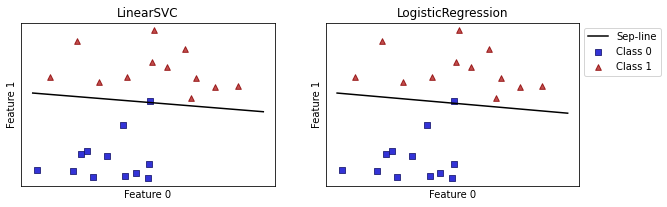

In [ ]:
import numpy as np
from sklearn.datasets import make_blobs
from matplotlib.colors import ListedColormap
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC

NUM_CLASSES = 2
NUM_FEATURES = 2
RANDOM_SEED = 2

X, y = make_blobs(n_samples=24,
                  n_features=NUM_FEATURES,
                  centers=NUM_CLASSES,
                  cluster_std= 2.5, 
                  random_state=RANDOM_SEED)

cmap = ListedColormap(['#0000CD', '#B22222']) 
cedge = ListedColormap(['#191970', '#8B0000'])


fig, axes = plt.subplots(1, 2, figsize=(10, 3))

for model, ax in zip([LinearSVC(), LogisticRegression()], axes):
  clf = model.fit(X, y)
  weight = clf.coef_[0]
  a = -weight[0] / weight[1]
  xx = np.linspace(-6, 6)
  yy = a * xx - (clf.intercept_[0]/weight[1])
  ax.plot(xx, yy, 'k-')

  markers = 's^'
  for m,i in zip(markers,np.unique(y)):
    mask = y==i
    scatter = ax.scatter(X[mask, 0], X[mask, 1],
                          color=cmap.colors[i], edgecolors=cedge.colors[i],
                          alpha=0.8, marker=m, s=2**5, label=i);

    ax.set_title("{}".format(clf.__class__.__name__))
    ax.set_xlabel("Feature 0")
    ax.set_ylabel("Feature 1")
    ax.xaxis.set_ticks([])
    ax.yaxis.set_ticks([])


axes[1].legend(labels = ["Sep-line","Class 0", "Class 1"],
           bbox_to_anchor=(1.0, 1),
           loc='upper left')
plt.show()

In this figure, we have the first feature of the blobs dataset on the x-axis and the second feature on the y-axis, as before. We display **the decision boundaries found by LinearSVC and LogisticRegression** respectively as **straight lines, separating** the areas classified as **class 1 on the top** from the area classified as **class 0 on the bottom**. In other words, any new data point that lies above the black line will be classified as class 1 by the respective classifier, while any point that lies below that black line wll be classified as class 0.

The two models come up with similar decision boundaries. Note that both misclassify two of the points. By default, both models apply an L2 regularization, in the same way the Ridge does for regression.

For LogisticRegression and LinearSVC the trade-off parameter that determines the strength of the regularization is called C, and higher values of C correspond to less regularization. In other words, when you use high value for the parameter C, LogisticRegression and LinearSVC try to fit the training set as best as possible, while with low values of the parameter C, the models put more emphasis on finding a coefficiet vector(w) that is close to zero

There is another interesting aspect of how the parameter C acts, **Using low values of C** will causes the algorithms to try to adjust to the "majority" of data points,** while using a higher value of C stresses the importance the each individual data point be classified correctly.

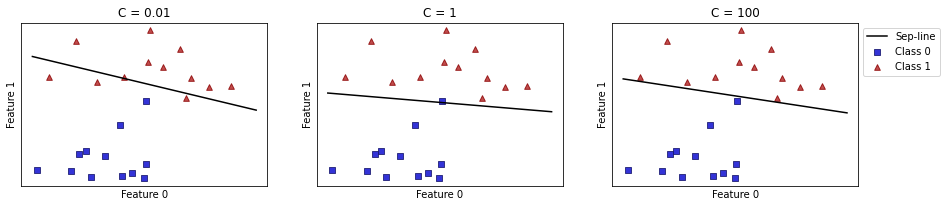

In [ ]:
import numpy as np
from sklearn.datasets import make_blobs
from matplotlib.colors import ListedColormap
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC

NUM_CLASSES = 2
NUM_FEATURES = 2
RANDOM_SEED = 2

X, y = make_blobs(n_samples=24,
                  n_features=NUM_FEATURES,
                  centers=NUM_CLASSES,
                  cluster_std= 2.5, 
                  random_state=RANDOM_SEED)

cmap = ListedColormap(['#0000CD', '#B22222']) 
cedge = ListedColormap(['#191970', '#8B0000'])


fig, axes = plt.subplots(1, 3, figsize=(15, 3))

for c, ax in zip([0.01, 1, 100], axes):
  clf = LinearSVC(C=c, max_iter=10000).fit(X, y)
  weight = clf.coef_[0]
  a = -weight[0] / weight[1]
  xx = np.linspace(-6, 6)
  yy = a * xx - (clf.intercept_[0]/weight[1])
  ax.plot(xx, yy, 'k-')

  markers = 's^'
  for m,i in zip(markers,np.unique(y)):
    mask = y==i
    scatter = ax.scatter(X[mask, 0], X[mask, 1],
                          color=cmap.colors[i], edgecolors=cedge.colors[i],
                          alpha=0.8, marker=m, s=2**5, label=i);

    ax.set_title("{}".format('C = ' + str(c)))
    ax.set_xlabel("Feature 0")
    ax.set_ylabel("Feature 1")
    ax.xaxis.set_ticks([])
    ax.yaxis.set_ticks([])


axes[2].legend(labels = ["Sep-line","Class 0", "Class 1"],
           bbox_to_anchor=(1.0, 1),
           loc='upper left')
plt.show()

One the lefthand side, we have a very small C corresponding to a lot of regularization. Most of the points in class 0 are at the top, and most of the points in class 1 are at the botoom. The strongly regularized model chooses a relatively horizontal line, misclassifying three points.


In the center plot, C is slightly higher (default = 1), and the model focuses more on the three misclassified samples, tilting the decision boundary.

Finally, on the righ-hand side, the **very high value of C** in the model tilts the decision boundary a lot, now correctly classifying all points in both class. The model can seperate all the point with a straight line.

Similarly to the case of regression, linear models for classification might seem very restrictive in low-dimensional spaces, only allowing for decision boundaries that are straight lines or planes. Again, in hight diemnsions, linear models for classification become very powerful, and guarding against overfitting becomes increasingly important when considering more features.

Let's analyze linearLogistic in more detail on the Breast Cancer dataset:

In [ ]:
from IPython.core.application import default
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import train_test_split

cancer = load_breast_cancer()
X_train, X_test, y_train, y_test = train_test_split(cancer.data,
                                                    cancer.target,
                                                    stratify=cancer.target,
                                                    random_state=42)

# Using C = 1 (default)
logreg = LogisticRegression(max_iter=10000).fit(X_train, y_train)
print("Training set score: {:.3f}".format(logreg.score(X_train, y_train)))
print("Test set score: {:.3f}".format(logreg.score(X_test, y_test)))

Training set score: 0.958
Test set score: 0.958


In [ ]:
# Using C=100
logreg100 = LogisticRegression(C=100, max_iter=10000).fit(X_train, y_train)
print("Training set score: {:.3f}".format(logreg100.score(X_train, y_train)))
print("Test set score: {:.3f}".format(logreg100.score(X_test, y_test)))

Training set score: 0.981
Test set score: 0.965


In [ ]:
# Using C=0.01
logreg001 = LogisticRegression(C=0.01, max_iter=10000).fit(X_train, y_train)
print("Training set score: {:.3f}".format(logreg001.score(X_train, y_train)))
print("Test set score: {:.3f}".format(logreg001.score(X_test, y_test)))

Training set score: 0.953
Test set score: 0.951


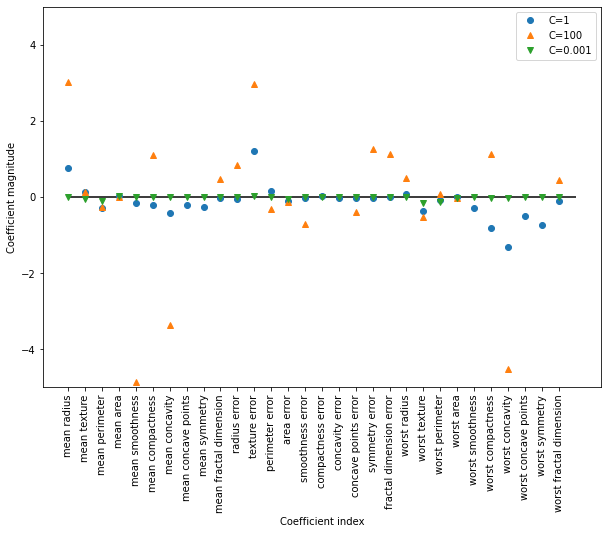

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 7))

plt.plot(logreg.coef_.T, 'o', label="C=1")
plt.plot(logreg100.coef_.T, '^', label="C=100")
plt.plot(logreg001.coef_.T, 'v', label="C=0.001")

plt.xticks(range(cancer.data.shape[1]), cancer.feature_names, rotation=90)
plt.hlines(0, 0, cancer.data.shape[1])
plt.ylim(-5, 5)
plt.xlabel("Coefficient index")
plt.ylabel("Coefficient magnitude")
plt.legend()
plt.show()

Training accuracy of l1 logreg with C=0.001: 0.91
Test accuracy of l1 logreg with C=0.001: 0.92
Training accuracy of l1 logreg with C=1.000: 0.96
Test accuracy of l1 logreg with C=1.000: 0.96
Training accuracy of l1 logreg with C=100.000: 0.99
Test accuracy of l1 logreg with C=100.000: 0.98


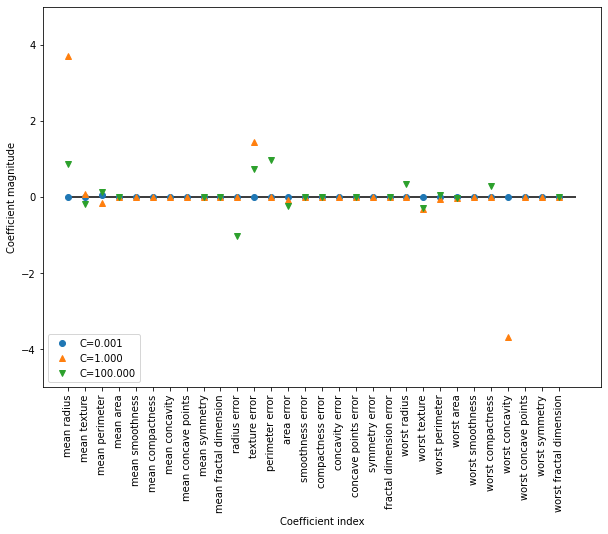

In [ ]:
plt.figure(figsize=(10, 7))

for C, marker in zip([0.001, 1, 100], ['o', '^', 'v']):
  lr_l1 = LogisticRegression(C=C, 
                             penalty="l1",           # l1: lasso, l2: ridge
                             solver='liblinear',
                             max_iter=10000).fit(X_train, y_train)

  print("Training accuracy of l1 logreg with C={:.3f}: {:.2f}".format(
      C, lr_l1.score(X_train, y_train)))
  print("Test accuracy of l1 logreg with C={:.3f}: {:.2f}".format(
      C, lr_l1.score(X_test, y_test)))
  plt.plot(lr_l1.coef_.T, marker, label="C={:.3f}".format(C))


plt.xticks(range(cancer.data.shape[1]), cancer.feature_names, rotation=90)
plt.hlines(0, 0, cancer.data.shape[1])
plt.xlabel("Coefficient index")
plt.ylabel("Coefficient magnitude")
plt.ylim(-5, 5)
plt.legend(loc=3)
plt.show()

**Linear models for multiclass classification**

**Many linear classification models are for binary classification only**, and don't extend naturally to the multiclass case (with the exception of logistic regression).

A common technique to **extend a binary classification algorithm to a multiclass classification algorithm is the one-vs.-rest approach.**

In the one-vs.-rest approach, a binary model is learned for each class that tries to separate the class from all of the other classes, resulting in as many binary models as there are classes. To make a prediction, all binary classifiers are run on a test point. The classifier that has the highest score on its single class "wins," and this class label is returned as the prediction.

Having one **binary classifier** per class result in having **one vector of coefficients (w)** and **one intercept (b)** **for each class**. The class for which the result of the classificaiton confidence formula given here is highest is the assigned class label:

$$w\left[0\right]\:\cdot \:x\left[0\right]\:+\:w\left[1\right]\:\cdot \:x\left[1\right]\:+\:...\:+\:w\left[p\right]\:\cdot \:x\left[p\right]\:+\:b$$



the mathematics behind multiclass logistic regression differ somewhat from the one-vs.-rest approach, but they also result in **one coefficient vector and intercept per class,** and the same method of making a prediction is applied

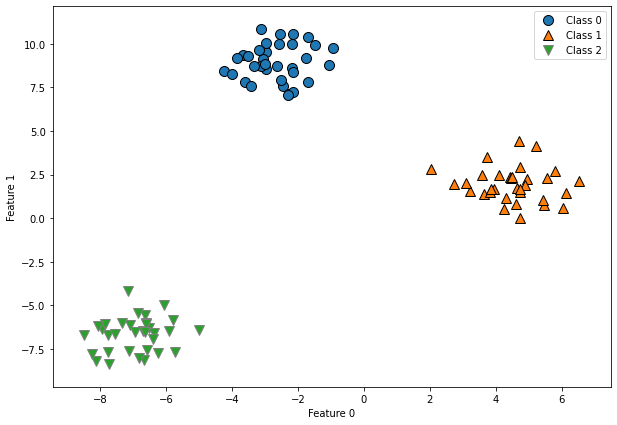

In [ ]:
from sklearn.datasets import make_blobs
import matplotlib.pyplot as plt 
import mglearn

plt.subplots(figsize=(10, 7))

X, y = make_blobs(random_state=42)
mglearn.discrete_scatter(X[:, 0], X[:, 1], y)

plt.xlabel("Feature 0")
plt.ylabel("Feature 1")
plt.legend(["Class 0", "Class 1", "Class 2"])
plt.show()

In [ ]:
X[:5], y[:5]

(array([[-7.72642091, -8.39495682],
        [ 5.45339605,  0.74230537],
        [-2.97867201,  9.55684617],
        [ 6.04267315,  0.57131862],
        [-6.52183983, -6.31932507]]), array([2, 1, 0, 1, 2]))

In [ ]:
from sklearn.svm import LinearSVC

linear_svm = LinearSVC().fit(X, y)

print("Coefficient shape: ", linear_svm.coef_.shape)
print("Intercept shape: ", linear_svm.intercept_.shape)

Coefficient shape:  (3, 2)
Intercept shape:  (3,)


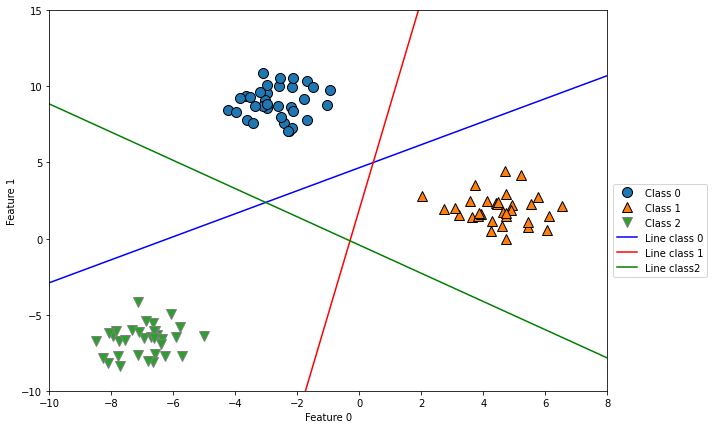

In [ ]:
import numpy as np

plt.subplots(figsize=(10, 7))

mglearn.discrete_scatter(X[:, 0], X[:, 1], y)
line = np.linspace(-15, 15)

for coef, intercept, color in zip(linear_svm.coef_, linear_svm.intercept_,
                                  ['b', 'r', 'g']):
  plt.plot(line, -(line * coef[0] + intercept) / coef[1], c=color)


plt.ylim(-10, 15)
plt.xlim(-10, 8)
plt.xlabel("Feature 0")
plt.ylabel("Feature 1")
plt.legend(['Class 0', 'Class 1', 'Class 2', 'Line class 0', 'Line class 1',
            'Line class2'], loc=(1.01, 0.3))
plt.show()

* เส้นน้ำเงินแบ่ง สีน้ำเงินออกจากทั้งหมด
* เส้นแดงแบ่ง สีแดงออกจากทั้งหมด
* เส้นเขียวแบ่ง สีเขียวออกจากทั้งหมด
* ตรงกลางคือ ตัวที่มีค่ามากที่สุดจากสูตรการแบ่ง

the **triangle in the middle of the plot**?

All three binary classifiers classify points there as "rest." which class would a point there be assigned to? The answer is the **one with the highest value for the classification formula**: the class of the closest line

Text(0, 0.5, 'Feature 1')

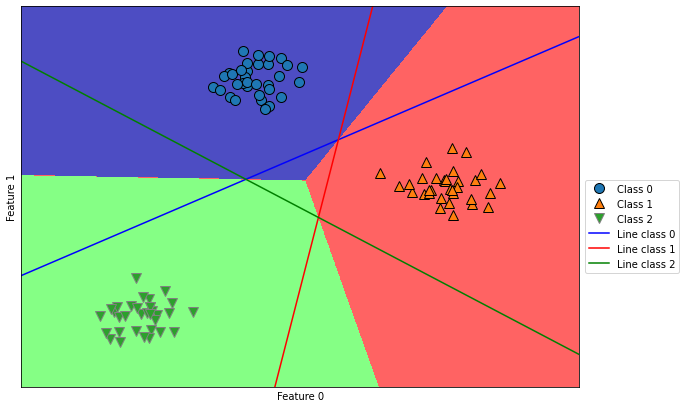

In [ ]:
plt.subplots(figsize=(10, 7))

mglearn.plots.plot_2d_classification(linear_svm, X, fill=True, alpha=.7)
mglearn.discrete_scatter(X[:, 0], X[:, 1], y)
line = np.linspace(-15, 15)
for coef, intercept, color in zip(linear_svm.coef_, linear_svm.intercept_,
                                  ['b', 'r', 'g']):
  plt.plot(line, -(line * coef[0] + intercept) / coef[1], c=color)

plt.legend(['Class 0', 'Class 1', 'Class 2', 'Line class 0', 'Line class 1',
            'Line class 2'], loc=(1.01, 0.3))
plt.xlabel("Feature 0")
plt.ylabel("Feature 1")

**Strenghs, weaknesses, and parameters**

**Parameters**

The **main parameter** of linear models is the **regularization parameter,** called **alpha** in the regression models and **C** in `LinearSVC` and `LogisticRegression`. **Large values** for alpha or **small values** for C mean **simple models.** 

The other decision you have to make is  whether you want ot use **L1 regularization or L2 regularizaiton**. If you assume that **only a few of your features are actually important, you should use L1** Other wise, you should default to L2. 
L1 can also be useful if interpretability of the model is important. As L1 will use only a few features, it is easier to explain which features are important to the model, and what the effects of these features are.

**Strenghts**

**Linear models** are very **fast to train,** and also **fast to predict.** They scale to very large datasets and work well with sparse data. If your data consists of hundreds of thousands or millions of samples, you might want to investigate using the `solver='sag'` option in `LogisticRegression` and `Ridge`, which can be faster than the default on large datasets. Other options are the `SGDClassifier` class and the `SGDRegressor` class, which implement even more scalable versions of the linear models describe here.

Another strength of linear models is that they make it relatively **easy to understand** how a prediction is made, using the formulas was saw earlier for regression and classification. Unfortunately, it is often not entirely clear why coefficients are the way they are. This is particulary ture if your dataset has highly correlated features; in these cases, the coefficients might be hard to interpret.

**Weaknesses**

**Linear models often perform well** when the number of features is **large compared to the number of samples.** They are also often used on very large datasets, simply because it's not feasible to train other models. However, in lower-dimensional spaces, other models might yield better generalization performance. 

### **Naive Bayes Classifiers**

Naive Bayes classifiers are **a family of classifiers** that are quite **similar to the linear models.** However, they **tend to be even faster in training.** The price paid for this efficiency is that naive Bayes models often provide **generalization performance that is slightly worse** than that of linear classifiers like `LogisticRegression` and `LinearSVC`.

The **reason** that naive Bayes models are so efficient is that they **learn parameters by looking at each feature individually** and **collect simple per-class statistics from each feature.** 

There are three kinds of native Bayes classifiers implemented in `scikitlearn`:
* `GaussianNB`
* `BernoulliNB`
* `MultinomialNB`

`GaussianNB` can be applied to any continuous data, while `BernoulliNB` assumes binary data and `MultinomialNB` assumes count data (that is, that each feature represents an integer count of something, like how often a word appears in a sentence). **`BernoulliNB` and `MultinomialNB` are mostly used in text data classification.**

The `BernoulliNB` classifier counts how often every feature of each class in not zero. This is most easily understood with an example:

In [ ]:
import numpy as np

X = np.array([[0, 1, 0, 1],
              [1, 0, 1, 1],
              [0, 0, 0, 1],
              [1, 0, 1, 0]])

y = np.array([0, 1, 0, 1])

Here, we have four data points, with four binary features each. There are two classes, 0 and 1. For class 0 (the first and third data points), the first feature is zero two times and nonzero zero times, the second feature is zero one time and nonzero one time, and so on. These same counts are then calculated for the data points in the second class. Counting the nonzero entries per class in essence looks like this: 

In [ ]:
counts = {}
for label in np.unique(y):
  # iterate over each class
  # count (sum) entries of 1 per feature
  counts[label] = X[y == label].sum(axis=0)
print("Feature counts:\n{}".format(counts))

Feature counts:
{0: array([0, 1, 0, 2]), 1: array([2, 0, 2, 1])}


The other two naive Bayes models, `MultinomialNB` and `GaussianNB`, are slightly different in **what kinds of statistics they compute.** 

* `MultinomialNB` takes into account the **average value of each feature for each class** 
* `GaussianNB` stores the average value as well as the **standard deviation of each feature for each class.**

To make a prediction, a data point is compared to the satistics for each of the classes, and the best matching class is predicted. Interestingly, for both `MultinomialNB` and `BernoulliNB`, this leads to a prediction formula that is of the same form as in the linear models. Unfortunately, **`coef_` for the native Bayes models** has a somewhat different meaning than in the linear models, in that **`coef_` is not the same as <i>w</i>**.

**Strengths, weaknesses, and parameters**

`MultinomialNB` and `BernoulliNB` have a single parameter, `alpha`, which **controls model complexity.** The way alpha works is that the algorithm adds to the data `alpha` many virtual data points that have positive values for all the features. This results in a **"smoothing" of the statistics. A large alpha means more smoothing,** resulting in less complex models. The algorithm's performance is relatively robust to the setting of `alpha`, meanign that setting `alpha` is not critical for good performance. However, tuning it usually improves accuracy somewhat.

`GaussianNB` is mostly used on very **high-dimensional data**, while the other two variants of naive Bayes are widely used for sparse count data such as **text**. `MultinomialNB` usually performs better than `BinaryNB`, particularly on datasets with a relatively large number of nonzero feature (i.e., large documents).

The naive Bays models share many of the strengths and weaknesses of the linear models. **They are very fast to train and to predict,** and the **training procedure is easy to understand.** The models work very well with high-dimensional sparse data and are relatively robust to the parameters. Naive Bayes models are great baseline models and ar often used on very large datasets, where training even a linear models might take too long.

### **Decision Trees**

Decision trees are widely used models for **classificaiton and regression** tasks. Essentially, they **learn a hierarchy of if/else questions, leading to a decision.**

These questions are similar to the questions you might **ask in a game of 20 Questions.**

Imagine you want to distinguish between the following four animals: 
- bears
- hawks
- penguins
- dolphins

Your goal is to get the right answer by asking a few if/else question that narrows down your possible animals to just two. If the answer is "yes," you can ask another question that could help you distinguish between hawks and penguins. 

For example, you could ask whether the animal can fly. If the animal doesn't have feathers, you possible animal choices are dolphins and bears, and you will need to ask a question to distinguish between these two animals -for example, asking whether the animal has fins.


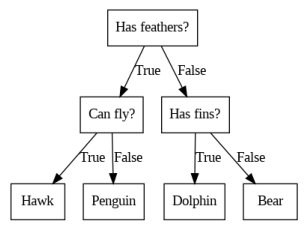

In [ ]:
import mglearn

mglearn.plots.plot_animal_tree()

each node in the tree ither represents a question or a terminal node (also called a leaf) that contains the answer. The edges connect the answers o a question with the next question you would ask.

In machine learning parlance, we built a model to **distinguish between four classes of animal** (hawks, penguins, dolphins, and bears) usin the **tree features** 
* "has feathers" 
* "can fly"  
* "has fins".

Instead of building these models by hand, we can learn them from data using supervise learning.

**Building decision trees**

**A decision for the 2D classification data set.** the data set consists of two half-moon shapes, with each class cosisting of 75 data points. We will referto this dataset as two_moons.

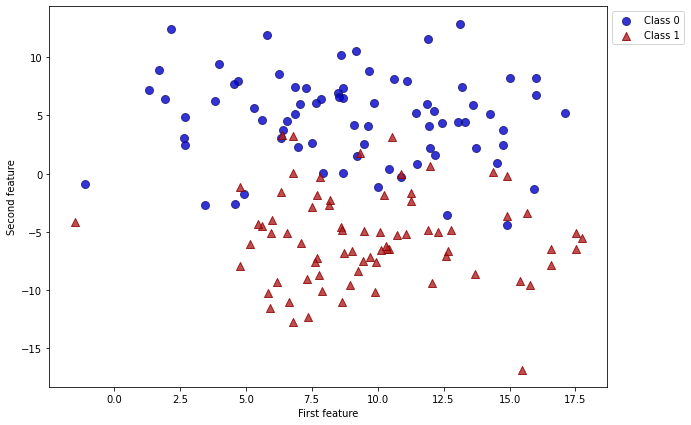

X shape: (150, 2)
y shape: (150,)


In [ ]:
# Generating dataset for a classification example.
import numpy as np
from sklearn.datasets import make_blobs
from matplotlib.colors import ListedColormap
import matplotlib.pyplot as plt

NUM_CLASSES = 2
NUM_FEATURES = 2
RANDOM_SEED = 24

X, y = make_blobs(n_samples=150,
                  n_features=NUM_FEATURES,
                  centers=NUM_CLASSES,
                  cluster_std=4, 
                  random_state=RANDOM_SEED)

plt.figure(figsize=(10, 7))

cmap = ListedColormap(['#0000CD', '#B22222']) 
cedge = ListedColormap(['#191970', '#8B0000'])

markers = 'o^'
for m,i in zip(markers,np.unique(y)):
  mask = y==i
  scatter = plt.scatter(X[mask, 0], X[mask, 1],
                        color=cmap.colors[i], edgecolors=cedge.colors[i],
                        alpha=0.8, marker=m, s=2**6, label=i);


plt.legend(labels = ["Class 0", "Class 1"],
           bbox_to_anchor=(1.0, 1),
           loc='upper left')


plt.xlabel("First feature")
plt.ylabel("Second feature")
plt.show()

print("X shape: {}".format(X.shape))
print("y shape: {}".format(y.shape))

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    random_state=42)

tree = DecisionTreeClassifier(random_state=0)
tree.fit(X_train, y_train)

print("Accuracy on training set: {:.3f}".format(tree.score(X_train, y_train)))
print("Accuracy on test set: {:.3f}".format(tree.score(X_test, y_test)))

Accuracy on training set: 1.000
Accuracy on test set: 0.895


**Controlling complexity of decision trees**

Building a tree are continuing until **all leaves are pure** leads to models that are **very complex and highly overfit** to the training data. the presence of pure leaves mean that **a tree is 100% accurate on the training set**; each data point in the training set is in a leaf that has the correct majority class.

There are **two common strategies to prevent overfitting**:
* stopping the creation of the tree early (also called pre-pruning)
* building the tree but then removing or collapsing nodes that contain little information (also called post-pruning or just pruning).

Possible **criteria for pre-pruning** include:
* limiting the maximum depth of the tree, 
* limiting the maximum number of leaves, 
* requiring a minimum number of points in a node to keep splitting it.

Decision trees in `scikit-learn` ar implemented in the `DecisionTreeRegressor` and `DecisionTreeClassifier` classes. `scikit-learn` only implements pre-pruning, not post-pruning

Let's look at the effect of pre-pruning in more detail on the Breast Cancer dataset. As always, we import the dataset and split it into a training and a test part. Then we build a model using the default setting of fully developing the tree (growing the tree until all leaves are pure). We fix the `random_state` in the tree, which is used for  tie-breaking internally:

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import train_test_split

cancer = load_breast_cancer()
X_train, X_test, y_train, y_test = train_test_split(cancer.data,
                                                    cancer.target,
                                                    stratify=cancer.target,
                                                    random_state=42)

tree = DecisionTreeClassifier(random_state=0)
tree.fit(X_train, y_train)

print("Accuracy on training set: {:.3f}".format(tree.score(X_train, y_train)))
print("Accuracy on test set: {:.3f}".format(tree.score(X_test, y_test)))

Accuracy on training set: 1.000
Accuracy on test set: 0.937


As expected, the accuracy on the training set is 100% -because the leaves are pure, the tree was grown deep enough that is could perfectly memorize all the labels on the training data. The test set accuracy is slightly worse than for the linear models we looked at previously, which had around 95% accuracy.

If we **don't restrict** the depth of a decision tree, the tree can become arbitrarily **deep and complex**. Unpruned trees are therefore prone to **overfitting and not generalizing well to new data**. 

Now let's apply pre-pruning to the tree, which will **stop developing the tree before we perfectly fit** to the training data. One option is to stop building the tree after a certain depth has been reached. Here we set `max_depth=4`, meaning only four consecutive questions can be asked. Limiting the depth of the tree decreases overfitting. T**his leads to a lower accuracy on the training set, but an improvement on the test set**:



In [ ]:
tree = DecisionTreeClassifier(max_depth=4, random_state=0)
tree.fit(X_train, y_train)

print("Accuracy on training set: {:.3f}".format(tree.score(X_train, y_train)))
print("Accuracy on test set: {:.3f}".format(tree.score(X_test, y_test)))

Accuracy on training set: 0.988
Accuracy on test set: 0.951


**Analyzing decision trees**

We can **visualize** the tree using the **`export_graphviz`** function from the tree module. This writes a file in the .dot file format, which is a text file format for storing graphs. We set an option to color the nodes to reflect the majority class in each node and pass the class and features names so the tree can be properly labeled:

In [ ]:
from sklearn.tree import export_graphviz

export_graphviz(tree, out_file='tree.dot', class_names=["malignant", "benign"],
                feature_names=cancer.feature_names, impurity=False, filled=True)

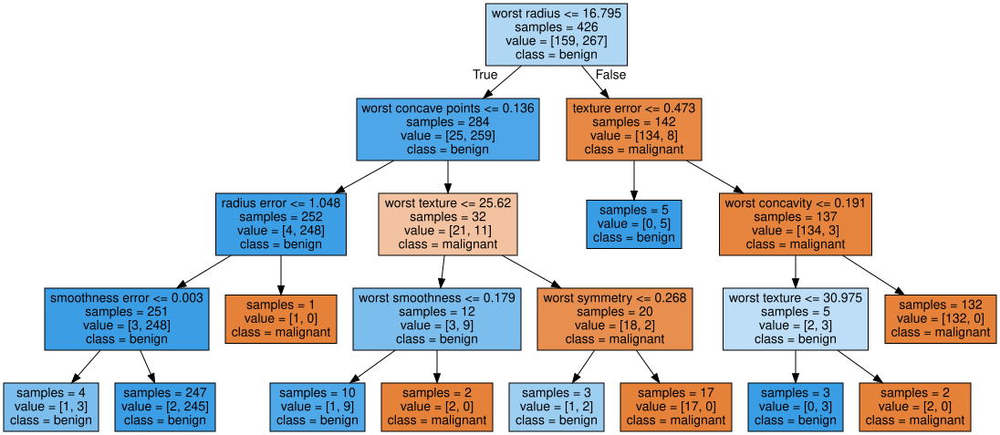

In [ ]:
import graphviz

with open("tree.dot") as f:
  dot_graph = f.read()
graphviz.Source(dot_graph)

The visualization of  the tree provides a great in-depth view of how the algorithm makes predictions, and is a good example of a machine learning algorithm that is **easily explained to nonexperts.** However, even with a tree of depth four, as seen here, the tree can become a bit ovewhelming. Deeper trees (a depth of 10 is not uncommon) are even harder to grasp. **One method of inspecting the tree that may be helpful is to find out which path most of the data actually takes**. The `n_samples` shown in each node gives the number of samples in the node, while value provides the number of samples per class. Following the branches to the right, we see that `worst radius <= 16.795` creates a node that  contains only 8 benign but 134 malignant samples. The rest of this side of the tree then uses some finer distinctions to split off these 8 remaining benign samples. Of the 142 samples that went to the right in the initial split, nearly all of them (132) end up in the leaf to the very right. Taking a left at the root, for `worst radius > 16.795` we end up with 25 malignant and 259 benign samples. Nearly all of the benign samples end up in the second leaf from the right, with most of the other leaves containing very few samples.

**Feature importance in trees**

Instead of looking at the whole tree, which can be taxing, there are some useful properties that we can derive to summarize the working of the tree. The most commonly used summary is **feature importance,** which **rates how important each feature is for the decision a tree makes.** It is a nujber between 0 and 1 for each feature, where 0 means "not used at all" and 1 means "perfectly predicts the target." The feature importances always sum to 1:

In [ ]:
print("Feature importances:\n{}".format(tree.feature_importances_))

Feature importances:
[0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.01019737 0.04839825
 0.         0.         0.0024156  0.         0.         0.
 0.         0.         0.72682851 0.0458159  0.         0.
 0.0141577  0.         0.018188   0.1221132  0.01188548 0.        ]


In [ ]:
def plot_feature_importances_cancer(model):
  n_features = cancer.data.shape[1] 
  plt.barh(range(n_features), model.feature_importances_, align='center')
  plt.yticks(np.arange(n_features), cancer.feature_names)
  plt.xlabel("Feature importance")
  plt.ylabel("Feature")

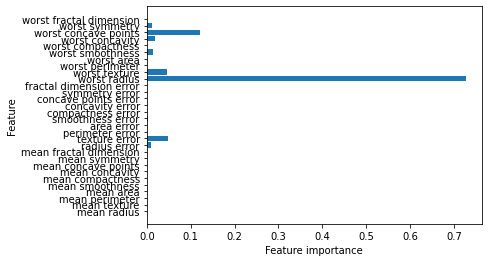

In [ ]:
plot_feature_importances_cancer(tree)

Here we see that **the feature used in the top split ("worst radius") is by far  the most important feature**. This confirms our observation in analyzing the tree that the first level already separates the two classes fairly well

However, if a feature has a low `feature_importance`, it doesn't mean that this feature is uninformative. it only means that the feature **was not picked by the tree**, likely because another feature encodes the same information.

In contrast to the coefficients in linear models, feature importances are always positive, and don't encode which class a feature is indicative of. The feature importances tell us that "worst radius" is important, but not whether a high radius is indicative of sample being bening or malignant. In fact, there might ntot be such a simple relationship between features and calss, as you can see in the following example

Feature importances: [0. 1.]


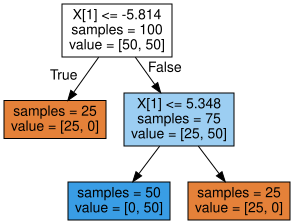

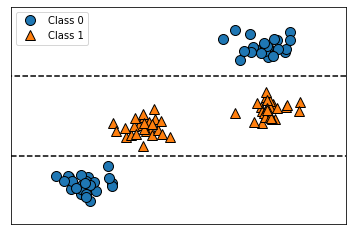

In [ ]:
import mglearn

tree = mglearn.plots.plot_tree_not_monotone()
display(tree)

The plot shows a dataset with two feature and two classes. Here, all the information is contained in X[1], and X[0] is not used at all. But the relation between X[1] and the output class is not monotonous, meaning we cannot say "a high value of X[0] means class 0, and a low value means class 1" (or vice versa).

While we focused our discussion here on decision trees for classification, all that was said is similarly true for decision trees for regression, as implemented in `DecisionTreeRegressor`. The usage and analysis of regression trees is very similar to that of classification trees. There is one particular property of using tree-based models for regression that we want to point out, though. The `DecisionTreeRegressor` (and all other tree-based regression models) is not able to extrapolate, or make predictions outside of the range of the training data.

Let's look into this is more detail, using a dataset of historical computer memory (RAM) prices. The figure below shows the dataset, with the date on the x-axis and the price of one megabyte of RAM in that year on the y-axis:

Text(0, 0.5, 'Price in $/Mbyte')

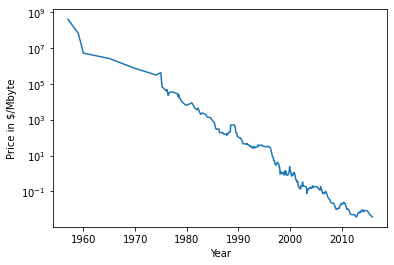

In [ ]:
 import pandas as pd

 ram_prices = pd.read_csv("data/ram_price.csv")

 plt.semilogy(ram_prices.date, ram_prices.price)
 plt.xlabel("Year")
 plt.ylabel("Price in $/Mbyte")

Note the logarithmic scale of the y-axis. When plotting logarithmically, the relation seems to be quite linear and so should be relatively easy to predict, apart from some bumps.

We will make a forecast for the years after 200 using the historical data up to that point, with the date as our only feature. We will compare two simple models: a `DecisionTreeRegressor` and `LinearRegression`. We rescale the prices using a logarithm, so that the relationship is relatively linear. This doesn't make a difference for the `DecisionTreeRegressor` but it makes a big difference for `LinearRegression`. After training the models and making preditions, we apply the exponential map to undo the logarithm transform. We make predictions on the whole dataset for visualization purposes here, but for a quantitative evaluation we would only consider  the test dataset:

In [ ]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression
import numpy as np

# use historical data  to forecast prices afte rthe year 2000
data_train = ram_prices[ram_prices.date < 2000]
data_test = ram_prices[ram_prices.date >= 2000]

# predict prices based on date
X_train = data_train.date[:, np.newaxis]
# We use a log-transform t oget a simpler relationship of data to target
y_train = np.log(data_train.price)

tree = DecisionTreeRegressor().fit(X_train, y_train)
linear_reg = LinearRegression().fit(X_train, y_train) 

# predict on all data
X_all = ram_prices.date[:, np.newaxis]

pred_tree = tree.predict(X_all) 
pred_lr  = linear_reg.predict(X_all)

# undo log-transform
price_tree = np.exp(pred_tree)
price_lr = np.exp(pred_lr)

<ipython-input-34-63bc236b5464>:10: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  X_train = data_train.date[:, np.newaxis]
<ipython-input-34-63bc236b5464>:18: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  X_all = ram_prices.date[:, np.newaxis]


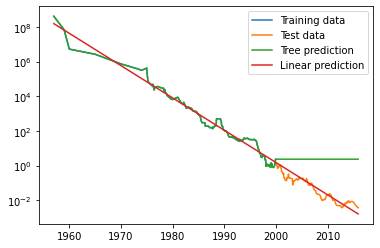

In [ ]:
plt.semilogy(data_train.date, data_train.price, label="Training data")
plt.semilogy(data_test.date, data_test.price, label="Test data")
plt.semilogy(ram_prices.date, price_tree, label="Tree prediction")
plt.semilogy(ram_prices.date, price_lr, label="Linear prediction")
plt.legend()
plt.show();

The difference between the models is quite striking. The linear model approximates the data with a line, as we knew it would. This line provides quite a good forecast for the test data (the years after 2000), while glossing over some of the finer variations in both the training and the test data. The tree model, on the other hand, makes perfect predictions on the training data; we did not restrict the complexity of  the tree, so it learned the whole dataset by heart. However, once we leave the  data range for which the model has data, the model simply keeps predicting the last known point. The tree has no ability to generate "new" responses, outside of what was seen in the training data. This shortcoming applies to all models based on trees.

**Strengths, weaknesses, and parameters**

As discussed earlier, the parameters that control model complexity in decision trees are the pre-pruning parameters that stop the building of the tree before it is fully developed. Usually, picking one of  the pre-pruning strategies-setting either `max_depth`, `max_leaf_nodes` or `min_samples_leaf` is sufficient to prevent overfitting.

Decision trees have two advantages over many of the algorithms we've discussed so far: the resulting **model can easily be visualized and understood by nonexperts** (at least for smaller trees), and the algorithms are completely **invariant to scaling of the data**. As each feature is processed separately, and the possible splits of the data don't depend on scaling, on preprocessing like normalization or standardization of features is needed for desicion tree algorithms. In particular, decision trees work well when you have features that are on completely different scales, or a mix of binary and continuous features.

The main downside of decision trees is that even with the use of pre-pruning, they tend to overfit and provide poor generalization performance. Therefore, in most applications, the ensemble methods we discuss next are usually used in place of a single decision tree.

### **Ensembles of Decision Trees**

**Ensembles** are methods that **combine multiple machine learning models** to create more powerful models. There are many models in the machine learning literature that belong to this category, but there are **two ensemble models that have proven to be effective** on a wide range of datasets for classification and regression, both of which use **decision trees** as their building blocks: **random forest** and **gradient boosted decision trees**. 

#### **Random Forests**

As we just observed, a main **drawback of decision trees** is that they tend to **overfit** the training data. Random forests are one way to address this problem. 

A random forest is essentially a collection of decision trees, where each tree is slightly different from the others. The idea behind random forests is that each tree might do a relatively good job of predicting, but will likely overfit on part of the data. If we build many trees, all of which work well and overfit in different ways, we can reduce the amount of overfitting by averaging their results. This reduction is overfitting, while retaining the predictive power of the trees, can be shown using rigorous mathematics.

To implement this strategy, we need to build many decision trees. Each tree should do an acceptable job of predicting the target, and should also be different from the other trees. Random forests get hteir name from injecting randomness into the tree building to ensure each tree is different. There are two ways in which the trees in a random forest are randomized: by selecting the data points used to build a tree and by selecting the features in each split test. Let's go into this process in more detail.

**Building random forests**

To build a random forest models, you need to decide on the number of trees to build (then `n_estimators` parameter of `RandomForestRegressor` or `RandomForestClassifier`). Let's say we want to build 10 trees. These trees will built completely independently from each other, and the algorithm will make different random choices for each tree to make sure the trees are distinct. To build a tree, we first take what is called a **bootstrap sample** of our data. That is, from out `n_samples` data points, we repeatedly draw an example randomly with replacement (meaning the same sample can be picked multiple times), `n_samples` times. This will create a data-set that is as big as the original dataset, but some data points will be missing from it (approximately one third), and some will be repeated.


To illustrate, let's say we want to create a bootstrap sample of the list ['a', 'b', 'c', 'd']. 

A possible bootstrap sample whould be ['b', 'd', 'd', 'c']. Another possible sample would be ['d', 'a', 'd', 'a'].

Next, a decision tree is built based on this newly created dataset. However, the algorithm we described for the decision  tree is slightly modified. Instead of looking for the best test for each node, in each node the **algorithm randomly selects a subset of the features**, and it looks for the best possible test involving one of these features. The number of features that are selected is controlled by the `max_features` parameter. This selection of a subset of features is repeated separately in each node, so that each node in a tree can make a decision using a different subset of the features.



The bootstrap sampling leads to each decision tree in the random forest being built on a slightly different dataset. Because of the selection of features in each node, each split in each tree operates on a different subset of features. Togehter, these two mechanisms ensure that all the trees in the random forest are different.



A critical parameter in this process is `max_features`. If we set `max_features` to `n_featues` that means that each split can look at all featues in the dataset, and no randomness will be injected in the feature selection (the randomness due to the bootstrapping remains, though). If we set `max_features` to 1, that means that the splits have no choice at all on which feature to test, and can only search over different thresholds for the feature that was selected randomly. Therefore, a high `max_features` means that the trees in the random forest will be quite similar, and they will be able to fit the data easily, using the most distinctive features. A low `max_features` means that the trees i nthe random froest will be quite different, and that each tree might need to be very deep in order to fit the data well.


To make a prediction using the random forest, the algorithm first makes a prediction for every tree in the forest. For regression, we can average thses results to get our final prediction. For classification, a "soft voting" strategy is used. This means each algorithm makes a "soft" prediction, providing a probability for each possible output label. The probabilities predicted by all the trees are averaged, and the class iwth the highest probability is predicted.



**Analyzing random forests**

Lets' apply a random forest consisting of five trees to the `two_moons` dataset we studied earlier:

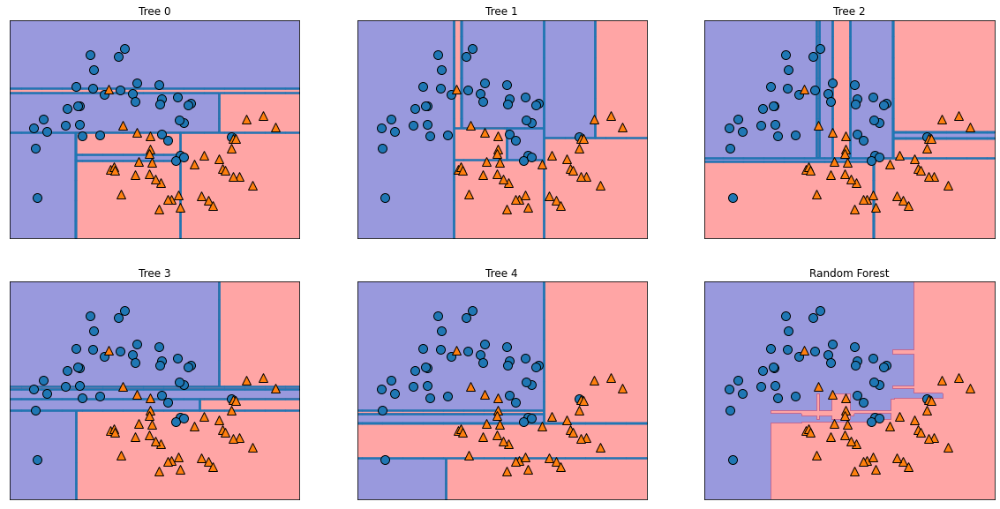

Decision boundaries found by five randomized decision trees and the
decision boundary obtained by average their predicted probabilities


In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_moons
from sklearn.model_selection import train_test_split

X, y = make_moons(n_samples=100, noise=0.25, random_state=3)
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y,
                                                    random_state=42)

forest = RandomForestClassifier(n_estimators=5, random_state=2)
forest.fit(X_train, y_train)

fig, axes = plt.subplots(2, 3, figsize=(20, 10))
for i, (ax, tree) in enumerate(zip(axes.ravel(), forest.estimators_)):
  ax.set_title("Tree {}".format(i))
  mglearn.plots.plot_tree_partition(X_train, y_train, tree, ax=ax)

mglearn.plots.plot_2d_separator(forest, X_train, fill=True, ax=axes[-1, -1],
                                alpha=.4)

axes[-1, -1].set_title("Random Forest")
mglearn.discrete_scatter(X_train[:, 0], X_train[:, 1], y_train)

plt.show()

print("Decision boundaries found by five randomized decision trees and the\n\
decision boundary obtained by average their predicted probabilities")

Decision boundaries found by five randomized decision trees and the decision boundary obtained by average their predicted probabilities

You can clearly see that the decision boundaries learned by the five trees are quite different. Each of them make some mistakes, as some of the training points that are plotted here were not actually included in the training sets of the trees, due to the bootstrap sampling.

The random forest overfits less then any of the trees individually, and provides a much more intuitive desition boundary. In any real application, we would use many more trees (often hundreds of thoudands), leading to even smoother boundaries.

As another example, let's apply a random forest consisting of 100 trees on the Breast Cancer dataset:

In [ ]:
from sklearn.datasets import load_breast_cancer 

cancer = load_breast_cancer()

X_train, X_test, y_train, y_test = train_test_split(cancer.data,
                                                    cancer.target,
                                                    random_state=0) 

forest = RandomForestClassifier(n_estimators=100, random_state=0)
forest.fit(X_train, y_train)

print("Accuracy on training set: {:.3f}".format(forest.score(X_train, y_train)))
print("Accuracy on test set: {:.3f}".format(forest.score(X_test, y_test)))

Accuracy on training set: 1.000
Accuracy on test set: 0.972


The random forest gives us an accuracy of 97%, better than the linear models or a single decision tree, without tuning any parameters. We could adjust `max_features` setting, or apply pre-pruning as we did for the single decision tree. However, often the default parameters of the random forest already work quite well.

Similarly to the decision tree, the random forest provides feature importances, which are computed by aggregating the feature importances over the trees in the forest. Typincally, the feature importances provided by the random forest are more reliable than the ones provided by a single tree. 

Feature importances computed from a random forest that was fit to Breast Cancer dataset


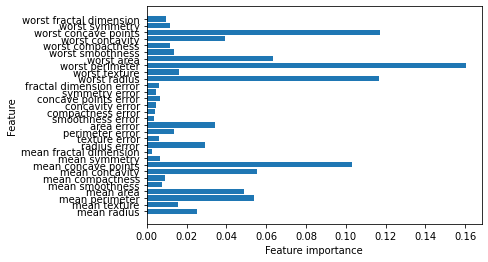

In [ ]:
plot_feature_importances_cancer(forest)

print("Feature importances computed from a random forest that was fit to\
 Breast Cancer dataset")

As you can see, the radom forest gives nonzero importance to many more features than the single tree. Similarly to the single decision tree, the random forest also gives a lot of importance to the "worst radius" feature, but it actually chooses "worst perimeter" to be the most informative feature overall. The randomness in building the random forest forces the algorithm to consider many possible explanations, the result being that the random forest captures a much broader picture of the data than a single tree.

**Strengths, weaknesses, and parameters**

Random forests for regression and classification are currenly among the most widely used machine learning methods. They are very powerful, often work well without heavy turning of the parameters, and don't require scaling of the data.

Essentially, random forests share all of the benerits of decision trees, while making up for some of their deficiencies, One reason to still use decision trees is if you need a compact representation of the decision-making process. It is basically impossible to interpret tens or hundereds of trees in detail, and trees in random forests tend to be deeper than decision trees (because of the use of feature subsets). Therefore, if you need to summarize the prediction making in a visual way to nonexperts, a single decision tree might be a better choice. While building random forests on large data-sets might be somewhat time consuming, it can be parallelized across multiple CPU cores within a computer easily. If you are using a multi-core processor (as nearly all modern computers do), you can use the `n_jobs` parameter to adjust the number of cores to use. Using more CPU cores will result in linear speed-ups(using two croes, the training of the random forest will be twice as fast), but specifying `n_jobs` larger than the number of corse will not help. You can set `n_jobs=-1` to use all the cores in your computer.

You should keep in mind that random forests, by their nature, are random, and setting different radom states (or not setting the `random_state` at all) can drastically change the model that is built. The more trees there are in the forest, the more robust it iwll be against the choice of random state. If you want to have reproducible results, it is important to fix the `random_state`.

Random forests don't tend to perform well on very high dimensional, sparse data, such as text data. For this kind of data, linear models might be more appropriate. Random forests usually work well even on very large datasets, and training can easily be parallelized over many CPU cores within a powerful computer. However, random forests require more memory and are slower to train and to predict than linear models. If time and memory are important in an application, it might make sense to use a linear model instead.

The important parameters to adjust are `n_estimators`, `max_features` and possibly pre-pruning options like `max_depth`. For `n_estimators`, larger is always better. Averageing more trees will yield a more robust ensemble by reducing overfitting. However, there are diminishing returns, and more trees need more memory and more time to train. A common rule of thumb is to build "as many as you have time/memory for."

As described earlier, `max_features` determines how random each tree is, and a smaller `max_features` reduces ovefitting. In general, it's good rule of thumb to use the default values: `max_features=sqrt(n_features)` for classification and `max_features=log2(n_features)` for regression. Adding `max_features` or `max_leaf_nodes` might sometimes improve performance. It can also drastically reduce space and time requirements for training and prediction.

#### **Gradient boosted regression tress (gradient boosting machines)**

The gradient boosted regression tree is another ensemble method that combinas multiple decision trees to create a more powerful model, Despite the "regression" in the name, these models can be used for regression and classification. In contranst to the random forest approach, gradient boosting works by building trees in a serial manner, where each tree tries to correct the mistakes of the previous one. By default, there is no randomization in gradient boosted regression trees; intead, strong pre-pruning is used. Gradient boosted trees often use very shallow trees, of depth one to five, which makes the model smaller in terms of memory and makes predictions faster.

The main idea behind gradient boosting is to combine many simple models (in this context known as weak learners), like shallow trees. each tree can only provide good predictions on part of the data, and so more and more trees are added to iteratively improve performance.

Gradient boosted trees are frequently the winning entries in machine learning competitons, and are widely used in industry. They are generally a bit more sensitive to parameter settings than random forests, but can provide better accuracy if the parameters are set correctly.

Apart from the pre-pruning and the number of trees in the ensemble, another important parameter of gradient boosting is the `learning_rate` which controls how strongly each tree tries to correct the mistakes of the previous trees. A higher learning rate means each tree can make stronger corrections, allowing for more complex modeles. Adding more trees to the ensemble, which can be accomplished by increasing `n_estimators`, also increases the model complexity, as the model has more chances to correct mistakes on the training set.

Here is an example of using `GradientBootingClassifier` on the Breast Cancer dataset. By default, 100 trees of maximum depth 3 and a learning rate of 0.1 are used:

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.datasets import load_breast_cancer

cancer = load_breast_cancer()

X_train, X_test, y_train, y_test = train_test_split(cancer.data,
                                                    cancer.target,
                                                    random_state=0)

gbrt = GradientBoostingClassifier(random_state=0)
gbrt.fit(X_train, y_train)

print("Accuracy on training set: {:.3f}".format(gbrt.score(X_train, y_train)))
print("Accuracy on test set: {:.3f}".format(gbrt.score(X_test, y_test)))

Accuracy on training set: 1.000
Accuracy on test set: 0.965


As the training set accuracy is 100%, we are likely to be overfitting. To reduce overfitting, we could either apply stronger pre-pruning by limiting the maximum depth or lower the learning rate:

In [ ]:
gbrt = GradientBoostingClassifier(random_state=0, max_depth=1)
gbrt.fit(X_train, y_train)

print("Accuracy on training set: {:.3f}".format(gbrt.score(X_train, y_train)))
print("Accuracy on test set: {:.3f}".format(gbrt.score(X_test, y_test)))

Accuracy on training set: 0.991
Accuracy on test set: 0.972


In [ ]:
grbt = GradientBoostingClassifier(random_state=0, learning_rate=0.01)
grbt.fit(X_train, y_train)

print("Accuracy on training set: {:.3f}".format(gbrt.score(X_train, y_train)))
print("Accuracy on test set: {:.3f}".format(gbrt.score(X_test, y_test)))

Accuracy on training set: 0.991
Accuracy on test set: 0.972


Both methods of decreasing the model complexity reduced the traiing set accuracy, as expected. In this case, lowering the maximum depth of the trees provided as significant improvement of the model, while lowering the learning rate only increased the generalization performance slightly.

As for the other decision tree-based models, we can again visualize the feature importances to get more insight into our model. As we used 100 trees, it is impractical to inspect them all, even if they are all of depth 1:

Freature importances computed from a gradient boosting
classifier that was fit to the Breast Cancer dataset


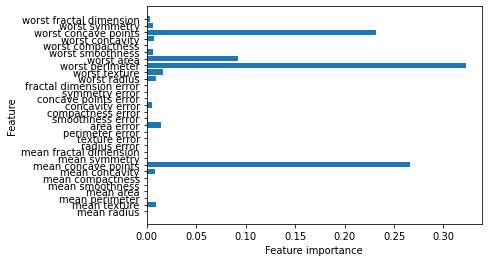

In [ ]:
gbrt = GradientBoostingClassifier(random_state=0, max_depth=1)
gbrt.fit(X_train, y_train)

plot_feature_importances_cancer(gbrt)

print("Freature importances computed from a gradient boosting\n\
classifier that was fit to the Breast Cancer dataset")

We can see that the feature importances of the gradient boosted trees are somewhat similar to the freature importances of the random forests, though the gradient boosting completely ignored some of the features.

As both gradient boosting and random forests perform well on similar kinds of data, a common approach is to first try random forests, which work quite robustly. If random forests work well but prediction time is at a preminum, or it is important to squeeze out the last percentage of accuracy from the machine learning model, moving to gradient boosting often helps.

If you want to apply gradient boosting to a large-scale problem, it might be worth looking into the `xgboost` package and its Python interface, which at the time of writing is faster (and sometimes easier to tune) than the `scikit-learn` implementation of gradient boosting on many datasets.

**Strengths, Weaknesses, and parameters**

Gradient boosted decision trees are among the most powerful and widely used models for supervised learning. Their main drawback is that they require careful tuning of the parameters and may take a long time to train. Similary to other tree-based models, the algorithm works well without scaling and on a mixture of binary and continuous features. As with other tree-based models, it also often does not work well on high-dimensional sparse data.

The main parameters of gradient boosted tree models are the number of trees, `n_estimators`, and the `learning_rate`, which controls the degree to which each tree is allowed to correct the mistakes of the previous trees. These two parameters are highly interconnected, as a lower `learning_rate` means that more trees are needed to build a model of similar complexity. In contrast to random forests, where a higher `n_estimators` value is always better, increasing `n_estimators` in gradient boosting leads to a more complex model, which may lead to overfitting. A common practice is to fit `n_estimators` depending on the time and memory budget, and then search over different `learning_rates`.

Another important parameter is `max_depth` (or alternatively `max_leaf_nodes`), to reduce the complexity of each tree. Usually `max_depth` is set very low for gradient boosted models, often not deeper than five splits.

### **Kernalized Support Vector Machines**

Kernalized support vector machines (often just referred to as SVMs) are an extension that allows for more complex models that are not defined simply by hyperplanes in the input space. While there are support vector machines for classification and regression, we will restrict ourselves to the classification case, as implemented in `SVC`. Similar concepts apply to support vector regression, as implemented in `SVR`


**Linear models and nonlinear features**

**linear models** can be quite **limiting in low-dimensional spaces**, as lines and hyperplanes have limited flexibility. One way to make a linear model more flexible is by adding more features -for example, by adding interactions or polynomials of the input features.



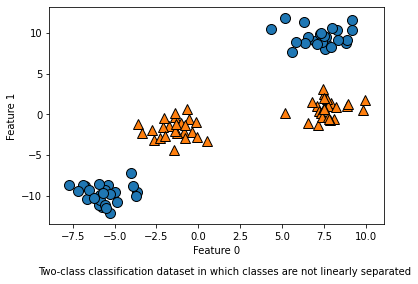

In [ ]:
from sklearn.datasets import make_blobs 
import matplotlib.pyplot as plt
import mglearn

X, y = make_blobs(centers=4, random_state=8)
y = y % 2

mglearn.discrete_scatter(X[:, 0], X[:, 1], y)
plt.xlabel("Feature 0")
plt.ylabel("Feature 1")

plt.figtext(0.1, -0.05, "Two-class classification dataset in which\
 classes are not linearly separated")

plt.show()


A linear model for classification can only separate points using a line, and will not be able to do a very good job on this dataset.

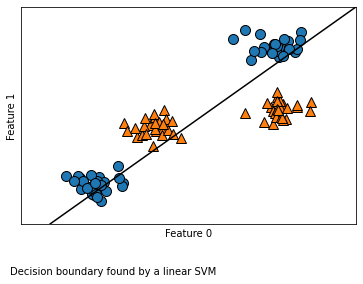

In [ ]:
from sklearn.svm import LinearSVC

linear_svm = LinearSVC(max_iter=100000).fit(X, y)

mglearn.plots.plot_2d_separator(linear_svm, X)
mglearn.discrete_scatter(X[:, 0], X[:, 1], y)

plt.xlabel("Feature 0")
plt.ylabel("Feature 1")

plt.figtext(0.1, -0.05, "Decision boundary found by a linear SVM")

plt.show()

Now let's expand the set of input features, say by also adding feature1 \*\* 2, the square of the second feature, as a new feature. Instead of representing each data point as a two-dimensional point, (feature0, feature1), we now represent it as a three dimensional point, (feature0, feature1, feature1 ** 2). this new representation is illstrated in a three-dimensional scatter plot:

In [ ]:
# add the squared first feature
X_new = np.hstack([X, X[:, 1:] ** 2])

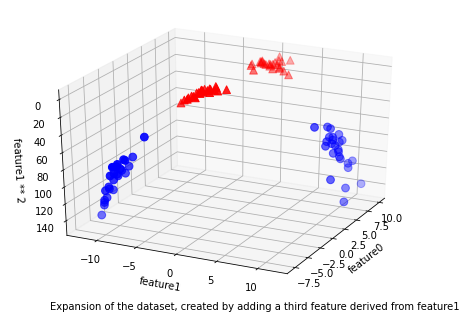

In [ ]:
from mpl_toolkits.mplot3d import Axes3D, axes3d

figure = plt.figure()

# visualize in 3D
ax = Axes3D(figure, elev=-152, azim=-26)

# plot first all the points with y == 0, then all with y == 1
mask = y == 0

ax.scatter(X_new[mask, 0], X_new[mask, 1], X_new[mask, 2], c='b',
           cmap=mglearn.cm2, s=60)

ax.scatter(X_new[~mask, 0], X_new[~mask, 1], X_new[~mask, 2], c='r', marker='^',
           cmap=mglearn.cm2, s=60)

ax.set_xlabel("feature0")
ax.set_ylabel("feature1")
ax.set_zlabel("feature1 ** 2")

plt.figtext(0.1, -0.05, "Expansion of the dataset, created by adding\
 a third feature derived from feature1")


plt.show()

In  the new representation of the data, it is now indeed possible to separate the two classes using a linear model, a plane in three dimensions. We can confirm this by fitting a linear model to the augmented data.

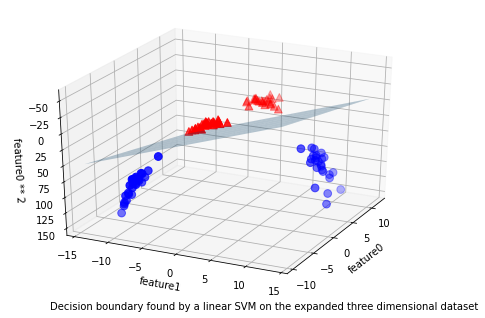

In [ ]:
linear_svm_3d = LinearSVC(max_iter=100000).fit(X_new, y)
coef, intercept = linear_svm_3d.coef_.ravel(), linear_svm_3d.intercept_

# show linear decision boundary
figure = plt.figure()

ax = Axes3D(figure, elev=-152, azim=-26)
xx = np.linspace(X_new[:, 0].min() - 2, X_new[:, 0].max() + 2, 50)
yy = np.linspace(X_new[:, 1].min() - 2, X_new[:, 1].max() + 2, 50)

XX, YY = np.meshgrid(xx, yy)
ZZ = (coef[0] * XX + coef[1] * YY + intercept) / -coef[2]

ax.plot_surface(XX, YY, ZZ, rstride=8, cstride=8, alpha=0.3)
ax.scatter(X_new[mask, 0], X_new[mask, 1], X_new[mask, 2], c='b',
           cmap=mglearn.cm2, s=60)
ax.scatter(X_new[~mask, 0], X_new[~mask, 1], X_new[~mask, 2], c='r', marker='^',
           cmap=mglearn.cm2, s=60)

ax.set_xlabel("feature0") 
ax.set_ylabel("feature1")
ax.set_zlabel("feature0 ** 2")

plt.figtext(0.1, -0.05, "Decision boundary found by a linear SVM on\
 the expanded three dimensional dataset")

plt.show()

As a functjion of the original featues, the linear SVM model is not actually linear anymore. It is not a line, but more of an ellipse, ad you can see from the plot created here

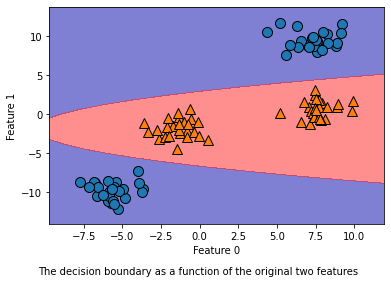

In [ ]:
ZZ = YY ** 2 
dec = linear_svm_3d.decision_function(np.c_[XX.ravel(), YY.ravel(), ZZ.ravel()])

plt.contourf(XX, YY, dec.reshape(XX.shape), levels=[dec.min(), 0, dec.max()],
             cmap=mglearn.cm2, alpha=0.5)

mglearn.discrete_scatter(X[:, 0], X[:, 1], y)
plt.xlabel("Feature 0")
plt.ylabel("Feature 1")

plt.figtext(0.1, -0.05, "The decision boundary as a function of the original two features")

plt.show()

**The kernel trick**

The lesson here is that adding nonlinear features to the representation of our data can make linear models much more powerful. However, often we don't know which features to add, and adding many features (like all possible interactions in a 100 dimensional feature space) might make computation very expensive. Luckily, there is a clever mathematical trick that allows us to learn a classifier in a higher-dimensional space without actually computing the new, possibly very large representation. This is known as the **kernel trick**, and it works by directly computing the distance (more precisely, the scalar products) of the data points for the expanded feature representtion, without ever actually computing the expansion.

There are two ways to map your data into a higher-dimensional space that are commonly used with support vector machines: the polynomial kernal, which computes all possible polynomials up to a certain degree of the original features (like feature1 ** 2 * feature2 ** 5); and the radial basis function (RBF) kernal, also known as the Gaussian kernal. The Gaussian kernal is a bit harder to explanin, as it corresponds to an infinite-dimensional feature space. One way to explain the Gaussian kernal is that it considers all possible polynomials of all degrees, but the importance of the features decreases for higher degrees.

In practice, the mathematical details behind the kernal SVM are not that important though, and how an SVM with an RBF kernal makes a decision can be summerized quite easily -we'll do so in the next section.

**Understanding SVMs**

During training, the SVM learns how important each of the training data points is to represent the decision boundary between the two classes. Typically only a subset of the training points matter for defining the decision boundary: the ones that lie on the border between the classes. These are called support vectors and give the support vector machine its name.

To make a prediction for a new point, the distance to each of the support vectors is measured. A classification decision is made based on the distances to the support vector, and  the importance of the support vectors that was learned during training (stored in the `dual_coef_` attribute of SVC).

The distance between data points is measured by the Gaussian kernal:


$$k_{rbf}\left(x_1,x_2\right)\:=\:exp\left(ɣ\left||x_{1\:}-x_2\right||^2\right)$$


Here, x<sub>1</sub> and x<sub>2</sub> are data points, ||x<sub>1</sub> - x<sub>2</sub>|| denotes Euclidean distance, and ɣ (gamma) is a parameter that controls the width of the Gaussian kernal.

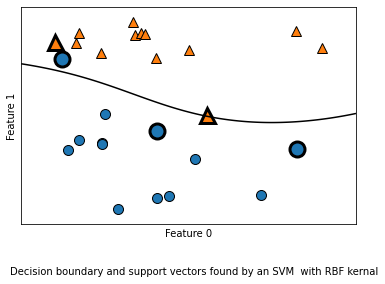

In [ ]:
from sklearn.svm import SVC 

X, y = mglearn.tools.make_handcrafted_dataset()

svm = SVC(kernel='rbf', C=10, gamma=0.1).fit(X, y) 

mglearn.plots.plot_2d_separator(svm, X, eps=.5)
mglearn.discrete_scatter(X[:, 0], X[:, 1], y)

# plot support vectors
sv = svm.support_vectors_

# class labels of support vectors are given by the sign of the dual coefficients
sv_labels = svm.dual_coef_.ravel() > 0
mglearn.discrete_scatter(sv[:, 0], sv[:, 1], sv_labels, s=15, markeredgewidth=3)

plt.xlabel("Feature 0")
plt.ylabel("Feature 1")
plt.figtext(0.1, -0.05, "Decision boundary and support vectors found by an SVM\
  with RBF kernal")

plt.show()

The result of training a support vector machine on a two-dimensional two-class dataset. The decision boundary is shown in black, and the support vectors are larger points with die outline. The following code creates this plot by training as SVM on the forge dataset:

In this case, the SVM yields a very smooth and nonlinear (not a straight line) boundary. We adjusted two parameters here: the C parameter and the `gamma` parameter, which we will now discuss in detail.

**Tuning SVM parameters**

The `gamma` parameter is the one shown in the formula given in the previous section, which controls the width of  the Gaussian kernal. It determines the scale of what it means for points to be close together. The C parameter is a regularization parameter, similar to that used in the linear models. It limits the importance of each point (or more precisely, their `dual_coef_`).



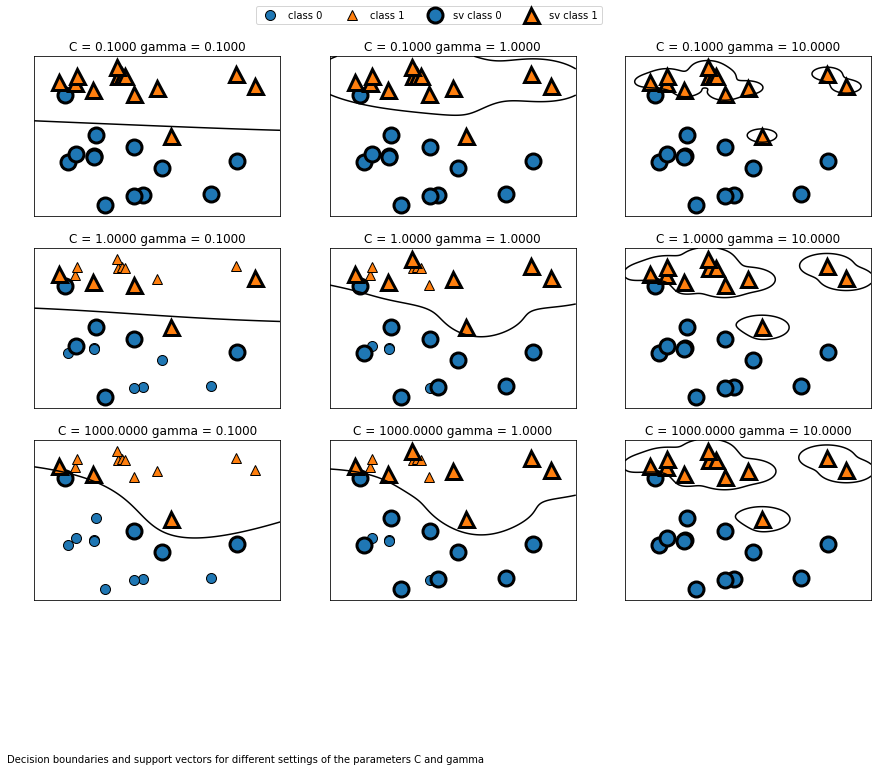

In [ ]:
fig, axes = plt.subplots(3, 3, figsize=(15, 10))

for ax, C in zip(axes, [-1, 0, 3]):
  for a, gamma in zip(ax, range(-1, 2)):
    mglearn.plots.plot_svm(log_C=C, log_gamma=gamma, ax=a)

axes[0, 0].legend(["class 0", "class 1", "sv class 0", "sv class 1"],
                  ncol=4, loc=(.9, 1.2))

plt.figtext(0.1, -0.1, "Decision boundaries and support vectors for\
 different settings of the parameters C and gamma")
plt.show()

Going from left to right, we increase the value of the parameter `gamma` from 0.1 to 10. A **small `gamma`** means a **large radius** for the Gaussian kernal, which means that many points are considered close by. This is reflected in very smooth decision boundaries on the left, and boundaries that focus more on single points further to the right. A low value of `gamma` means that the decision boundary will vary slowly, which yields a model of low complexity, while a high value of `gamma` yields a more complex model.

Going from top to bottom, we increase the `C` parameter from 0.1 to 1000. As with the linear models, a small `C` means a very restricted model, where each dat point can only have very limited influence. You can see that at the top left the decision boundary looks nearly linear, with the misclassified points barely having nay influence on the line. Increasing C, as shown on the bottom right, allows these points to have a stronger influence on the model and makes the decision boundary bend to correctly classify them.

Let's apply the RBF kernal SVM to the Breast Cancer dataset. By default, `C=1` and `gamma=1/n_features`:

In [ ]:
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import train_test_split

cancer = load_breast_cancer()

X_train, X_test, y_train, y_test = train_test_split(cancer.data,
                                                    cancer.target,
                                                    random_state=0)

svc = SVC()
svc.fit(X_train, y_train)

print("Accuracy on training set: {:.2f}".format(svc.score(X_train, y_train)))
print("Accuracy on test set: {:.2}".format(svc.score(X_test, y_test)))

Accuracy on training set: 0.90
Accuracy on test set: 0.94


The model perform quite well, they are very sensitive to the setting of  the parameters and to the scaling of the data. In particular, they require all the features to vary on a similar scale.Let's look at the minimum and maximum values for each feature, plotted in log-space

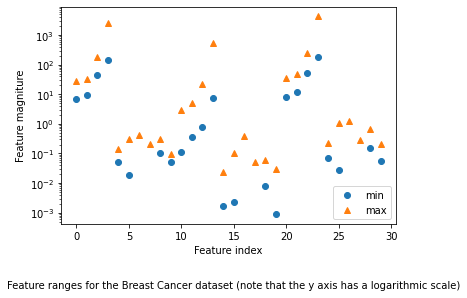

In [ ]:
plt.plot(X_train.min(axis=0), 'o', label="min")
plt.plot(X_train.max(axis=0), '^', label="max")

plt.legend(loc=4)

plt.xlabel("Feature index")
plt.ylabel("Feature magniture")
plt.yscale("log")
plt.figtext(0, -0.1, "Feature ranges for the Breast Cancer dataset\
 (note that the y axis has a logarithmic scale)")

plt.show()

From this plot we can determine the features in the Breast Cancer dataset are of completely different orders of magnitude. This can be somewhat of a problem for other models (like linear models), but it has devastating effects for the kernel SVM. Let's examine some ways to deal with this issue.

**Preprocessing data for SVMs**

One way to resolve this problem is by rescaling each feature so that they are all approximately on the same scale. A common rescaling method for kernal SVMs is to scale the dat such that all features are between 0 and 1. We will see how to do this using the `MinMaxScaler` preprocessing method, where we'll give more details. For now, let's do this "by hand":

In [ ]:
# compute the minimum value per feature on the training set
min_on_training = X_train.min(axis=0)

# compute the range of each feature (max - min) on the training set
range_on_training = (X_train - min_on_training).max(axis=0)

# subtract the min, and divide by range
# afterward, min=0 and max=1 for each feature
X_train_scaled = (X_train - min_on_training) / range_on_training

print("Minimum for each feature\n{}".format(X_train_scaled.min(axis=0)))
print("Maximum for each feature\n{}".format(X_train_scaled.max(axis=0)))

Minimum for each feature
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0.]
Maximum for each feature
[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1.]


In [ ]:
# use THE SAME transformation on the test set,
# using min and range of the training set (see Chapter 3 for details)
X_test_scaled = (X_test - min_on_training) / range_on_training

In [ ]:
svc = SVC() 
svc.fit(X_train_scaled, y_train)

print("Accuracy on training set: {:.3f}".format(svc.score(X_train_scaled, y_train))) 
print("Accuracy on test set: {:.3f}".format(svc.score(X_test_scaled, y_test)))

Accuracy on training set: 0.984
Accuracy on test set: 0.972


Scaling the data made a huge difference! Now we are actually in an underfitting regime, where training and test set performance are quite similar but less close to 100% accuracy. From here, we can try increasing either `C` or `gamma` to fit a more complex model. For example:

In [ ]:
svc = SVC(C=1000)
svc.fit(X_train_scaled, y_train)

print("Accuracy on training set: {:.3f}".format(svc.score(X_train_scaled, y_train)))
print("Accuracy on test set: {:.3f}".format(svc.score(X_test_scaled, y_test)))

Accuracy on training set: 1.000
Accuracy on test set: 0.958


**Strengths, weaknesses, and parameters**

Kernalized support vector machines are powerful models and perform well on a variety of datasets. SVMs allow for complex decision boundaries, even if data has only a few features. They work well on low-dimensional and high-dimensional data (i.e., few and many features), but don't scale very well with the number of samples. Running an SVM on data with up to 10,000 samples might work well, but working with datasets of size 100,000 or more can become challenging in terms of runtime and memory usage.

Another downside of SVMs is that they require careful preprocessing of the data and tuning of the parameters. This is why, these days, most people instead use tree-based models such as random forests or gradient boosting (which require little or no pre-processing) in many applications. Furthermore, SVM models are hard to inspect; it can be difficult to understand why a particular prediction was made, and it might be tricky to explain the model to a nonexpert.

Still, it might be worth trying SVMs, particularly if all of your features represent measurements in similar units (e.g., all are pixel intensities) and they are on similar scales.

The important parameters in kernal SVMs are the regularization parameter `C` the choice of the kernal, and the kernal-specific parameters. Although we primarily focused on the RBF kernel, other choices are availabel in `scikit-learn`. The RBF kernal has only one parameter, `gamma`, which is the inverse of the width of the Gaussian kernal. `gamma` and `C` both control the complexity of the model, with large values in either resulting in a more complex model. Therefore, good settings for the two parameters are usually strongly correlated, and `C` and `gamma` should be adjusted together.

### **Neural Networks (Deep Learning)**

A family of algorithms known as **neural networks** has recently seen **a revival under the name** **"deep learning."** While deep learning shows great promise in many machine learning applications, deep learning algorithms are often tailored very carefully to a specific use case. Here, we will only discuss some relatively simple methods, namely **multilayer perceptrons** for classification and regression, that can serve as a starting point for more involved deep learning methods. Multilayer perceptrons (MLPs) are also known as (vanilla) feed-forward neural networks, or somethimes just neural networks.

**The neural network model**

MLPs can be viewed as **generalizations of linear models** that **perform multiple stages** of processing to come to a decision.

Remember that the prediction by a linear regressor is given as:


$$ŷ\:=\:w\left[0\right]\:\cdot \:x\left[0\right]\:+\:w\left[1\right]\:\cdot \:x\left[1\right]\:+\:...\:+\:w\left[p\right]\:\cdot \:x\left[p\right]\:+\:b$$

In plain Engnlish, ŷ is a weighted sum of the input features x[0] to x[p], weighted by the learned coefficients w[0] to w[p]. We could visualize this graphically.

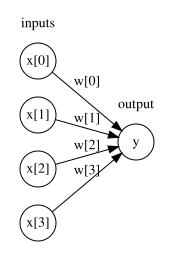

Visualizaition of logistic regression, where input features
and predictios are shown as nodes, and the coefficients are
connections between the nodes


In [ ]:
display(mglearn.plots.plot_logistic_regression_graph())

print("Visualizaition of logistic regression, where input features\n\
and predictios are shown as nodes, and the coefficients are\n\
connections between the nodes")

Here, each node on the left represents an input feature, the connecting lines represent the learned coefficients, and the node on the right represents the output, which is a weighted sum of the inputs.

In an MLP this process of comuting weighted sums in repeated multiple times, first computing hidden units that represent an intermediate processing step, which are again combined using weighted sums to  yield the final result

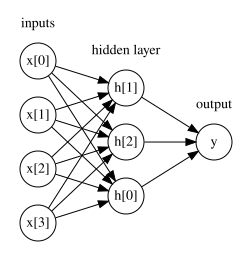

Illustration of a multilayer perceptron with a single hidden layer


In [ ]:
display(mglearn.plots.plot_single_hidden_layer_graph())

print("Illustration of a multilayer perceptron with a single hidden layer")

This model has a lot more coefficients (also called weights) to learn: there is one between every input and every hidden unit (which make up the hidden layer), and one between every unit in the hidden layer and the output.

Computing as series of weighted sums in mathematically the same as computing just one weighted sum, so to make this model truly more powerful than a linear model, we need one extra trick. After computing a weighted sum for each hidden unit, a nonlinear function is applied to the result -usually the rectifying nonlinearity (also known as rectified linear unit of relu) or the tangens hyperbolicus (tanh). The result of this function is then used in the weighted sum that computes the output, ŷ. The two functions are visualized in Figure below. the relu cuts off values below zero, while tanh saturates to -1 for low input values and +1 for high input values. Either nonlinear function allows the neral network to learn much more complicated functions than a linear model could:

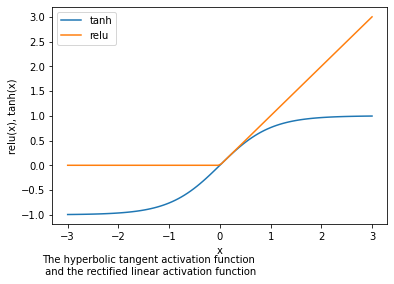

In [ ]:
line = np.linspace(-3, 3, 100)

plt.plot(line, np.tanh(line), label="tanh")
plt.plot(line, np.maximum(line, 0), label="relu")

plt.legend(loc="best")
plt.xlabel("x")
plt.ylabel("relu(x), tanh(x)")
plt.figtext(0.1, -0.05, "The hyperbolic tangent activation function\n\
 and the rectified linear activation function")

plt.show()

For the small neural network, the full formula for computing ŷ in the case of regression would be (when using a tanh nonlinearity):

    h[0] = tanh(w[0,0] * x[0] + w[1,0] * x[1] + w[2,0] * x[2] + w[3,0] * x[3])
    h[1] = tanh(w[0,0] * x[0] + w[1,0] * x[1] + w[2,0] * x[2] + w[3,0] * x[3])
    h[2] = tanh(w[0,0] * x[0] + w[1,0] * x[1] + w[2,0] * x[2] + w[3,0] * x[3])

Here, w ar the weight between the input x and the hidden layer h, and v are the weights between the hidden layer h and the output ŷ. The weights v and w are learned from data, x are the input features, ŷ is the computed output, and h are intermediate computations. An important parameter that needs to be set by the user is the number of nodes in the hidden layer. This can be as small as 10 for very small or simple data-sets and as big as 10,000 for very complex data. It is also possible to add additional hidden layers.

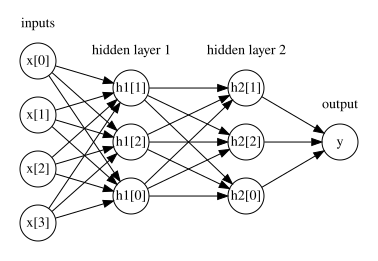

A multilayer perceptron with two hidden layers


In [ ]:
display(mglearn.plots.plot_two_hidden_layer_graph())

print("A multilayer perceptron with two hidden layers")

Having large neural networks made up for many of these layers of computation is what inspired the term "deep learning."

**Tuning neural networks**

Let's look into the workings of MLP by applying the `MLPClassifier` to the `two_moons` dataset we used earlir in this chapter. 

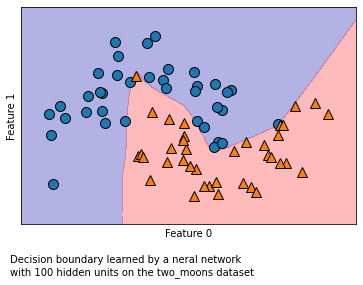

In [ ]:
from sklearn.neural_network import MLPClassifier 
from sklearn.datasets import make_moons  
from sklearn.model_selection import train_test_split

X, y = make_moons(n_samples=100, noise=0.25, random_state=3)

X_train, X_test, y_train, y_test = train_test_split(X, 
                                                    y,
                                                    stratify=y,
                                                    random_state=42)

mlp = MLPClassifier(solver='lbfgs', random_state=0, 
                    max_iter=1000).fit(X_train, y_train)

mglearn.plots.plot_2d_separator(mlp, X_train, fill=True, alpha=.3)
mglearn.discrete_scatter(X_train[:, 0], X_train[:, 1], y_train)

plt.xlabel("Feature 0")
plt.ylabel("Feature 1")
plt.figtext(0.1, -0.05, "Decision boundary learned by a neral network\n\
with 100 hidden units on the two_moons dataset")

plt.show()

As you can see, the neural network learned a very nonlinear but relatively smooth decision boundary. We used `slover=lbfgs`, which we will discuss later.

By default, the MLP use 100 hidden nodes, which is quite a lot for this small dataset. We can reduce the number (which reduces the complexity of the model) and still get a good result

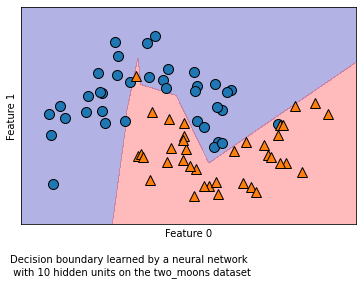

In [ ]:
mlp = MLPClassifier(solver='lbfgs', random_state=0, 
                    hidden_layer_sizes=[10], max_iter=1000)

mlp.fit(X_train, y_train)

mglearn.plots.plot_2d_separator(mlp, X_train, fill=True, alpha=.3)
mglearn.discrete_scatter(X_train[:, 0], X_train[:, 1], y_train)

plt.xlabel("Feature 0")
plt.ylabel("Feature 1")
plt.figtext(0.1, -0.05, "Decision boundary learned by a neural network\n\
 with 10 hidden units on the two_moons dataset")

plt.show()

With only 10 hidden units, the decision boundary looks somewhat more ragged. The default nonlinearity is relu. With a single hidden layer, this means the decision function will made up of 10 straight line segments. If we want a smoother decision boundary, we could add more hidden units, add a second hidden layer, or use the tanh nonlinearity

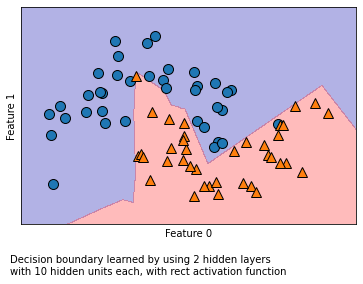

In [ ]:
# using two hidden layers, with 10 units each
mlp = MLPClassifier(solver='lbfgs', random_state=0, 
                    hidden_layer_sizes=[10, 10], max_iter=1000)

mlp.fit(X_train, y_train)
mglearn.plots.plot_2d_separator(mlp, X_train, fill=True, alpha=.3)
mglearn.discrete_scatter(X_train[:, 0], X_train[:, 1], y_train)

plt.xlabel("Feature 0") 
plt.ylabel("Feature 1")
plt.figtext(0.1, -0.05, "Decision boundary learned by using 2 hidden layers\n\
with 10 hidden units each, with rect activation function")

plt.show()

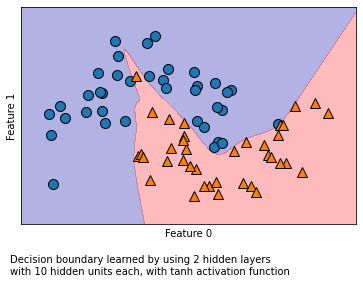

In [ ]:
# using two hidden layers, with 10 units each, now with tanh nonlinearity
mlp = MLPClassifier(solver='lbfgs', activation='tanh', max_iter=1000,
                    random_state=0, hidden_layer_sizes=[10, 10])

mlp.fit(X_train, y_train)
mglearn.plots.plot_2d_separator(mlp, X_train, fill=True, alpha=.3)
mglearn.discrete_scatter(X_train[:, 0], X_train[:, 1], y_train)

plt.xlabel("Feature 0")
plt.ylabel("Feature 1")
plt.figtext(0.1, -0.05, "Decision boundary learned by using 2 hidden layers\n\
with 10 hidden units each, with tanh activation function")

plt.show()

Finally, we can also control the complexity of a neural network by using an `l2` penalty to shrink the weights toward zero, as we did in ridge regression and the linear classifiers. The parameter for this in the `MLPClassifier` is `alpha` (as in the linear regression models), and it's set to a very low value (little regularization) by default. The figure below shows the effect of different values of `alpha` on the `two_moons` dataset, using two hidden layers of 10 or 100 units each:

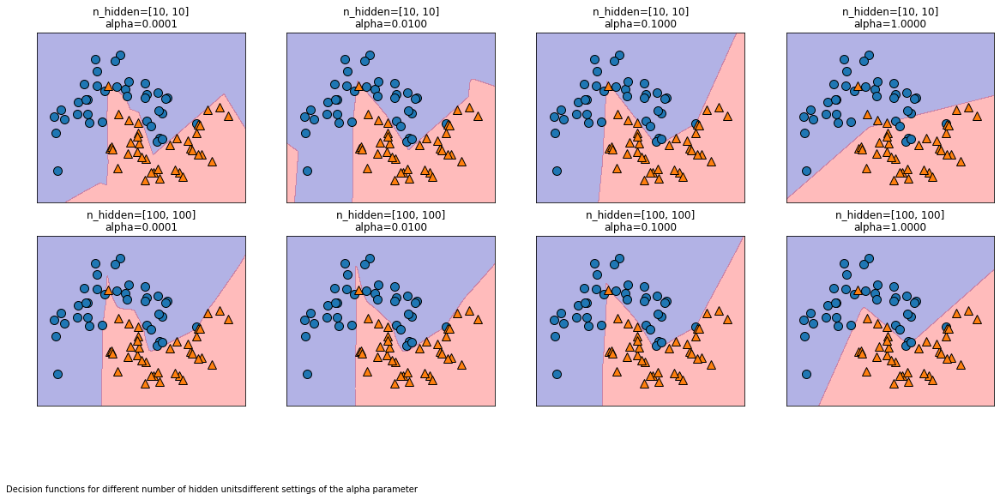

In [ ]:
fig, axes = plt.subplots(2, 4, figsize=(20, 8))
for axx, n_hidden_nodes in zip(axes, [10, 100]):
  for ax, alpha in zip(axx, [0.0001, 0.01, 0.1, 1]):
    mlp = MLPClassifier(solver='lbfgs', random_state=0,
                        hidden_layer_sizes=[n_hidden_nodes, n_hidden_nodes],
                        alpha=alpha, max_iter=1000)
    
    mlp.fit(X_train, y_train)
    mglearn.plots.plot_2d_separator(mlp, X_train, fill=True, alpha=.3, ax=ax)
    mglearn.discrete_scatter(X_train[:, 0], X_train[:, 1], y_train, ax=ax)
    ax.set_title("n_hidden=[{}, {}]\nalpha={:.4f}".format(
        n_hidden_nodes, n_hidden_nodes, alpha))
    
plt.figtext(0.1, -0.05, "Decision functions for different number of hidden units\
different settings of the alpha parameter")

plt.show()

As you probably have realized by now, there are many ways to control the complexity of a neural network: the number of hidden layers, the number of units in each hidden layer, and the regularization (`alpha`). There are actually even more, which we won't go into here.

An important property of neural networks is that their weights are set randomly before learning is started, and this random initialization affects the model that is learned. That means that even when using exactly the same parameters, we can obtain very different models when using different random seeds. If the networks are large, and their complexity is chosen properly, this should not affect accuracy too much, but it is worth keeping in mide (particularly for smaller networks). The figure below shows plots of several models, all learned with the same settings of the parameters:

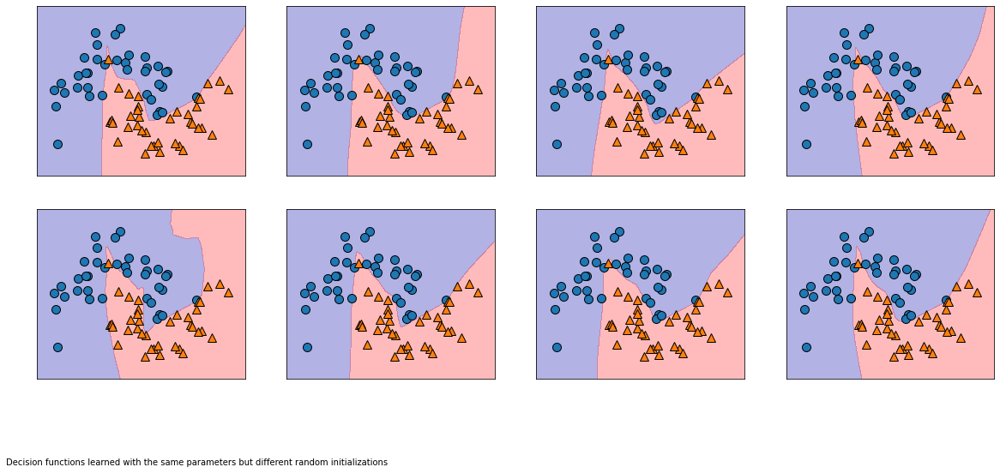

In [ ]:
fig, axes = plt.subplots(2, 4, figsize=(20, 8))
for i, ax in enumerate(axes.ravel()):
  mlp = MLPClassifier(solver='lbfgs', random_state=i,
                      hidden_layer_sizes=[100, 100], max_iter=1000)
  
  mlp.fit(X_train, y_train)
  mglearn.plots.plot_2d_separator(mlp, X_train, fill=True, alpha=.3, ax=ax)
  mglearn.discrete_scatter(X_train[:, 0], X_train[:, 1], y_train, ax=ax)

plt.figtext(0.1, -0.05, "Decision functions learned with the same parameters\
 but different random initializations ")

plt.show()

To get a better understanding of neural networks on real-world data, let's apply the `MLPClassifier` to Breast Cancer dataset. We start with the default parameters:

In [ ]:
from sklearn.datasets import load_breast_cancer

cancer = load_breast_cancer()

print("Cancer data per-feature maxima:\n{}".format(cancer.data.max(axis=0)))

Cancer data per-feature maxima:
[2.811e+01 3.928e+01 1.885e+02 2.501e+03 1.634e-01 3.454e-01 4.268e-01
 2.012e-01 3.040e-01 9.744e-02 2.873e+00 4.885e+00 2.198e+01 5.422e+02
 3.113e-02 1.354e-01 3.960e-01 5.279e-02 7.895e-02 2.984e-02 3.604e+01
 4.954e+01 2.512e+02 4.254e+03 2.226e-01 1.058e+00 1.252e+00 2.910e-01
 6.638e-01 2.075e-01]


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(cancer.data,
                                                    cancer.target,
                                                    random_state=0)

mlp = MLPClassifier(random_state=42, max_iter=1000)
mlp.fit(X_train, y_train)

print("Accuracy on training set: {:.2f}".format(mlp.score(X_train, y_train)))
print("Accuracy on test set: {:.2f}".format(mlp.score(X_test, y_test)))

Accuracy on training set: 0.94
Accuracy on test set: 0.92


The accuracy of the MLP is quite good, but not as good as the other models. As i nthe earlier SVC example, this is likely due to scaling of the data. Neural networks also expect all input features to vary in a similar way, and ideally to have a mean of 0, and a variance of 1. We must rescale our data so that it fulfills these requirements. Again, we will do this by hand here, but we'll introduce the `StandardScaler` to do this automatically in Chapter 3:

In [ ]:
# compute the mean value per feature on the training set
mean_on_train = X_train.mean(axis=0)
# compute the standard deviation of each feature on the training set
std_on_train = X_train.std(axis=0)

# subtract the mean, and scale by inverse standard deviation 
# afterward, mean=0 and std=1
X_train_scaled = (X_train - mean_on_train) / std_on_train
# use THE SAME transformation (using training mean and std) on the test set 
X_test_scaled = (X_test - mean_on_train) / std_on_train

mlp = MLPClassifier(random_state=0, max_iter=400)
mlp.fit(X_train_scaled, y_train)

print("Accuracy on training set: {:.3f}".format(
    mlp.score(X_train_scaled, y_train)))
print("Accuracy on test set: {:.3f}".format(mlp.score(X_test_scaled, y_test)))

Accuracy on training set: 1.000
Accuracy on test set: 0.972


The results are much better after scaling, and already quite competitive. 

In [ ]:
mlp = MLPClassifier(max_iter=1000, random_state=0)
mlp.fit(X_train_scaled, y_train)

print("Accuracy on training set: {:.3f}".format(
    mlp.score(X_train_scaled, y_train)))
print("Accuracy on test set: {:.3f}".format(mlp.score(X_test_scaled, y_test)))

Accuracy on training set: 1.000
Accuracy on test set: 0.972


Increasing the number of iterations only increased the training set performance, not the generalization performance. Still, the model is performing quite well. As there is some gap between the training adn the test performance, we might try to decrease the model's complexity to get better generalization performance. Here, we choose to increase the `alpha` parameter (quite aggressively, from 0.0001 to 1) to add stronger regularization of the weights:

In [ ]:
mlp = MLPClassifier(max_iter=1000, alpha=1, random_state=0) 
mlp.fit(X_train_scaled, y_train)

print("Accuracy on training set: {:.3f}".format(
    mlp.score(X_train_scaled, y_train)))
print("Accuracy on test set: {:.3f}".format(mlp.score(X_test_scaled, y_test)))

Accuracy on training set: 0.988
Accuracy on test set: 0.972


This leads to a performance on par wiht the best models so far.

while it is possible to analyze what a neural network has learned, this is usually much tricker than analyzing a linear model or a tree-based model. One way to introspect what was learned is o look at the weights in the model. You can see an example of this in the **scikit-learn example gallery**. For the Breast Cancer dataset, this might be a bit hard to understand. The following plot shows the weights that were learned connecting the input to the first hidden layer. The rows in this plot correspond to hte 30 input features, while the column correspond to the 100 hidden units. Light colors represent large positive values, while dark colors represent negative values:

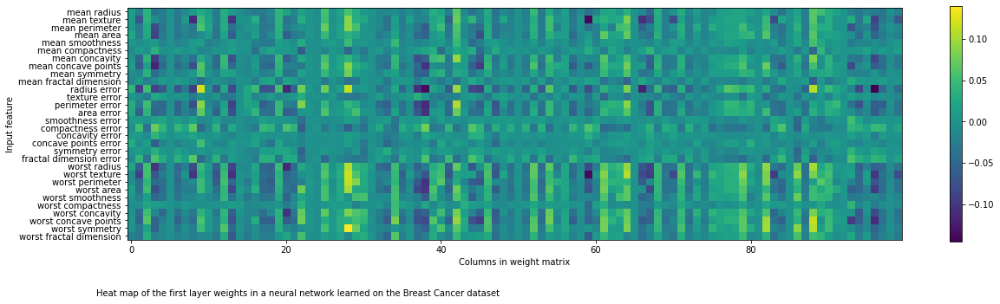

In [ ]:
plt.figure(figsize=(20, 5))

plt.imshow(mlp.coefs_[0], interpolation='none', cmap='viridis')
plt.yticks(range(30), cancer.feature_names)

plt.xlabel("Columns in weight matrix")
plt.ylabel("Input feature")
plt.figtext(0.1, -0.05, "Heat map of the first layer weights in\
 a neural network learned on the Breast Cancer dataset")

plt.colorbar()
plt.show()

One possible inference we can make is that features that have very small weights for all of the hidden units are "less important" to the model. We can see that "mean smoothness" and "mean compactness," in addition to the features found between "smoothness error" and "fractal dimension error," have relatively low weights compared to other features. This could mean that these are less important features or possibly that we didn't represent them in a way that the neural network could use.

We could also visualize the weights connecting the hidden layer to the output layer, but those are even harder to interpret.

While the `MLPClassifier` and `MLPRegressor` provide easy-to-use interfaces for the most common neural network architectures, they only capture a small subset of what is possible with neural networks. If you are interested in working with more flexible or larger models, we encourage you to look beyond `scikit-learn` into the fantastic deep learning libraries that are out there. For Python users, the most well-established are `keras`,  `lasagna`, and `tensor-flow`. `lasagna` builds on the `theano` library, while `keras` can use either `tensor-flow` or `theano`. These libraries provide a much more flexible interface to build neural networks and track the rapid progress in deep learning research. All of  the popular deep learning libraries also allow the use of high performance graphics processing units (GPUs), which `scikit-learn` does not support. Using GPUs allows us to accelerate computations by factors of 10x to 100x, and they are essential for applying deep learning methods to large-scale datasets.

**Strengths, weaknesses, and parameters**

Neural networks have reemerged as state-of-the-art models in many applications of machine learning. One of their main advantages is that they are able to capture information contained in large amounts of data and build incredibly complex models. Given enough computation time, data, and careful tuning of the parameters, neural networks often beat other machine learning algorithms (for classification and regression tasks).

This brings us to the downsides. Neural networks -particularly the large and powerful ones -often take a long time to train. They also require careful preprocessing of the data, as we saw here. Similarly to SVMs, they work best with "homogeneous" data, where all the features have similar meanings. For data that has very different kinds of features, tree-based models might work better. Tuning neural network parameters is also an art unto itself. In our experiments, we barely scratched the surface of possible ways to adjust neural network models and how to train them.

**Estimating complexity in neural networks**

The most important parameters are the number of layers and the number of hidden units per layer. You should start with one or two hidden layers, and possibly expand from there. The number of nodes per hidden layer is often similar to the number of input features, but rarely higher than in the low to mid-thousands.

A helpful measure when thinking about the model complexity of a neural network is the number of weights or coefficients that are learned. If you have a binary classification dataset with 100 features, and you have 100 hidden units, then there are 100 \* 100 = 10,000 weights between the input and the first hidden layer. There are also 100 \* 1 = 100 weights between the hidden layer and the output layer, for a total of around 10,100 weights. If you add a second hidden layer with 100 hidden units, there will be another 100 \* 100 = 10,000 weights from the first hidden layer to the second hidden layer, resulting in a total of 20,100 weights. If instead you use one layer with 1,000 hidden units, you are learning 100 \* 1,000 = 100,000 weights from the input to the hidden layer and 1,000 x 1 weights from the hidden layer to the output layer, for a total 101,000. If you add a second hidden layer you add 1,000 \* 1,000 = 1,000,000 weights, for a whopping total of 1,101,000  --50 times larger than the model with two hidden layers of size 100.

A common way to adjust parameters in a neural network is to first create a network this is large enough to overfit, making sure that the task can actually be learned by the network. Then, once you know the training data can be learned, either shrink the network or increase `alpha` to add regularization, which will improve generalization performance. 

In our experiments, we focused mostly on the definition of the model: the number of layers and nodes per layer, the regularization, and the nonlinearity. These define the model we want to learn. There is also the question of how to learn the model, or the algorithm that is used for learning the parameters, which is set using the `algorithm` parameter, There are two easy-to-use choices for `algorithm`. The default is `'adam'`, which works well in most situations but is quite sensitive to the scaling of the data (so it is important to always scale your data to 0 mean and unit variance). The other one is `lbfgs`, which is quite robust but might take a long time on larger models or larger datasets. There is also the more advanced `'sgd'` option, which is what many deep learning reserchers use. The `'sgd'` option comes with many additional parameters that need to be tuned for best results. You can find all of these parameters and their definitions in the user guide. When starting to work with MLPs, we recommend sticking to `'adam'` and `lbfgs`.

## **Uncertainty Estimates from Classifiers**

Another useful part of the `sciket-learn` interface that we haven't talked about yet is the ability of classifiers to provide uncertainty estimates of predictions. Often, you are not only interested in which class a classifier predicts for a certain test point, but also how certain it is that this is the right class. In practice, different kinds of mistakes lead to very different outcomes in real-world applications. Imagine a medical application testing for cancer. Making a false positive prediction might lead to a patient undergoing additional tests, whil a false negative prediction might lead to a serious disease not being treated. We will go into this topic in more detail in Chapter 6.

There are two different fuctions in `scikit-learn` that can be used to obtain uncertainty estimates from classifiers: `decision_function` and `predict_proba`. Most (but not all) classifiers have at least one of them, and many classifiers have both. Let's look at what these two functios do on a synthetic two-dimensional dataset, when building a `GradientBoostingClassifier` classifier, which has both a `decision_function` and a `predict_proba` method:

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.datasets import make_blobs, make_circles 
from sklearn.model_selection import train_test_split

X, y = make_circles(noise=0.2, factor=0.5, random_state=1)

# we rename the classes "blue" and "red" for illustration purposes
y_named = np.array(["blue", "red"])[y]

# we can call train_test_split with arbitrarily many arrays;
# all will be split in a consistent manner
X_train, X_test, y_train_named, y_test_named, y_train, y_test = \
        train_test_split(X, y_named, y, random_state=0)

# build the gradient boosting model
gbrt = GradientBoostingClassifier(random_state=0)
gbrt.fit(X_train, y_train_named)

GradientBoostingClassifier(random_state=0)

**The Decision Function**

In the binary classification case, the return value of `decision_function` is of shape `(n_samples,)`, and it returns one floating-point number for each sample:

In [ ]:
print("X_test.shape: {}".format(X_test.shape))
print("Decision function shape: {}".format(gbrt.decision_function(X_test).shape))

X_test.shape: (25, 2)
Decision function shape: (25,)


This value encodes how strongly the model believes a data point to belong to the "positive" class, in this case class 1. Positive values indicate a preference for the positive class, and negative values indicate a preference for the "negative" (other) class:


In [ ]:
# show the first few entries of decision_function 
print("Decision function:\n{}".format(gbrt.decision_function(X_test)[:6]))

Decision function:
[ 3.86233255  1.8624287  -4.42728479 -3.89794922  4.71924839  4.33562417]


We can recover the prediction by looking only at the sign of the decision function:

In [ ]:
print("Thresholded decision function:\n{}".format(gbrt.decision_function(X_test)>0))
print("Predictions:\n{}".format(gbrt.predict(X_test)))

Thresholded decision function:
[ True  True False False  True  True False  True  True  True False  True
  True False  True False  True False  True  True  True False False False
 False]
Predictions:
['red' 'red' 'blue' 'blue' 'red' 'red' 'blue' 'red' 'red' 'red' 'blue'
 'red' 'red' 'blue' 'red' 'blue' 'red' 'blue' 'red' 'red' 'red' 'blue'
 'blue' 'blue' 'blue']


For binary classification, the "negative" class is always the first entry of he `classes_` attribute, and the "positive" class is the second entry of `classes_`. So if you want to fully recover the output of `predict`, you need to make use of the `classes_` attribute:

In [ ]:
# make the boolean True/False into 0 and 1
greater_zero = (gbrt.decision_function(X_test) > 0).astype(int)
# use 0 and 1 as indices into classes_
pred = gbrt.classes_[greater_zero]
# pred is the same as the output of gbrt.predict
print("pred is equal to predictions: {}".format(np.all(pred == gbrt.predict(X_test))))

pred is equal to predictions: True


The range of `decision_function` can be arbitrary, and depends on the data and the model parameters:

In [ ]:
decision_function = gbrt.decision_function(X_test)
print("Decision function minimum: {:.2f} maximum: {:.2f}".format(
    np.min(decision_function), np.max(decision_function)))

Decision function minimum: -7.63 maximum: 4.73


This arbitrary scaling makes the output of `decision_function` often hard to interpret.

In the following example we plot the `decision_function` for all points in the 2D plane using a color coding, next to a visualization of the decision boundary, as we saw earlier. We show training points as circles and test data as triangles

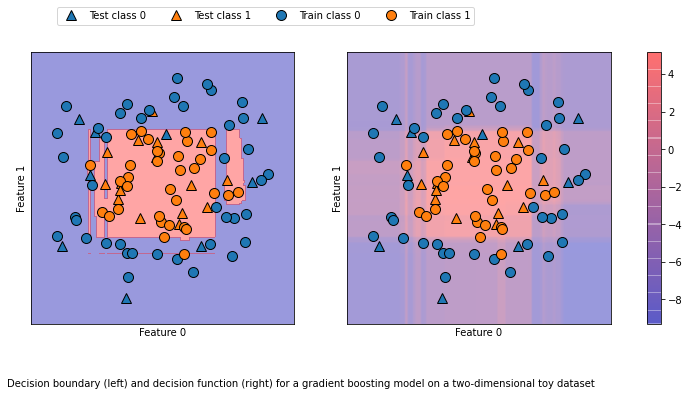

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(13, 5))
mglearn.tools.plot_2d_separator(gbrt, X, ax=axes[0], alpha=.4,
                                fill=True, cm=mglearn.cm2)

scores_image = mglearn.tools.plot_2d_scores(gbrt, X, ax=axes[1],
                                            alpha=.4, cm=mglearn.ReBl)

for ax in axes: 
  # plot training and test points
  mglearn.discrete_scatter(X_test[:, 0], X_test[:, 1], y_test,
                           markers='^', ax=ax)
  
  mglearn.discrete_scatter(X_train[:, 0], X_train[:, 1], y_train,
                           markers='o', ax=ax)
  
  ax.set_xlabel("Feature 0")
  ax.set_ylabel("Feature 1")

cbar = plt.colorbar(scores_image, ax=axes.tolist())
axes[0].legend(["Test class 0", "Test class 1", "Train class 0",
                "Train class 1"], ncol=4, loc=(.1, 1.1))

plt.figtext(0.1, -0.05, "Decision boundary (left) and decision function (right)\
 for a gradient boosting model on a two-dimensional toy dataset")

plt.show()

Encoding not only the predicted outcome but also how certain the classifier is provides additional information. However, in this visualization, it is hard to make out the boundary between the two classes.

**Predicting Probabilities**

The output of `predict_proba` is a probability for each class, and is often more easily understood than the output of `decision_function`. It is always of shape `(n_samples, 2)` for binary classification:

In [ ]:
print("Shape of probabilities: {}".format(gbrt.predict_proba(X_test).shape))

Shape of probabilities: (25, 2)


The first entry in each row is the estimated probability of the first class, and the second entry is the estimated probability of the second class. Because it is a probability, the output of `predict_proba` is always between 0 and 1, and the sum of the entries for both classes is always 1:

In [ ]:
# show the first few entries of predict_proba
print("Predicted probabilities:\n{}".format(gbrt.predict_proba(X_test[:6])))

Predicted probabilities:
[[0.02058621 0.97941379]
 [0.13442022 0.86557978]
 [0.98819416 0.01180584]
 [0.98011977 0.01988023]
 [0.00884299 0.99115701]
 [0.01292447 0.98707553]]


Because the probabilities for the two classes sum to 1, exactly one of the classes will be above 50% certainty. The class is the one that is predicted.

You can see in the previous output that the classifier is relatively certain for most points. How well the uncertainty actually reflects uncertainty in the data depends on the model and the parameters. A model that is more overfitted tends to make more certain predictions, even if they might be wrong. A model with less complexity usually has more uncertainty in its predictios. A model is called calibrated if the reported uncertainty actually matches how correct it is -in a calibrated model, a prediction made with 70% certainty would be correct 70% of the time.

In the following example we again show the decision boundary on the dataset, next to the class probabilities for the class 1:

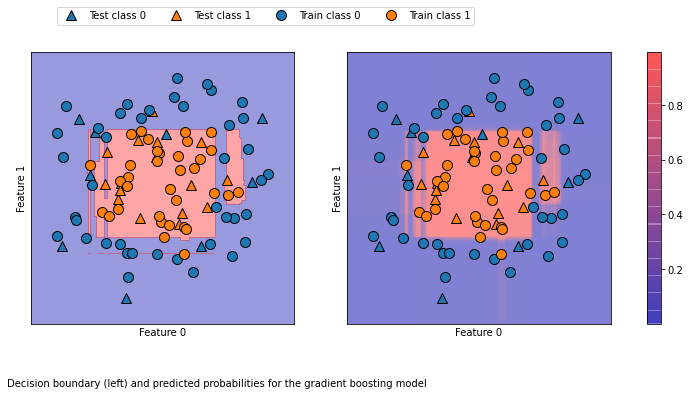

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(13, 5)) 

mglearn.tools.plot_2d_separator(gbrt, X, ax=axes[0], alpha=.4, 
                                fill=True, cm=mglearn.cm2)

scores_image = mglearn.tools.plot_2d_scores(gbrt, X, ax=axes[1],
                                            alpha=.5, cm=mglearn.ReBl,
                                            function='predict_proba')

for ax in axes:
  # plot training and test points
  mglearn.discrete_scatter(X_test[:, 0], X_test[:, 1], y_test,
                           markers='^', ax=ax)
  
  mglearn.discrete_scatter(X_train[:, 0], X_train[:, 1], y_train,
                           markers='o', ax=ax)
  
  ax.set_xlabel("Feature 0")
  ax.set_ylabel("Feature 1")
cbar = plt.colorbar(scores_image, ax=axes.tolist())
axes[0].legend(["Test class 0", "Test class 1", "Train class 0",
                "Train class 1"], ncol=4, loc=(.1, 1.1))

plt.figtext(0.1, -0.05, "Decision boundary (left) and predicted probabilities \
for the gradient boosting model")

plt.show()

The boundaries in this plot are much more well-defined, and the small areas of uncertainty are clearly visible.


**Uncertainty in Multiclass Classification**

So far, we've only talked about uncertainty estimates in binary classification. But the `decision_function` and `predict_proba` methods also work in the multiclass setting. Let's apply them on the Iris dataset, which is a three-class classification dataset:

In [ ]:
from sklearn.datasets import load_iris  

iris = load_iris() 

X_train, X_test, y_train, y_test = train_test_split(iris.data,
                                                    iris.target,
                                                    random_state=42)

gbrt = GradientBoostingClassifier(learning_rate=0.01, random_state=0)
gbrt.fit(X_train, y_train)

GradientBoostingClassifier(learning_rate=0.01, random_state=0)

In [ ]:
print("Decision function shape: {}".format(gbrt.decision_function(X_test).shape))

# plot the fist few entries of the decision function
print("Decision function:\n{}".format(gbrt.decision_function(X_test)[:6, :]))

Decision function shape: (38, 3)
Decision function:
[[-1.995715    0.04758267 -1.92720695]
 [ 0.06146394 -1.90755736 -1.92793758]
 [-1.99058203 -1.87637861  0.09686725]
 [-1.995715    0.04758267 -1.92720695]
 [-1.99730159 -0.13469108 -1.20341483]
 [ 0.06146394 -1.90755736 -1.92793758]]


In the multiclass case, the `decision_function` has the shape `(n_samples, n_classes)` and each column provides a "certainty score" for each class, where a large score means that a class is more likely and a small score means the class is less likely. You can recover the predictions from these scores by finding the maximum entry for each data point:

In [ ]:
print("Argmax of decision function:\n{}".format(
    np.argmax(gbrt.decision_function(X_test), axis=1)))

print("Predictions:\n{}".format(gbrt.predict(X_test)))

Argmax of decision function:
[1 0 2 1 1 0 1 2 1 1 2 0 0 0 0 1 2 1 1 2 0 2 0 2 2 2 2 2 0 0 0 0 1 0 0 2 1
 0]
Predictions:
[1 0 2 1 1 0 1 2 1 1 2 0 0 0 0 1 2 1 1 2 0 2 0 2 2 2 2 2 0 0 0 0 1 0 0 2 1
 0]


The output of `predict_proba` has the same shape, `(n_samples, n_classes)`. Again, the probabilities for the possible classes for each data point sum to 1:

In [ ]:
# show the first few entries of predict_proba
print("Predicted probabilities:\n{}".format(gbrt.predict_proba(X_test)[:6]))
# show that sums across rows are one
print("Sums: {}".format(gbrt.predict_proba(X_test)[:6].sum(axis=1)))

Predicted probabilities:
[[0.10217718 0.78840034 0.10942248]
 [0.78347147 0.10936745 0.10716108]
 [0.09818072 0.11005864 0.79176065]
 [0.10217718 0.78840034 0.10942248]
 [0.10360005 0.66723901 0.22916094]
 [0.78347147 0.10936745 0.10716108]]
Sums: [1. 1. 1. 1. 1. 1.]


We can again recover the predictions by computing the `argmax` of `predict_proba`:

In [ ]:
print("Argmax of predicted probabilities:\n{}".format(
    np.argmax(gbrt.predict_proba(X_test), axis=1)))
print("Predictions:\n{}".format(gbrt.predict(X_test)))

Argmax of predicted probabilities:
[1 0 2 1 1 0 1 2 1 1 2 0 0 0 0 1 2 1 1 2 0 2 0 2 2 2 2 2 0 0 0 0 1 0 0 2 1
 0]
Predictions:
[1 0 2 1 1 0 1 2 1 1 2 0 0 0 0 1 2 1 1 2 0 2 0 2 2 2 2 2 0 0 0 0 1 0 0 2 1
 0]


To summarize, `predict_proba` and `decision_function` always have shape `(n_sampes, n_classes)` -apart from `decision_function` in the special binary case. In the binary case, `decision_function` only has one column, corresponding to the "positive" class `classes_[1]`. This is mostly for historical reasons.

You can recover the prediction where there are `n_classes` many columns by computing the `argmax` across columns. Be careful, though, if you classes are strings, or you use integers but they are not consecutive and starting from 0. If you want to compare results obtained with `predict` to results obtained via `decision_function` or `predict_proba`, make sure to use the `classes_` attribute of the classifier to get the actual class names:

In [ ]:
from sklearn.linear_model import LogisticRegression

logreg = LogisticRegression(max_iter=1000)

# represent each target by its class name in the iris dataset
named_target = iris.target_names[y_train]
logreg.fit(X_train, named_target)

print("unique classes in training data: {}".format(logreg.classes_))
print("predictions: {}".format(logreg.predict(X_test)[:10]))

argmax_dec_func = np.argmax(logreg.decision_function(X_test), axis=1)
print("argmax of decision function: {}".format(argmax_dec_func[:10]))
print("argmax combined with classes_: {}".format(
    logreg.classes_[argmax_dec_func][:10]))

unique classes in training data: ['setosa' 'versicolor' 'virginica']
predictions: ['versicolor' 'setosa' 'virginica' 'versicolor' 'versicolor' 'setosa'
 'versicolor' 'virginica' 'versicolor' 'versicolor']
argmax of decision function: [1 0 2 1 1 0 1 2 1 1]
argmax combined with classes_: ['versicolor' 'setosa' 'virginica' 'versicolor' 'versicolor' 'setosa'
 'versicolor' 'virginica' 'versicolor' 'versicolor']


## **Summary and Outlook**

We start this chapter with a discussion of model complexity, then discussed generalization, or learning a model that is able to perform well on new, previously unseen data. This led us to the concepts of underfitting, which describes a model that cannot capture the variations present in the training data, and overfitting, which describes a model that focuses too much on the training data and is not able to generalize to new data very well.

We then discussed a wide array of machine learning models for classification and regression, what their advantages and disadvantages are, and how to control model complexity for each of them. We saw that for many of the algorithms, setting the right parameters is important for good performance. Some of the algorithms are also sensitive to how we represent the input data, and in particular to how the features are scaled. Therefore, blindly applying an algorithm to a dataset without understanding the assumptions the model makes and the meanings of the parameter settings will rarely lead to an accurate model.

This chapter contains a lot of information about the algorithms, and it is not necessary for you to remember all of these details for the following chapters. However, some knowledge of the models described here -and which to use in a specific situation -is important for successfully applying machine learning in practice. Here is a quick summary of when to use each model:

**Nearest neighbors**

- For small datasets, good as a baseline, easy to explain.

**Linear models**

- Go-to as a first algorithm to try, good for very large datasets, good for very high-dimensional data.

**Navie Bayes**

- Only for classification. Even faster than linear models, good for very large datasets and high-dimensional data. Often less accurate than linear models.

**Decision trees**

- Very fast, don't need scaling of the data, can be visualized and easily explained.

**Radom forests**

- Nearly always perform better than a single decision tree, very robust and powerful. Don't need scaling of data. Not good for very high-dimensional sparse data.

**Gradient boosted decision trees**

- Often slightly more accurate than random forests. Slower to train but faster to predict than random forests, and smaller in memory. Need more parameter tuning than random forests.

**Support vector machines**

- Powerful for medium-sized datasets of features with similar meaning. Require scaling of data, sensitive to parameters.

**Neural networks**

- Can build very complex models, particularly for large datasets. Sensitive to scaling of  the data and to the choice of parameters. Large models need a long time to train.

When working with a new dataset, it is in general a good idea to start with a simple model, such as a liner model or a naive Bayes or nearest neighbors classifier, and see how far you can get. After understanding more about the data, you can consider moving to an algorithm that can build more complex models, such as random forests, gradient boosted decision trees, SVMs or neural networks.

You should now be in a position where you have some idea of how to apply, tune, and analyze the models we discussed here. In this chapter, we focused on the binary classification case, as this is usually easiest to understand. Most of  the algorithms presented have classification and regression variants, however, and all of the classification algorithms support both binary and multiclass classification. Try applying any of these algorithms to the built-in datasets in `sciket-learn`, like the `boston_housing` or `diabetes` datasets for regression, or the `digits` dataset for multiclass classification. Playing around wiht the algorithms on different dataset will igve you a better feel or how long they need to train, how easy it is to analyze the models, and how sensitive they are to the representation of the data. 

While we analyzed the consequences of different parameter settings for the algorithms we investigated, building a model that actually generalizes well to new data in production is a bit trickier than that. We will see how to properly adjust parameters and how to find good parameters automatically in Chapter 6.


# <center><b>Chapter 3: Unsupervised Learning and Preprocessing</b></center>

Unsupervised learning subsumes all kinds of machine learning where there is **no known output**, **no teacher to instruct** the learning algorithm. In unsupervised learning, the learning algorithm is just shown the input data and asked to extract knowledge from this data.

## **Types of Unsupervised Learning**

We will look into two kinds of unsupervissed learning in this chapter: transformations of the dataset and clustering.

**Unsupervised transformations** of a dataset are alrotithms that create a new representation of the data which might be easier for humans or other machine learning alrotithms to understand compared to the original representation of the data. **A common application of unsupervised transformations is dimensionality reduction**, which takes a high-dimensional representation of the data, consisting of many features, and finds a new way to represent this data that **summarizes the essential characteristics  with fewer features**. A common application for dimensionality reduction is reduction to two dimensions for visualization purposes.

Another application for unsupervised transformations is finding the parts or components that "make up" the data. An example of this is **topic extraction** on collections of text documents. here, the task is to find the unknown topics that are talked about in each document, and to learn what topics appear in each document. This can be useful for tracking the discussion of themes like elections, gun control, or pop starts on social media

**Clustering alrotithms**, on the other hand, **partition data into distinct groups of similar items**. Consider the example of uploading photos to a social media site. To allow you to organize your pictures, the site might want to group together pictures that show the same person. However, the site doesn't know which pictures show whom, and it doesn't know how many different people appear in your photo collection. A sensible approach would be to extract all the faces and divide them into groups of faces that look similar. Hopefully, these correspond to the same person, and the images can be grouped together for you.

## **Challenges in Unsupervised Learning**

A major challenge in unsupervised learning is evaluating whether the algorithm learned something useful. Unsupervised learning algorithms are usually applied to data that does not contain any label information, so we don't know wht the right output should be. Therefore, it is very hard to say whether a model "did well." For example, our hypothetical clustering alrotithm could have grouped together all the pictures that show faces in profile and all the full-face pictures. This would certainly be a possible way to divide a collectio of pictures of people's faces, but it's not the one we were looking for. However, there is no way for us to "tell' the algorithm what we are looking for, and often the only way to evaluate the result of an unsupervised algorithm is to inspect it manually. 

As a consequence, unsupervised algorithms are used often in an exploratory setting, when a data scientist wants to understand the data better, rather than as part of a larger automatic system. Another common application for unsupervised algorithms is as a preprocessing step for supervised algorithms. Learning a new representation of the data can sometimes improve the accuracy of supervised algorithms, or can lead to reduced memory and time consumption.

Before we start with "real" unsupervised algorithms, we will briefly discuss soe simple preprocessing methods that often come in handy. Even though preprocessing and scaling are often used in tandem with supervised learning algorithms, scaling methods don't make use of the supervised information, making them unsupervised.

## **Preprocessing and Scaling**

in the previous chapter we saw that some algorithms, like neural networks and SVMs, are very sensitive to the scaling of the data. Therefore, a common practice is to adjust the features so that the data representation is more suitable for these algorithms. Often, this is a simple per-feature rescaling and shift of the data. The following code shows a simple example:

Different ways to rescale and preprocess a data


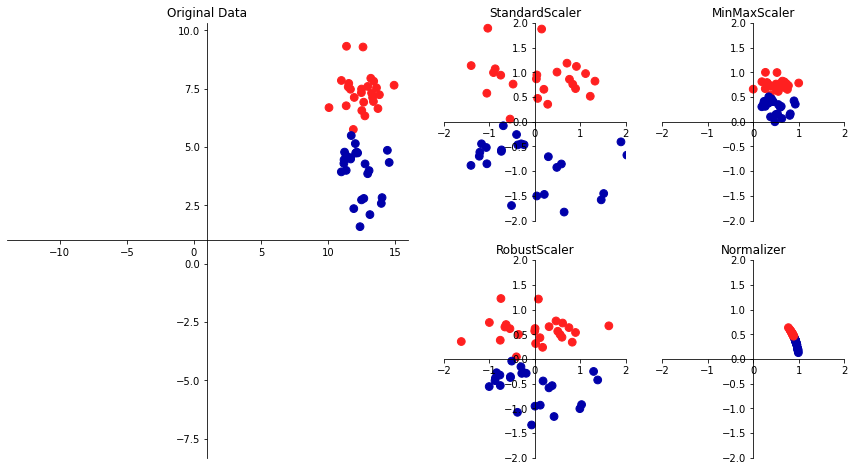

In [ ]:
mglearn.plots.plot_scaling()

print("Different ways to rescale and preprocess a data")

**Different Kind of Preprocessing**

The first plot shows a synthetic two-class classification dataset with two features. The first feature (the x-axis value) is between 10 and 15. The second feature (the y-axis value) is between around 1 and 9.

The following four plots show four different ways to transform the data that yield more standard ranges. The `StandardScaler` in `scikit-learn` ensures that for each feature the mean is 0 and the variance is 1, bringing all features to the same magnitude. However, this scaling does not ensure any particular minimum and maximum values for the features. The `RobustScaler` works similarly to the `StandardScaler`in that it ensures statistical properties for each feature that guarantee that they are on the same scale. However, the `RobustScaler` uses the median and quartiles, instead of mean and variance. This makes the `RobustScaler` ignore data points that are very different from the rest (like measurement errors). These odd data points are also called outliers, and can lead to trouble for other scaling techniques.

The `MinMaxScaler`, on the other hand, shifts the data such that all features are exactly between 0 and 1. For the two-dimensional dataset this means al lof the data is contained within the rectangle created by the x-axis between 0 and 1 and the y-axis between 0 and 1.

Finally, the `Normalizer` does a very different kind of rescaling. It scales each data point such that the feature vector has a Euclidean length of 1. In other words, it projects a data point on the circle (or sphere, in the case of higher dimensions) with a radius of 1. This means every data point is scaled by a different number (by the inverse of its length). This normalization is often used when only the direction (or angle) of the data matters, not the length of the feature vector.

**Applying Data Transformations**

Now that we've seen what the different kinds of transformations do, let's apply them using `scikit-learn`. We will use the cancer dataset. Preprocessing methods like the scalers are usually applied before applying a supervised machine learning algorithm. As an example, say we want to apply the kernal SVM (SVC) to the cancer dataset, and use `MinMaxScaler` for preprocessing the data. We start by loading our dataset and splitting it into a training set and a test set (we need separate training and test sets to evaluate the supervised model we will build after the preprocessing):

In [ ]:
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import train_test_split

cancer = load_breast_cancer()

X_train, X_test, y_train, y_test = train_test_split(cancer.data,
                                                    cancer.target,
                                                    random_state=1)

print(X_train.shape)
print(X_test.shape)

(426, 30)
(143, 30)


As a reminder, the dataset contains 569 data points, each represented by 30 measurements. We split the dataset into 426 sample for the training set and 143 samples for the test set.

As with the supervised models we built earlier, we first import the class that implements the preproccessing, and then instantiate it:

In [ ]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

We then fit the scaler using the `fit` method, applied to the training data. For the `MinMaxScaler`, the `fit` method computes the minimum and maximum value of each feature on the training set. In contrast to the classifiers and regressors of Chapter 2, the scaler is only provided with the data `(X_train)` when `fit` is called, and `y_train` is not used:

In [ ]:
scaler.fit(X_train)

MinMaxScaler()

To apply the SVM to the scaled data, we also need to transform the test set. This is again done by calling the `transform` method, this time on `X_test`:

In [ ]:
# transform test data
X_test_scaled = scaler.transform(X_test)

# print test data properties after scaling
print("per-feature minimum after scaling:\n{}".format(X_test_scaled.min(axis=0)))
print("per-feature maximum after scaling:\n{}".format(X_test_scaled.max(axis=0)))

per-feature minimum after scaling:
[ 0.0336031   0.0226581   0.03144219  0.01141039  0.14128374  0.04406704
  0.          0.          0.1540404  -0.00615249 -0.00137796  0.00594501
  0.00430665  0.00079567  0.03919502  0.0112206   0.          0.
 -0.03191387  0.00664013  0.02660975  0.05810235  0.02031974  0.00943767
  0.1094235   0.02637792  0.          0.         -0.00023764 -0.00182032]
per-feature maximum after scaling:
[0.9578778  0.81501522 0.95577362 0.89353128 0.81132075 1.21958701
 0.87956888 0.9333996  0.93232323 1.0371347  0.42669616 0.49765736
 0.44117231 0.28371044 0.48703131 0.73863671 0.76717172 0.62928585
 1.33685792 0.39057253 0.89612238 0.79317697 0.84859804 0.74488793
 0.9154725  1.13188961 1.07008547 0.92371134 1.20532319 1.63068851]


Maybe somewhat surprisingly, you can see that for the test set, after scaling, the minimum and maximum are not 0 and 1. Some of the features are even outside the 0-1 range! The explanation is that the `MinMaxScaler` (and all the other scalesrs) always applies exactly the same transformation to the training and the test set. This means the `transform` method always subtracts the training set minimum and divides by the training set range, which might be different frm the minimum and range for the test set.

**Scaling Training and Test Data the Same Way**

It is important to apply exactly the same transformation to the training set and the test set for the supervised model to work on the test set. The following example illustrates what would happen if we were to use the minimum and range of the test set instead:

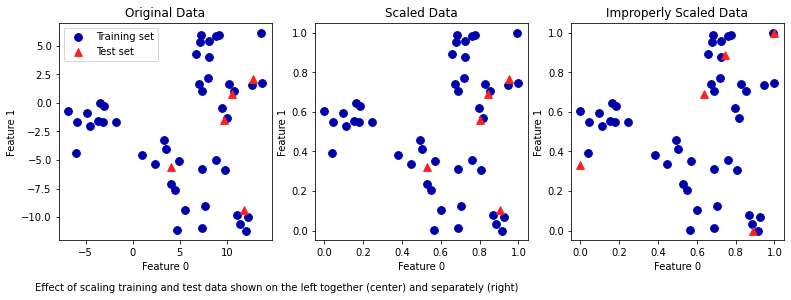

In [ ]:
from sklearn.datasets import make_blobs
from matplotlib.axes._axes import _log as matplotlib_axes_logger
matplotlib_axes_logger.setLevel('ERROR')

# make synthetic data
X, _ = make_blobs(n_samples=50, centers=5, random_state=4, cluster_std=2)

# split it into training and test sets
X_train, X_test = train_test_split(X, random_state=5, test_size=.1)

# plot the training and test sets.
fig, axes = plt.subplots(1, 3, figsize=(13, 4))

axes[0].scatter(X_train[:, 0], X_train[:, 1],
                c=mglearn.cm2(0), label="Training set", s=60)
axes[0].scatter(X_test[:, 0], X_test[:, 1], marker='^',
                c=mglearn.cm2(1), label="Test set", s=60)
axes[0].legend(loc='upper left')
axes[0].set_title("Original Data")

# scale the data using MinMaxScaler
scaler = MinMaxScaler()
scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

# visualize the properly scaled data
axes[1].scatter(X_train_scaled[:, 0], X_train_scaled[:, 1],
                c=mglearn.cm2(0), label="Training set", s=60)
axes[1].scatter(X_test_scaled[:, 0], X_test_scaled[:, 1], marker='^',
                c=mglearn.cm2(1), label="Test set", s=60)
axes[1].set_title("Scaled Data")

# rescaled the test set separately
# so test set min is 0 and test set max is 1
# DO NOT DO THIS! For illustration purpose only.
test_scaler = MinMaxScaler()
test_scaler.fit(X_test)
X_test_scaled_badly = test_scaler.transform(X_test)

# visualize wrongly scaled data
axes[2].scatter(X_train_scaled[:, 0], X_train_scaled[:, 1],
                c=mglearn.cm2(0), label="Training set", s=60)
axes[2].scatter(X_test_scaled_badly[:, 0], X_test_scaled_badly[:, 1],
                marker='^', c=mglearn.cm2(1), label="test set", s=60)
axes[2].set_title("Improperly Scaled Data")

for ax in axes: 
  ax.set_xlabel("Feature 0")
  ax.set_ylabel("Feature 1")

plt.figtext(0.1, -0.05, "Effect of scaling training and test data shown on\
 the left together (center) and separately (right)")

plt.show()

The first panel is an unscaled two-dimensional dataset, with the training set shown as circles and the test set shown as triangles. The second panel is the same data, but scaled using the `MinMaxScaler`. Here, we called `fit` on the training set, and then called `transform` on the training and test sets. You can see that the dataset in the secoond panel looks indentical to the firs; only the ticks on the axes have changed. Now all the features are between 0 and 1. You can also that the minimum and maximum feature values for the test data (the triangles) are not 0 and 1.

The third panel shows what whould happen if we scaled the training set and test set separately. In this case, the minimum and maximum feature values for both the training and test set are 0 and 1. But now the dataset looks different. The test points moved incongruously to the training set, as they were scaled differently. We changed the arrangement of the data in an arbitrary way. Cleary this is not what we want to do.

As another way to think about this, imagine your test set is a single point. There is no way to scale a single point correctly, to fulfil the minimum and maximum requirements of the `MinMaxScaler`. But the size of your test set should not change your processing.

**The Effect of Preprocessing on Supervised Learning**

Now let's go back to the `cancer` dataset and see the effect of using the `MinMaxScaler` on learning the SVC (this is a diffeerent way of doing the same scaling we did in Chapter 2). First, let's fit the SVC on the original data again for comparison:

In [ ]:
from sklearn.svm import SVC 

X_train, X_test, y_train, y_test = train_test_split(cancer.data, 
                                                    cancer.target,
                                                    random_state=0)

svm = SVC(C=100)
svm.fit(X_train, y_train)
print("Test set accuracy: {:.2f}".format(svm.score(X_test, y_test)))

Test set accuracy: 0.94


In [ ]:
# preprocessing using 0-1 scaling
scaler = MinMaxScaler()
scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

# learning on SVM on the scaled training data
svm.fit(X_train_scaled, y_train)

# scoring on the scaled test set
print("Scaled test set accuracy: {:.2f}".format(svm.score(X_test_scaled, y_test)))

Scaled test set accuracy: 0.97


As we saw before, the effect of scaling the data is quite significant. Even though scaling the data doesn't involve any complicated math, it is good practice to use the scaling mechanisms provided by `scikit-learn` instead of reimplementing them yourself, as it's easy to make mistakes even in these simple computations.

You can also easily replace one preprocessing algorithm with another by changing the class you use, as all of the preprocessing classes have the same interface, consisting of the `fit` and `transform` methods:

In [ ]:
# preprocessing using zero mean and unit variance scaling
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler() 
scaler.fit(X_train)

X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

# learning on SVM on the scaled trainig data
svm.fit(X_train_scaled, y_train)

# scaring on the scaled test set
print("SVM test accuracy: {:.2f}".format(svm.score(X_test_scaled, y_test)))

SVM test accuracy: 0.96


Now that we've seen how simple data transformations for preprocessing work, let's move on to more interesting transformations using unsupervised learning.

## **Dimensionality Reduction, Feature Extraction, and Manifold Learning**

As we discussed earlier, transforming data using unsupervised learning can have many motivations. **The most common motivations are visualization**, compressing the data, and finding a representation that is more informative for further processing.

**One of the simplest and most widely used-algorithms** for all of these is principal component analysis. We'll also look at two other algorithms: **non-negative matrix factorization** (NMF), which is commonly used for feature extraction, and **t-SNE**, which is commonly used for visualization using two-dimensional scatter plots.

**Principal Component Analysis (PCA)**

principal component analysis is a method that **rotates the dataset** in a way such that the rotated features are statistically uncorrelated. This rotation is often followed by selecting only a subset of the new features, according to how important they are for explaining the data. The following example Figure illustrates the effect of PCA on a synthetic two-dimensional dataset:

Transformation of data with PCA


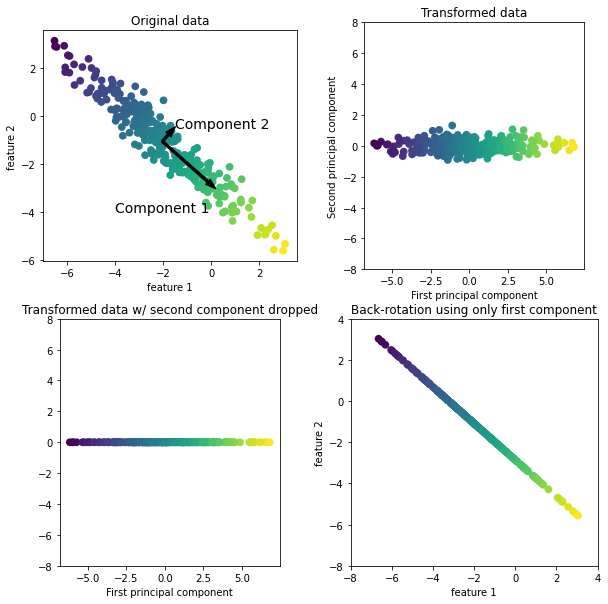

In [ ]:
mglearn.plots.plot_pca_illustration()

print("Transformation of data with PCA")

**The first plot (top left)** shows the original data points, colored to distinguish among them. The algorithm proceeds by first **finding the direction of maximum variance**, labeled "Component 1." This is **the direction (or vector) in the data that contains most of the information**, or in other words, the direction along which the features are most correlated with each other. Then, the algorithm finds the direction that contains the most information while being orthogonal (at a right angle)  to the first direction. In two dimensional spaces there would be (infinitely) many orthogonal directions. Although the two components are drawn as arrows, it doesn't really matter where the head and the tail are; we could have drawn the first component from the center up to the top left instead of down to the bottom right. The directions found using this process are called **principal components**, as they are the main directions of variance in the data. In general, there are as many principal components as original features.

**The second plot (top right)** shows **the same data**, **but now rotated** so that the first principal component aligns with the x-axis and the second principal component aligns with the y-axis. **Before the rotation, the mean was substracted from the data**, so that the transformed data is centered around zero. In the rotated representation found by PCA, the two axes are uncorrelated, meaning that the correlation matrix of the data in this representation is zero except for the diagonal.

We can use PCA for dimensionality reduction by retaining only some of the principal components. In this example, we might keep only the first principal component, as shown in **the third panel (bottom left)**. This **reduces the data from a two-dimensional dataset to a one-dimensional dataset**. Note, however, that instead of keeping only one of the original features, we found the most interesting direction (top left to bottom right in the first panel) and kept this direction, the first principal component.

Finally, we can **undo the rotation** and add the mean back to the data. This will result in the data shown in **the last panel**. These points are in the original feature space, but we kept only the information contained in the first principal component. This transformation is sometimes used to remove noise effects from the data or visualize what part of the information is retained using the principal components.

**Applying PCA to the cancer dataset for visualization**

One of the most common applications of PCA is **visualizing high-dimensional datasets**. As we saw in Chapter 1, it is **hard to create scatter plots of data that has more than two features**. For the Iris dataset, we were able to create a pair plot that give us a partial picture of the data by showing us all the possible combinations of two features. But if we want to look at the Breast Cancer dataset, even using a pair plot is tricky. This dataset has 30 features, which would result in 30 * 14 = 420 scatter plots! We'd never be albel to look at all these plots in detail, let alone try to understand them.

There is an even simpler visualization we can use, though -computing histograms of each of the features for the two classes, benign and malignant cancer:

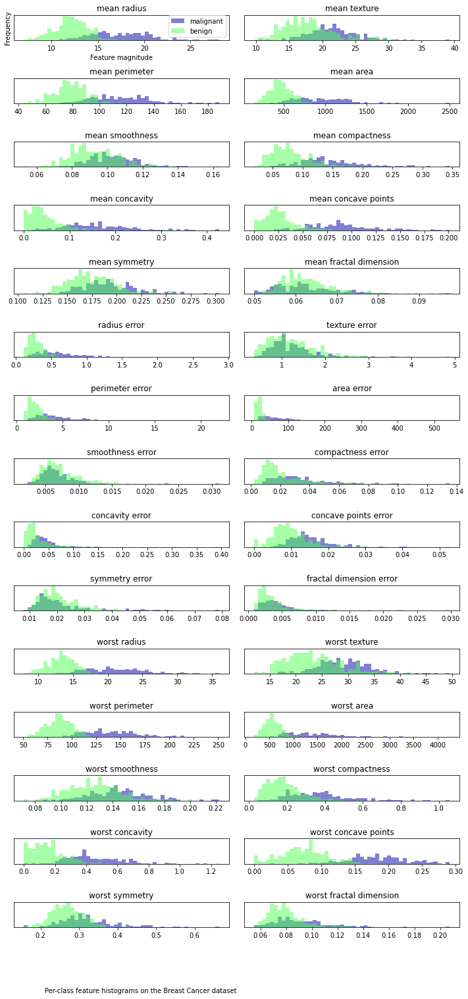

In [ ]:
from sklearn.datasets import load_breast_cancer

cancer = load_breast_cancer()

fig, axes = plt.subplots(15, 2, figsize=(10, 20))
malignant = cancer.data[cancer.target == 0]
benign = cancer.data[cancer.target == 1]

ax = axes.ravel()

for i in range(30):
  _, bins = np.histogram(cancer.data[:, i], bins=50)
  ax[i].hist(malignant[:, i], bins=bins, color=mglearn.cm3(0), alpha=.5)
  ax[i].hist(benign[:, i], bins=bins, color=mglearn.cm3(2), alpha=.5)
  ax[i].set_title(cancer.feature_names[i])
  ax[i].set_yticks(())
  
ax[0].set_xlabel("Feature magnitude")
ax[0].set_ylabel("Frequency")
ax[0].legend(["malignant", "benign"], loc="best")
fig.tight_layout()

plt.figtext(0.1, -0.05, "Per-class feature histograms on\
 the Breast Cancer dataset")

plt.show()

Here we create a **histogram for each of the features**, counting how often a data point appears with a feature in a certain range (called a bin). Each plot overlays two histograms, one for all of the points in the benign class (blue) and one for all the points in the malignant class (red). This gives us some idea of how **each feature is distributed across the two classes**, and allows us to venture a guess as to **which features are better at distinguishing malignant and benign samples**. For example, the feature "smoothness error" seems quite uninformative, becuase the two histograms mostly overlap, while the feature "worst concave points" seems quite informative, because the histograms are quite disjoint.

However, this plot doesn't show us anything about the interactions between variables and how these relate to the classes. Using PCA, we can capture the main interactions and get a slightly more complete picture. We can find the first two principal components, and visualize the data in this new two-dimensional space with a single scatter plot.

Before we apply PCA, we scale our data so that each feature has unit variance using `StandardScaler`:

In [ ]:
from sklearn.datasets import load_breast_cancer 
from sklearn.preprocessing import StandardScaler

cancer = load_breast_cancer()

scaler = StandardScaler()
scaler.fit(cancer.data)
X_scaled = scaler.transform(cancer.data)

Learning the PCA transformation and applying it is as simple as applying a preprocessing transformation. We instantiate the PCA object, find the principal components by calling the `fit` method, and then apply the rotation and dimensionality reduction by calling `transform`. By default, PCA only rotates (and shifts) the data, but keeps all principal components. To reduce the dimensionality of the data, we need to specify how many components we want to keep when creating the PCA object:

In [ ]:
from sklearn.decomposition import PCA

# keep the first two principal components of the data
pca = PCA(n_components=2)
# fit PCA model to breast cancer data
pca.fit(X_scaled)

# transform data onto the first two principal componets
X_pca = pca.transform(X_scaled)
print("Original shape: {}".format(str(X_scaled.shape)))
print("Reduce shape: {}".format(str(X_pca.shape)))

Original shape: (569, 30)
Reduce shape: (569, 2)


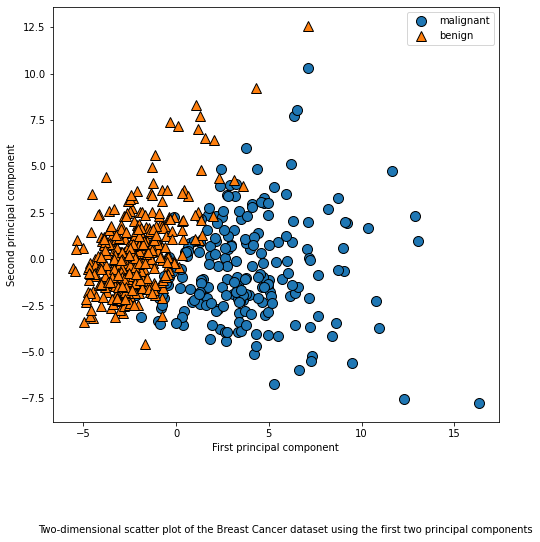

In [ ]:
# plot first vs. second principal component, colored by class
plt.figure(figsize=(8, 8))

mglearn.discrete_scatter(X_pca[:, 0], X_pca[:, 1], cancer.target)
plt.legend(cancer.target_names, loc="best")
plt.gca().set_aspect("equal")

plt.xlabel("First principal component")
plt.ylabel("Second principal component")
plt.figtext(0.1, -0.05, "Two-dimensional scatter plot of \
the Breast Cancer dataset using the first two principal components")

plt.show()

It is important to note that PCA is an unsupervised method, and doee not use any class information when finding the rotation. It simply looks at the correlations in the data. For the scatter plot shown here, we plotted the first principal component against the second principal component, and then used the class information to color the points. You can see that the two classes separate quite well in this two-dimensional space. This leads us to believe that even a linear classifier (that would learn a line in this space) could do a reasonably good job at distinguishing the two classes. We can also see that the malignant (red) points are more spread out than the benign (blue) points -something that we could already see a bit from the histograms.

A downside of PCA is that the two axes in the plot are often not very easy to interpret. The principal components correspond to directions in the original data, so they are combinations of the original features. However, these combinations are usually very complex, as we'll see shortly. The principal components themselves are stored in the `components_` attribute of the PCA object during fitting.

In [ ]:
print("PCA component shape: {}".format(pca.components_.shape))

PCA component shape: (2, 30)


Each row in `components_` corresponds to one principal component, and they are sorted by their importance (the first principal component comes first, etc.). The columns correspond to the original features attribute of the PCA in this example, "mean radius," "mean texture," and so on. Let's have a look at the content of `components_`:

In [ ]:
print("PCA components:\n{}".format(pca.components_))

PCA components:
[[ 0.21890244  0.10372458  0.22753729  0.22099499  0.14258969  0.23928535
   0.25840048  0.26085376  0.13816696  0.06436335  0.20597878  0.01742803
   0.21132592  0.20286964  0.01453145  0.17039345  0.15358979  0.1834174
   0.04249842  0.10256832  0.22799663  0.10446933  0.23663968  0.22487053
   0.12795256  0.21009588  0.22876753  0.25088597  0.12290456  0.13178394]
 [-0.23385713 -0.05970609 -0.21518136 -0.23107671  0.18611302  0.15189161
   0.06016536 -0.0347675   0.19034877  0.36657547 -0.10555215  0.08997968
  -0.08945723 -0.15229263  0.20443045  0.2327159   0.19720728  0.13032156
   0.183848    0.28009203 -0.21986638 -0.0454673  -0.19987843 -0.21935186
   0.17230435  0.14359317  0.09796411 -0.00825724  0.14188335  0.27533947]]


We can also visualize the coefficients using a heat map, which might be easier to understand:

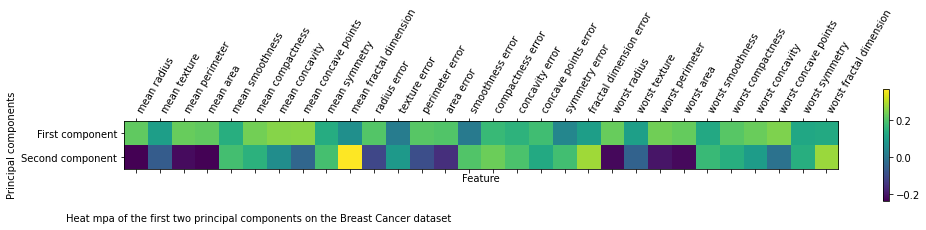

In [ ]:
plt.matshow(pca.components_, cmap='viridis') 
plt.yticks([0, 1], ["First component", "Second component"])
plt.colorbar()
plt.xticks(range(len(cancer.feature_names)),
           cancer.feature_names, rotation=60, ha='left')

plt.xlabel("Feature")
plt.ylabel('Principal components')

plt.figtext(0.1, -0.05, "Heat mpa of the first two principal components on\
 the Breast Cancer dataset")

plt.show()

You can see that in the first component, all features have the same sign (it's negative, but as we mentioned earlier, it doesn't matter which direction the arrow point in). That means that there is a general correlation between all features. As one measurement is high, the others are likely to be high as well. The second component has mixed signs, and both of  the components involve all of the 30 features. This mixing of all features is what makes explaining the axes so ticky.

**Eigenfaces for feature extraction**

Another application of PCA that we mentioned earlier is feature extraction. The idea behind feature extraction is that it is possible to find a representation of your data that is better suited to analysis than the raw representation you were given. A great example of an application where feature extractin is helpful is with images. Images are made up of pixels, usually stored as red, green, and blue (RGB) intensities. Objects in images are usually made up of thousands of pixels, and only together are they meaningful.

We will give a very simple application of feature extracton on images using PCA, by working with face images from the Labeled Faces in the Wide dataset. This dataset contains face images of celebrities downloaded from the Internet, and it includeds faces of politicians, singers, actors, and athletes fro mthe early 2000s. We use gray-scale versins of these images, and scale them down for faster processing. 

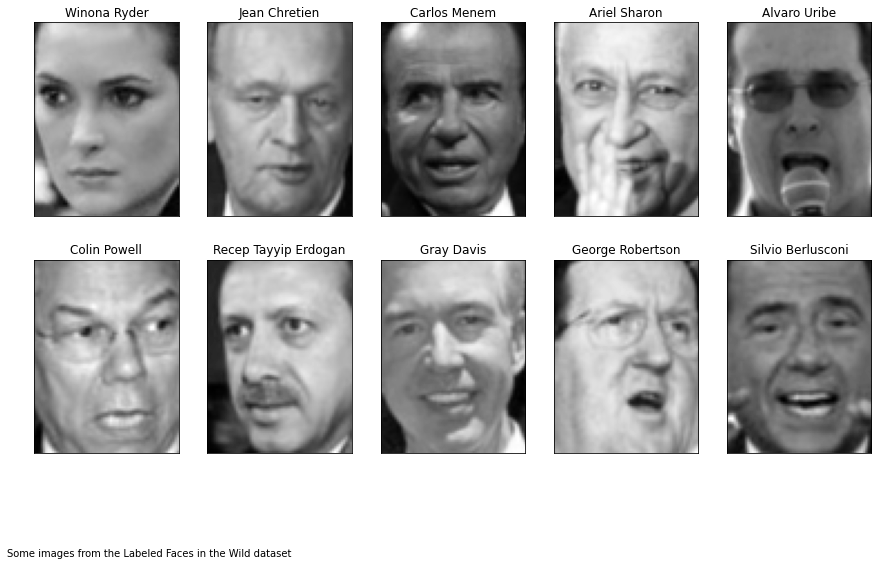

In [ ]:
from sklearn.datasets import fetch_lfw_people

people = fetch_lfw_people(min_faces_per_person=20, resize=0.7)
image_shape = people.images[0].shape

fix, axes = plt.subplots(2, 5, figsize=(15, 8),
                         subplot_kw={'xticks': (), 'yticks': ()})

for target, image, ax in zip(people.target, people.images, axes.ravel()):
  ax.imshow(image, cmap='gray') 
  ax.set_title(people.target_names[target]) 

plt.figtext(0.1, -0.05, "Some images from the Labeled Faces in the Wild dataset")
plt.show()

There are 3,023 images, each 87 X 65 pixels large, belonging to 62 different people:

In [ ]:
print("people.iamges.shape: {}".format(people.images.shape))
print("Number of classes: {}".format(len(people.target_names)))

people.iamges.shape: (3023, 87, 65)
Number of classes: 62


The dataset is a bit skewed, however, containing a lot of images of George W. Bush and Colin Powell, as you can see here:

In [ ]:
# count how often ech target appears 
counts = np.bincount(people.target)

# print count next to target names
for i, (count, name) in enumerate(zip(counts, people.target_names)):
  print("{0:25} {1:3}".format(name, count), end=' ')
  if (i + 1) % 3 == 0:
    print()

Alejandro Toledo           39 Alvaro Uribe               35 Amelie Mauresmo            21 
Andre Agassi               36 Angelina Jolie             20 Ariel Sharon               77 
Arnold Schwarzenegger      42 Atal Bihari Vajpayee       24 Bill Clinton               29 
Carlos Menem               21 Colin Powell              236 David Beckham              31 
Donald Rumsfeld           121 George Robertson           22 George W Bush             530 
Gerhard Schroeder         109 Gloria Macapagal Arroyo    44 Gray Davis                 26 
Guillermo Coria            30 Hamid Karzai               22 Hans Blix                  39 
Hugo Chavez                71 Igor Ivanov                20 Jack Straw                 28 
Jacques Chirac             52 Jean Chretien              55 Jennifer Aniston           21 
Jennifer Capriati          42 Jennifer Lopez             21 Jeremy Greenstock          24 
Jiang Zemin                20 John Ashcroft              53 John Negroponte            31 

To make the data less skewed, we will only take up to 50 images of each person (otherwise, the feature extraction would be overwhelmed by the likelihood of George W. Bush):

In [ ]:
mask = np.zeros(people.target.shape, dtype='bool')
for target in np.unique(people.target):
  mask[np.where(people.target == target)[0][:50]] = 1

X_people = people.data[mask]
y_people = people.target[mask]

# scale the grayscale values to be between 0 and 1
# instead of 0 and 255 for better numeric stability
X_people = X_people / 255.

A common task in face recognition is to ask if a previously unseen face belongs to a known person from a database. This has applications in photo collection, social media, and security applications. One way to solve this problem whould be to build a classifier where each person is a separate class. However, there are usually many different people in face databases, and very few images of the same people (i.e., very few training examples per class). That makes it hard to train most classifiers. Additionally, you often want to be able to add new people easily, without needing to retrain a large model.

A simple solution is to use a one-nearest-neighbor classifier that looks for the most similar face image to the face you are classifying. This classifier could in principle work with only a single training example per class. Let's take a look at how well `KNeighborsClassifier` does here:

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split

# split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X_people, 
                                                    y_people,
                                                    stratify=y_people,
                                                    random_state=0)

# build a KneighborsClassifier using one neighbor
knn = KNeighborsClassifier(n_neighbors=1)
knn.fit(X_train, y_train)
print("Test set score of 1-nn: {:.2f}".format(knn.score(X_test, y_test)))

Test set score of 1-nn: 0.23


We obtain an accuracy of 26.6%, which is not actually that bad for a 62-class classification problem (random guessing would give you around 1/62 = 1.5% accuracy), but is also not great. We only correctly identify a person every fourth time.

This is where PCA comes in. Computing distances in the original pixel space is quite a bad way to measure similarity between faces. When using a pixel representation to compare two images, we compare the grayscale value of each individual pixel to the value of the pixel in the corresponding position in the other image. This representation is quite different from how humans would interpret the iamge of a face, and it is hard to capture the facial features using this raw representation. For example, using pixel distances means that shifting a face by one pixel to the right corresponds to a drastic change, with a completely different representation. We hope that using distances along principal components can improve our accuracy. Here, we enable the whitening option of PCA, which rescales the principal components to have the same scale. This is the same using `StandardScaler` after the transformation, whitening corresponds to not only rotating the data, but also rescaling it so that the center panel is a circle instead of an ellips.

Transformation of data with PCA using whitening


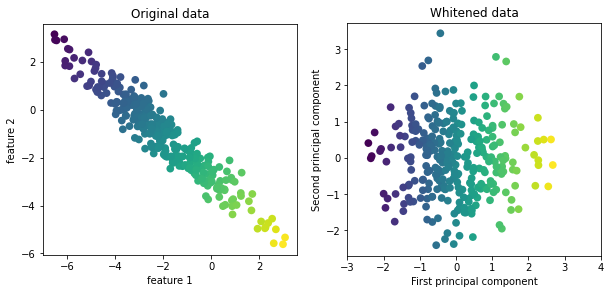

In [ ]:
mglearn.plots.plot_pca_whitening()

print("Transformation of data with PCA using whitening")

We fit the PCA object to the training data and extract the first 100 principal components. Then we transform the training and test data:

In [ ]:
from sklearn.decomposition import PCA

pca = PCA(n_components=100, whiten=True, random_state=0).fit(X_train)
X_train_pca = pca.transform(X_train)
X_test_pca = pca.transform(X_test)

print("X_train_pca.shape: {}".format(X_train_pca.shape))

X_train_pca.shape: (1547, 100)


The new data has 100 features, the first 100 principal components. Now, we can use the new representation to classify our images using a one-nearest-neighbors classifier:

In [ ]:
knn = KNeighborsClassifier(n_neighbors=1)
knn.fit(X_train_pca, y_train)
print("Test set accuracy: {:.2f}".format(knn.score(X_test_pca, y_test)))

Test set accuracy: 0.31


Our accuracy improved quite significantly, from 26.6% to 35.7%, confirming our intuition that the principal components might provide a better representation of the data.

For image data, we can also easily visualize the principal components that are found. Remember that components correspond to directions in the input space. The input space here is 50X37-pixel grayscale images, so directions within this space are also 50X37-pixel grayscale images.

Let's look at the first couple of principal components

In [ ]:
print("pca.components_.shape: {}".format(pca.components_.shape))

pca.components_.shape: (100, 5655)


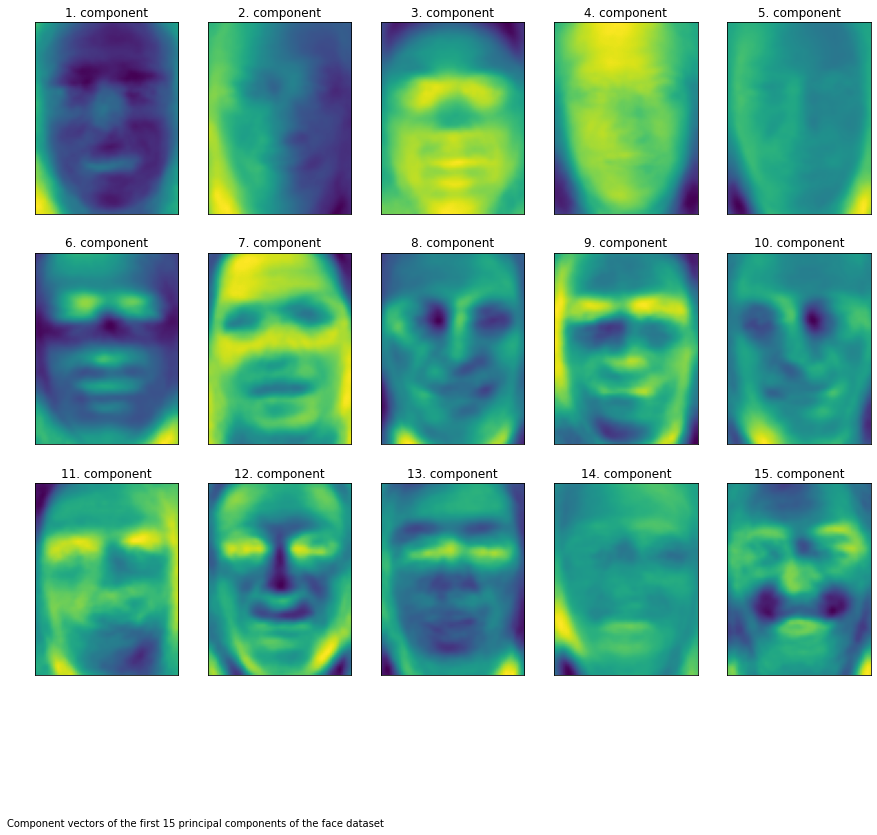

In [ ]:
fix, axes = plt.subplots(3, 5, figsize=(15, 12),
                         subplot_kw={'xticks': (), 'yticks': ()})

for i, (component, ax) in enumerate(zip(pca.components_, axes.ravel())):
  ax.imshow(component.reshape(image_shape), cmap='viridis')
  ax.set_title("{}. component".format((i + 1)))

plt.figtext(0.1, -0.05, "Component vectors of the first 15 principal \
components of the face dataset")
plt.show()

While we certainly cannot understand all aspects of these components, we can guess which aspects of the face images some of the components are capturing. The first component seems to mostly encode the contrast between the face and the back-ground, the second component encodes differences in lighting between the right and the left half of the face, and so on. While this representation is slightly more semantic than the raw pixel values, it is still quite far from how a human might perceive a face. As the PCA model is based on pixels, the alignment of the face (the position of eyes, chin, and nose) and the lighting both have a strong influence on how similar two images are in their pixel representation. But alignment and lighting are probably not what a human would perceive first. When asking people to rate similarity of faces, they are more likely to use attributes like age, gender, facial expression, and hair style, which are attributes that are hard to infer from the pixel intensities. It's important to keep in mind that algorithms often interpret data (particularly visual data, such as images, which humans are very familar with) quite differently from how a human would. 

Let's come back to the specific case of PCA, though. We introduced the PCA transformation as rotating the data and then dropping the components with low variance. Anothe useful interpretation is to try to find some numbers (the new feature values after the PCA rotation) so that we can express the test points as a weighted sum of the principal components.

Here, X<sub>0</sub>,X<sub>1</sub>, and so on are the coefficients of the principal components for this data point; in other words, they are the representation of the image in the rotated space.

Another way we can try to understand what a PCA model is doing is by looking at the reconstructions of the original data using only some components. after dropping the second component and arriving at the third  panel, we undid the rotation and added the mean back to obtain new points in the original space with the second component removed, as shown in the last panel. We can do a similar transformation for the faces by reducing the data to only some principal components and then rotating back into the original space. This return to the original feature space can be done using the `inverse_transform` method. Here, we visualize the reconstruction of some faces using 10, 50, 100, 500, or 2,000 components

________________________________________________________________________________
[Memory] Calling mglearn.plot_pca.pca_faces...
pca_faces(array([[0.535948, ..., 0.243137],
       ...,
       [0.043137, ..., 0.596078]], dtype=float32), 
array([[0.237908, ..., 0.269281],
       ...,
       [0.4     , ..., 0.254902]], dtype=float32))
_______________________________________________________pca_faces - 13.7s, 0.2min
Reconstructing three face images using increasing numbers of principal components


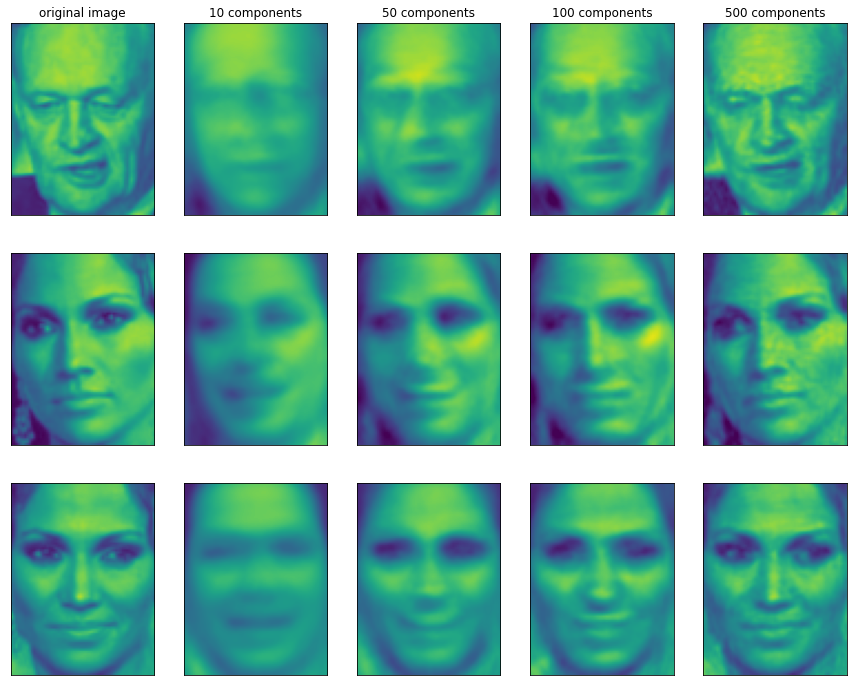

In [ ]:
mglearn.plots.plot_pca_faces(X_train, X_test, image_shape);

print("Reconstructing three face images using increasing \
numbers of principal components")

You can see that when we use only the first 10 principal components, only the essence of the picture, like the face orientation and lighting, is captured. By using mroe and more principal components, more and more details in the image are preserved. This corresponds to extending the sum to include more and more terms. Using as many components as there are pixels would mean that we would not discard any information after the rotation, and we would reconstruct the image perfectly.

We can also try to use PCA to visualize all the faces in the dataset in a scatter plot using the first two principal components, wiht classes given by who is shown in the image, similarly to what we did for the `cancer` dataset:

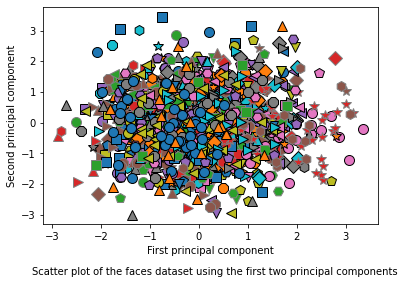

In [ ]:
mglearn.discrete_scatter(X_train_pca[:, 0], X_train_pca[:, 1], y_train)

plt.xlabel("First principal component")
plt.ylabel("Second principal component")
plt.figtext(0.1, -0.05, "Scatter plot of the faces dataset using the first \
two principal components")

plt.show()

As you can see, when we use only the first two principal components the whole data is just a big blob, with no separation of classes visible. This is not very surprising, given the even with 10 components, PCA only captures very rough characteristics of the faces.

**Non-Negative Matrix Factorization (NMF)**

**Non-negative matrix factorization** is another **unsupervised learning algorithm** that aims to **extract useful features**. It works similarly to PCA and can also be used for dimensionality reduction. As in PCA, we are trying to write each data point as a weighted sum of some components. But whereas in PCA we wanted components that were orthogonal and that explained as much variance of the data as possible, in NMF, we want the components and the coefficients to be non negative; that is, we want both the components and the coefficients to be greater than or equal to zero. Consequently, this method can only be applied to data where each feature is non-negative, as a non-negative sum of non-negative components cannot become negative.

The process of decomposing data into a non-negative weighted sum is particularly helpful for data that is created as the addition (or overlay) of several independent sources, such as an audio track of multiple people speaking, or music with many instrucments. In these situations, NMF can identify the original components that make up the combined data. Overall, NMF leads to more interpretable components that make up the combined data. Overall, NMF leads to more interpretable components than PCA, as negative components and coefficients can lead to hard-to-interpret cancellation effects. The eigenfaces, contain both positive and negative parts, and as we mentioned in the description of PCA, the sign is actually arbitrary. Before we apply NMF to the face dataset, let's briefly revisit the synthetic data.

**Applying NMF to synthetic data**

In contrast to when using PCA, we need to ensure that our data is positive for NMF to be able to operate on the data. This means where the data lies relative to the origin (0,0) actually matters for NMF. Therefore, you can think of the non-negative components that are extracted as directions from (0,0) toward the data.

The following Figure shows the results of NMF on the two-dimensional toy data:

/usr/local/lib/python3.8/dist-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Components found by non-negative matrix factorization with two components (left) and one component (right)


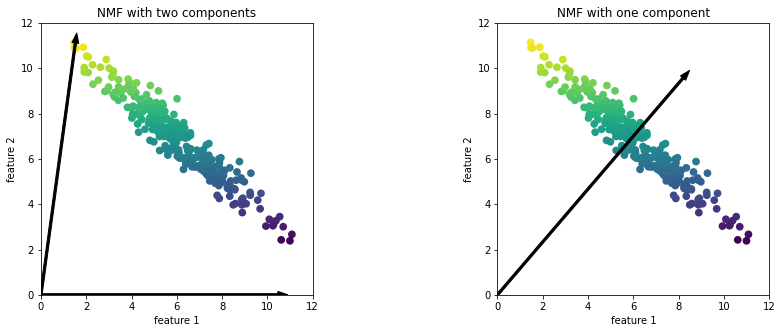

In [ ]:
mglearn.plots.plot_nmf_illustration()

print("Components found by non-negative matrix factorization with two\
 components (left) and one component (right)")

For NMF with two components, as shown on the left, it is clear that all points in the data can be written as a positive combination of the two components. If there are enough components to perfectly reconstruct the data (as many components as there are features), the algorithm will choose directions that point toward the extremes of the data.

If we only use a single component, NMF creates a component that points toward the mean, as pointing there best explains the data. You can see that in contrast with PCA, reducing the number of components not only removes some directions, but creates an entirely different set of components! Components in NMF are also not ordered in any specific way, so there is no "first non-negative component" : all components play an equal part.

NMF uses a random initialization, which might lead to different results depending on the random seed. In relatively simple cases such as the synthetic data with two components, where all the data can be explained perfectly, the randomness has little effect (though it might change the order or scale of the components). In more complex situations, there might be more drastic changes.

**Applying NMF to face images**

Now, let's apply NMF to the Labeled Faces in the Wild dataset we used earlier. The main parameter of NMF is how many components we want to extract. Usually this is lower than the number of input features (otherwise, the data could be explained by making each pixel a separate component).

First, let's imspect how the number of components impacts how well the data can be reconstructed using NMF:

________________________________________________________________________________
[Memory] Calling mglearn.plot_nmf.nmf_faces...
nmf_faces(array([[0.535948, ..., 0.243137],
       ...,
       [0.043137, ..., 0.596078]], dtype=float32), 
array([[0.237908, ..., 0.269281],
       ...,
       [0.4     , ..., 0.254902]], dtype=float32))


/usr/local/lib/python3.8/dist-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/decomposition/_nmf.py:289: FutureWarnin

____________________________________________________nmf_faces - 1251.4s, 20.9min
Reconstructing three face images using increasing numbers of components found by NMF


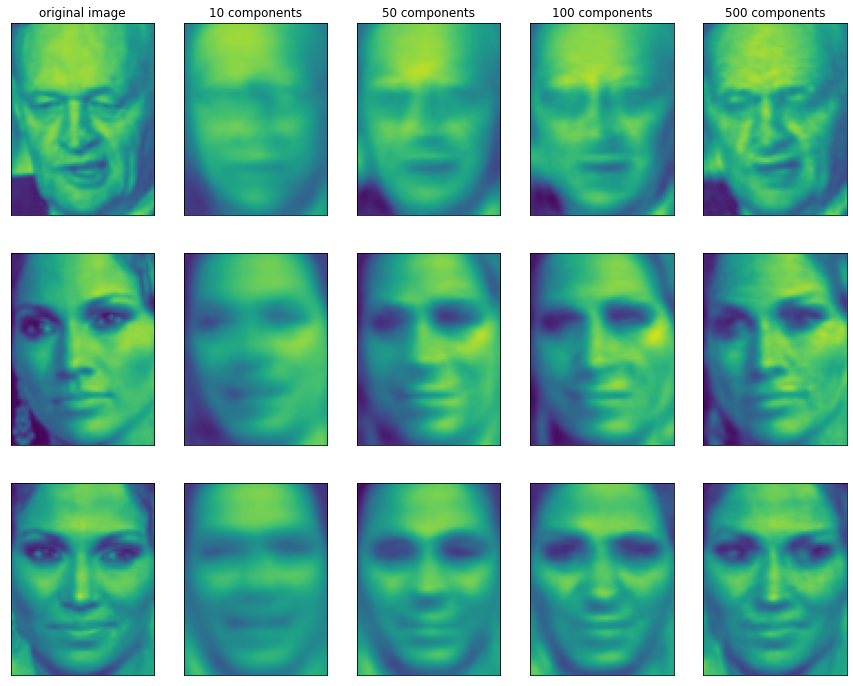

In [ ]:
mglearn.plots.plot_nmf_faces(X_train, X_test, image_shape)

print("Reconstructing three face images using increasing \
numbers of components found by NMF")

The quality of the back-transformed data is similar to when using PCA, but slightly worse. This is expected, as PCA finds the optimum directions in terms of reconstruction. NMF is usually not used for its ability to reconstruct or encode data, but rather for finding interesting patterns within the data.

As a first look into the data, let's try extracting only a few components (say, 15). 

/usr/local/lib/python3.8/dist-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


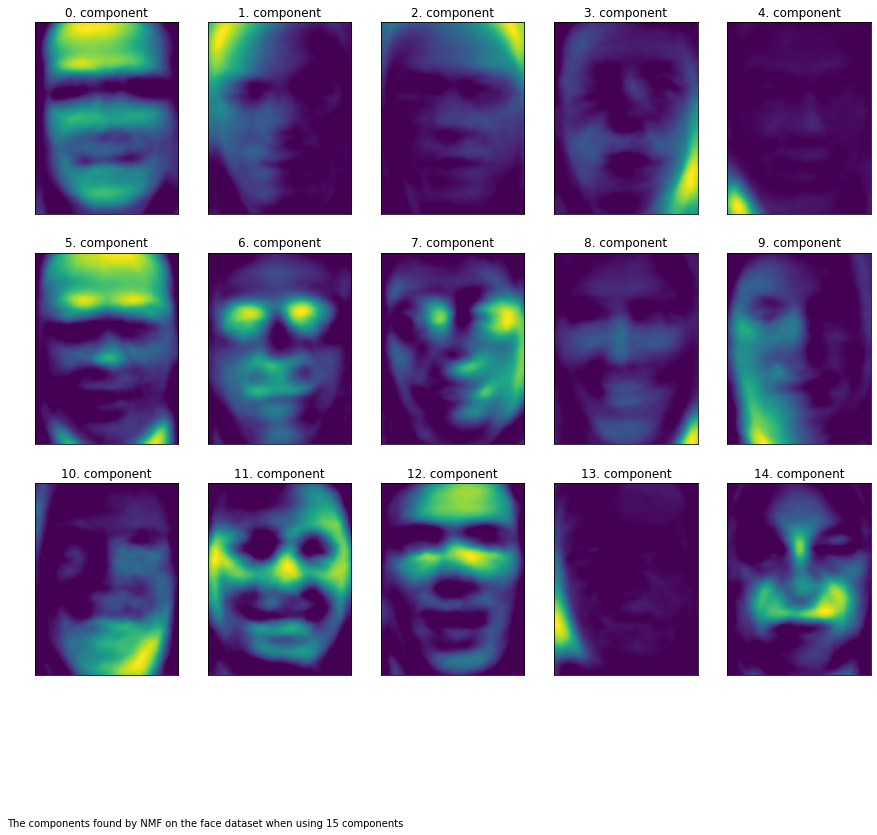

In [ ]:
from sklearn.decomposition import NMF

nmf = NMF(n_components=15, random_state=0)
nmf.fit(X_train)

X_train_nmf = nmf.transform(X_train) 
X_test_nmf = nmf.transform(X_test)

fix, axes = plt.subplots(3, 5, figsize=(15, 12),
                         subplot_kw={'xticks': (), 'yticks': ()})

for i, (component, ax) in enumerate(zip(nmf.components_, axes.ravel())):
  ax.imshow(component.reshape(image_shape))
  ax.set_title("{}. component".format(i))

plt.figtext(0.1, -0.05, "The components found by NMF on the face dataset when \
using 15 components")

plt.show()

These components are all positive, and so resemble prototypes of faces much more so than the components shown for PCA. For example, one can clearly see that component 3 shows a face rotated somewhat to the right, while component 7 shows a face somewhat rotated to the left. Let's look at the images for which these components are particularly strong, 

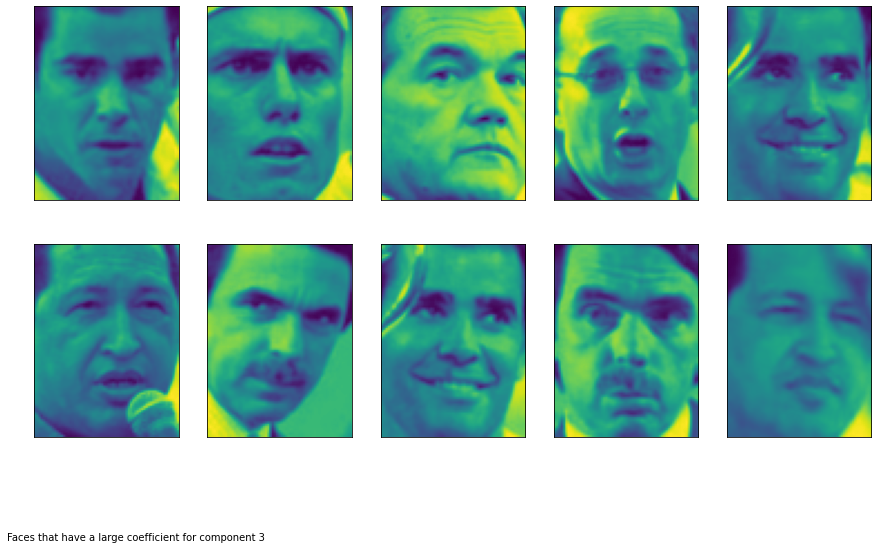

In [ ]:
compn = 3

# sort by 3rd component, plot first 10 images
inds = np.argsort(X_train_nmf[:, compn])[::-1]
fig, axes = plt.subplots(2, 5, figsize=(15, 8),
                         subplot_kw={'xticks': (), 'yticks': ()})

for i, (ind, ax) in enumerate(zip(inds, axes.ravel())):
  ax.imshow(X_train[ind].reshape(image_shape))

plt.figtext(0.1, -0.05, "Faces that have a large coefficient for component 3")
plt.show()

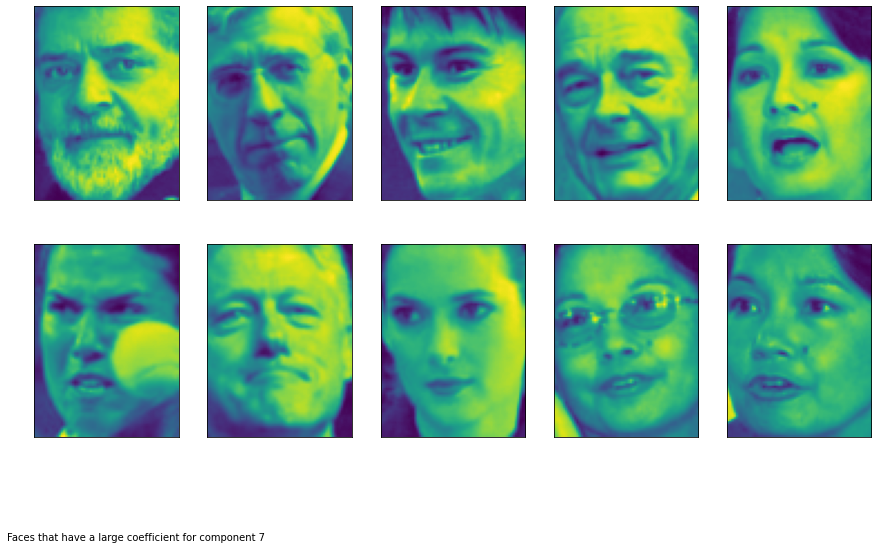

In [ ]:
compn = 7

# sort by 7th component, plot first 10 images
inds = np.argsort(X_train_nmf[:, compn])[::-1]
fig, axes = plt.subplots(2, 5, figsize=(15, 8),
                         subplot_kw={'xticks': (), 'yticks': ()})

for i, (ind, ax) in enumerate(zip(inds, axes.ravel())):
  ax.imshow(X_train[ind].reshape(image_shape))

plt.figtext(0.1, -0.05, "Faces that have a large coefficient for component 7")
plt.show()

As expected, faces that have a high coefficient for component 3 are faces looking to the right, while faces with a high coefficient for component 7 are looking to the left. As mentioned earlier, extracting patterns like these works best for data with additive structure, including audio, gene expression, and text data. Let's walk through one example on synthetic data to see what this might look like.

Let's say we are interested in a signal that is a combination of three different sources

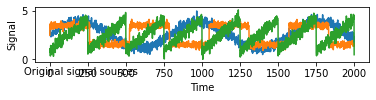

In [ ]:
S = mglearn.datasets.make_signals()
plt.figure(figsize=(6, 1))
plt.plot(S, '-')
plt.xlabel("Time")
plt.ylabel("Signal")
plt.figtext(0.1, -0.05, "Original signal sources")
plt.show()

Unfortunately we cannot observe the original signals, but only an additive mixture of all three of them. We want to recover the decomposition of the mixed signal into the original components. We assume that we have many different ways to observe the mixture (say 100 measurement devices), each of which provides us with a series of measurement:

In [ ]:
# mix data into a 100-dimensional state
A = np.random.RandomState(0).uniform(size=(100, 3))
X = np.dot(S, A.T)
print("shape of measurements: {}".format(X.shape))

shape of measurements: (2000, 100)


In [ ]:
nmf = NMF(n_components=3, random_state=42)
S_ = nmf.fit_transform(X)
print("Recovered signal shape: {}".format(S_.shape))

/usr/local/lib/python3.8/dist-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


Recovered signal shape: (2000, 3)


/usr/local/lib/python3.8/dist-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


In [ ]:
pca = PCA(n_components=3)
H = pca.fit_transform(X)

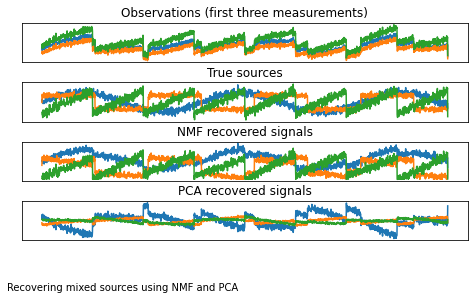

In [ ]:
models = [X, S, S_, H]
names = ['Observations (first three measurements)',
         'True sources',
         'NMF recovered signals',
         'PCA recovered signals']

fig, axes = plt.subplots(4, figsize=(8, 4), gridspec_kw={'hspace': .5},
                         subplot_kw={'xticks': (), 'yticks': ()})

for model, name, ax in zip(models, names, axes):
  ax.set_title(name)
  ax.plot(model[:, :3], '-')

plt.figtext(0.1, -0.05, "Recovering mixed sources using NMF and PCA")
plt.show()

The figure includes 3 of the 100 measurements from X for reference. As you can see, NMF did a reasonable job of discovering the original sources, while PCA failed and used the first component to explain the majority of the variation in the data. Keep in mind that the components produced by NMF have no natural ordering. In this example, the ordering of the NMF components is the same as in the original signal (see the shading of the three curves), but this is purely accidental.

There are many other algorithms that can be used to decompose each data point into a weighted sum of a fixed set of components, as PCA and NMF do. Discussing all of them is beyound the scope of this book, and describing the constraints made on the components and coefficients often involves probability theory. If you are interested in this kind of pattern extraction, we recommend that you study the section of the `scikit_learn` user guid on independent component analysis (ICA), factor analysis (FA), and sparse coding (dictionary learning), all of which you can find on the page about decomposition methods.

**Manifold Learning with t-SNE**

While PCA is often a good first approach for transforming your data so that you might be able to visualize it using a scatter plot, the nature of the method (applying a rotation and then dropping directions) limits its usefulness, as we saw with the scatter plot of the Labeled Faces in the Wild dataset. There is a class of algorithms for visualization called **manifold learning algorithms** that allow for much more complex mappings, and often provide better visualizations. A particularly useful one is the t-SNE algorithm.

Manifold learning algorithms are mainly aimed at visualization, and so are rarely used to generate more than two new features. Some of them, including t-SNE, compute a new representation of the training data, but don't allow transformations of new data. This means these algorithms cannot be applied to a test set: rather, they can only transform the data they were trained for. Manifold learning can be useful for exploratory data analysis, but is rarely used if the final goal is supervised learning. The idea behind t-SNE is to find a two-dimensional representation of the data that preserves the distances between points as best as possible. t-SNE starts with a random two-dimensional representation for each data point, and then tries to make points that are close in the original feature space closer, and points that are far apart in the original feature space farther apart. t-SNE puts more emphasis on points that are close by rather than preserving distances between far-apart points. In other words, it tries to perserve the information indicating which points are neighbors to each other.

We will apply the t-SNE manifold learning algorithm on a dataset of handwritten digits that is included in `scikit-learn`. Each data point in this dataset is an 8x8 gray-scale image of a handwritten digit between 0 and 1. 

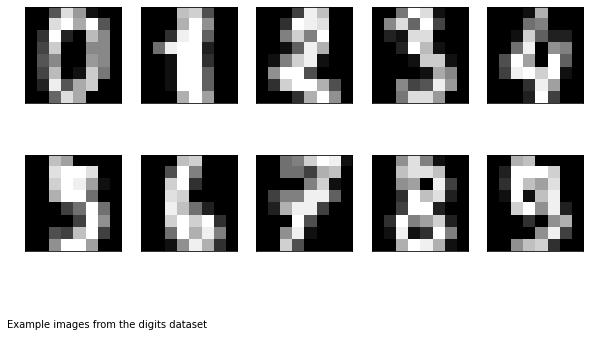

In [ ]:
from sklearn.datasets import load_digits

digits = load_digits() 

fig, axes = plt.subplots(2, 5, figsize=(10, 5),
                         subplot_kw={'xticks': (), 'yticks': ()})

for ax, img in zip(axes.ravel(), digits.images):
  ax.imshow(img, cmap='gray')

plt.figtext(0.1, -0.05, "Example images from the digits dataset")
plt.show()

Let's use PCA to visualize the data reduced to two dimensions. We plot the first two principal components, and color each dot by its class

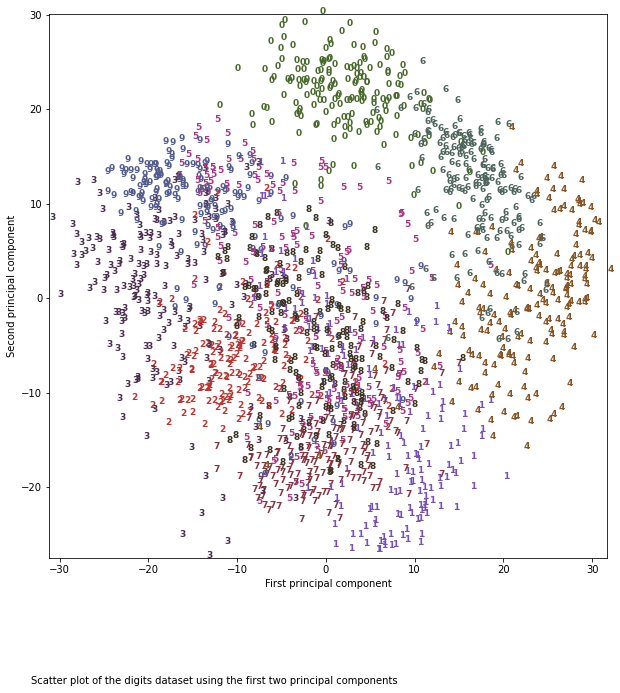

In [ ]:
# build a PCA model
pca = PCA(n_components=2)
pca.fit(digits.data)

# transform the digits data onto the first two principal components 
digits_pca = pca.transform(digits.data)
colors = ["#476A2A", "#7851B8", "#BD3430", "#4A2D4E", "#875525",
          "#A83683", "#4E655E", "#853541", "#3A3120", "#535D8E"]

plt.figure(figsize=(10, 10))
plt.xlim(digits_pca[:, 0].min(), digits_pca[:, 0].max())
plt.ylim(digits_pca[:, 1].min(), digits_pca[:, 1].max())

for i in range(len(digits.data)):
  # actually plot the digits as text instead of using scatter
  plt.text(digits_pca[i, 0], digits_pca[i, 1], str(digits.target[i]),
           color = colors[digits.target[i]],
           fontdict={'weight': 'bold', 'size': 9})
  
plt.xlabel("First principal component")
plt.ylabel("Second principal component")
plt.figtext(0.1, -0.05, "Scatter plot of the digits dataset using the first \
two principal components")

plt.show()

Here, we actually used the true digit classes as glyphs, to show which class is where. The digits zero, six, and four are relatively well separated using the first two principal components, though they still overlap. Most of the other digits overlap significantly.

Let's apply t-SNE to the same dataset, and compare the results. As t-SNE does not support transforming new data, the `TSNE` class has no `transform` method. Instead, we can call the `fit_transform` method, which will build the model and immediately return the transformed data

/usr/local/lib/python3.8/dist-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


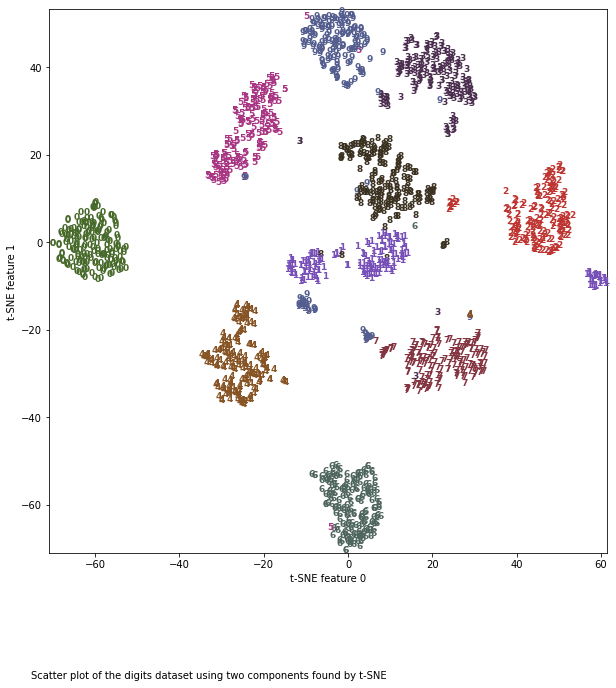

In [ ]:
from sklearn.manifold import TSNE

tsne = TSNE(random_state=42)

# use fit_transform instead of fit, as TSNE has no transform method
digits_tsne = tsne.fit_transform(digits.data)

plt.figure(figsize=(10, 10))
plt.xlim(digits_tsne[:, 0].min(), digits_tsne[:, 0].max() + 1)
plt.ylim(digits_tsne[:, 1].min(), digits_tsne[:, 1].max() + 1)

for i in range(len(digits.data)):
  # actually plot the digits as text instead of using scatter
  plt.text(digits_tsne[i, 0], digits_tsne[i, 1], str(digits.target[i]),
           color = colors[digits.target[i]],
           fontdict={'weight': 'bold', 'size': 9})
  
plt.xlabel("t-SNE feature 0")
plt.ylabel("t-SNE feature 1")
plt.figtext(0.1, -0.05, "Scatter plot of the digits dataset using two \
components found by t-SNE")

plt.show()

The result of t-SNE is quite remarkable. All the classes are quite clearly separated. The ones and nines are somewhat split up, but most of the classes form a single dense group. Keep in mind that this method has no knowledge of the class labels: it is completely unsupervised. Still, it can find a representation of the data in two dimensions that clearly separates the classes, based solely on how close points are in the original space.

The t-SNE algorithm has some tuning parameters, though it often works well with the default settings. You can try playing with `perplexity` and `early_exaggeration`, but hte effects are usually minor.

## **Clustering**

As we described earlier, clustering is the task of partitioning the dataset into groups, called clusters. The goal is to split up the data in such a way that points within a single cluster are very similar and points in different clusters are different. Similarly to classification algorithms, clustering algorithms assign (or predict) a number to each data point, indicating which cluster a particular point belongs to.



**k-Means Clustering**

k-means clustering is one of the simplest and most commonly used clustering algorithms. It tries to find cluster centers that are representative of certain regions of  the data. The algorithm alternates between two steps: assigning each data point to closest cluster center, and then setting each cluster center as the mean of the data points that are assigned to it. The algorithm is finished when the assignment of instances to clusters no longer changes. The following example illustrates the algorithm on a synthetic dataset:

Input data and three steps of the k-means algorithm


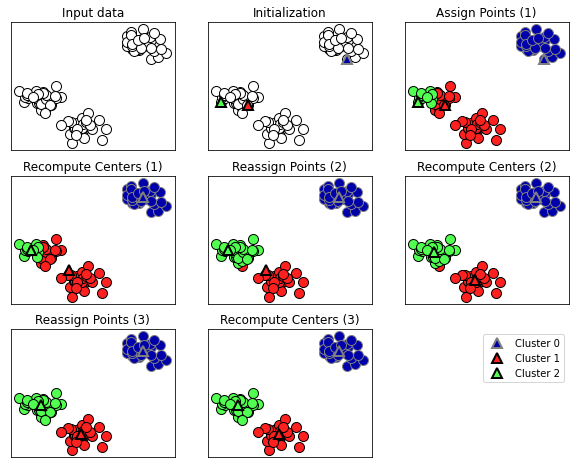

In [ ]:
mglearn.plots.plot_kmeans_algorithm()

print("Input data and three steps of the k-means algorithm")

Cluster centers are shown as triangles, while data points are shown as circles. Colors indicate cluster membership. We specified that we are looking for three clusters, so the algorithm was initialized by declaring three data points randomly as cluster centers (see "Initialization"). Then the iterative algorithm starts. First, each data point is assigned to the cluster center it is closet to (see "Assign Points (1)"). Next, the cluster centers are updated to be the mean of the assigned points (see "REcompute Centers (1)"). Then the process is repeated two more times. After the third iteration, the assignment of points to cluster centers remained unchanged, so the algorithm stops.

Given new data points, k-means will assign each to the closet cluster center. The next example shows the boundaries of the cluster center that were learned 

Cluster centers and cluster boundaries found by the k-means algorithm


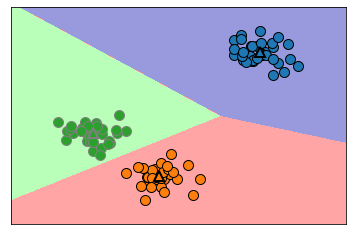

In [ ]:
mglearn.plots.plot_kmeans_boundaries()

print("Cluster centers and cluster boundaries found by the k-means algorithm")

Applying k-means with `scikit-learn` is quite straightforward. Here, we apply it to the synthetic data that we used for the preceding plots. We instantiate the `KMeans` class, and set the number of clusters we are looking for. Then we call the `fit` method with the data:

In [ ]:
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans 

# generate synthetic two-dimensional data
X, y = make_blobs(random_state=1)

# build the clustering model
kmeans = KMeans(n_clusters=3)
kmeans.fit(X)

KMeans(n_clusters=3)

During the algorithm, each training data point in X is assigned a cluster label. You can find these labels in the `kmeans.labels_` attribute:

In [ ]:
print("Cluster memberships:\n{}".format(kmeans.labels_))

Cluster memberships:
[1 0 0 0 2 2 2 0 1 1 0 0 2 1 2 2 2 1 0 0 2 0 2 1 0 2 2 1 1 2 1 1 2 1 0 2 0
 0 0 2 2 0 1 0 0 2 1 1 1 1 0 2 2 2 1 2 0 0 1 1 0 2 2 0 0 2 1 2 1 0 0 0 2 1
 1 0 2 2 1 0 1 0 0 2 1 1 1 1 0 1 2 1 1 0 0 2 2 1 2 1]


As we asked  for three clusters, the clusters are numbered 0 to 2.

You can also assign cluster labels to new points, using the `predict` method. Each new point is assigned to the closest cluster center when predicting, but the existing model is not changed. Running `predict` on the training set returns the same result as `labels_` :

In [ ]:
print(kmeans.predict(X))

[1 0 0 0 2 2 2 0 1 1 0 0 2 1 2 2 2 1 0 0 2 0 2 1 0 2 2 1 1 2 1 1 2 1 0 2 0
 0 0 2 2 0 1 0 0 2 1 1 1 1 0 2 2 2 1 2 0 0 1 1 0 2 2 0 0 2 1 2 1 0 0 0 2 1
 1 0 2 2 1 0 1 0 0 2 1 1 1 1 0 1 2 1 1 0 0 2 2 1 2 1]


You can see that clustering is somewhat to classification, in that each items gets a label. However, there is no ground truth, and consequently the labels themselves have no a priori meaning. Let's go back to the example of clustering face images that we discussed before. It might be that the cluster 3 found by the algorithm contains only faces of your friend Bela. You can only know that after you look at the pictures, though, and the number 3 is arbitrary. The only information the algorithm gives you is that all faces labeled as 3 are similar.

For the clustering we just computed on the two-dimensional toy dataset, that means that we should not assign any significance to the fact that one group was labeled 0 and another one was labeled 1. Running the algorithm again might result in a different numbering of clusters because of the random nature of the initialization.

Here is a plot of this data. The cluster centers are stored in the `cluster_centers_` attribute, and we plot them as triangles:

Cluster assignments and cluster centers found by k-means with tree clusters


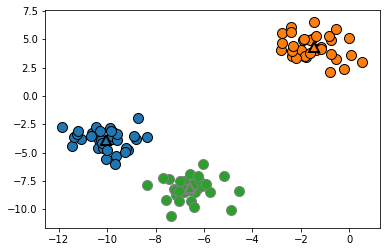

In [ ]:
mglearn.discrete_scatter(X[:, 0], X[:, 1], kmeans.labels_, markers='o')
mglearn.discrete_scatter(
    kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], [0, 1, 2],
    markers='^', markeredgewidth=2);

print("Cluster assignments and cluster centers found by k-means with tree clusters")

We can also use more or fewer cluster centers

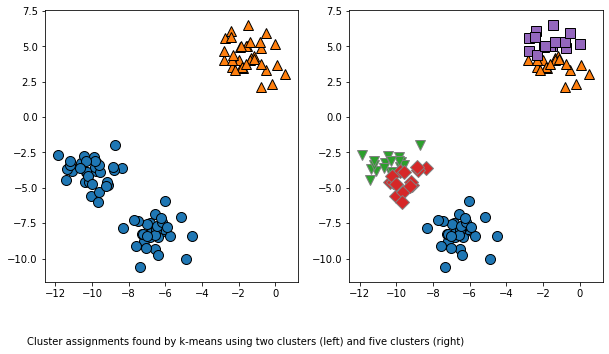

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# using two cluster centers:
kmeans = KMeans(n_clusters=2)
kmeans.fit(X)
assignments = kmeans.labels_

mglearn.discrete_scatter(X[:, 0], X[:, 1], assignments, ax=axes[0])

# using five cluster centers:
kmeans = KMeans(n_clusters=5)
kmeans.fit(X)
assignments = kmeans.labels_ 

mglearn.discrete_scatter(X[:, 0], X[:, 1], assignments, ax=axes[1])

plt.figtext(0.1, -0.05, "Cluster assignments found by k-means using \
two clusters (left) and five clusters (right)")
plt.show()

**Failure cases of k-means**

Even if you know the "right" number of clusters for a given dataset, k-means might not always be able to recover them. Each cluster is defined solely by its center, which means that each cluster is a convex shape. As a result of this k-means can only capture relatively simple shapes. k-means also assumes that all clusters have the same "diameter" in some sense; it always draws the boundary between clusters to be exactly in the middle between the cluster centers. That can sometimes lead to surprising results, as shown in The figure below:

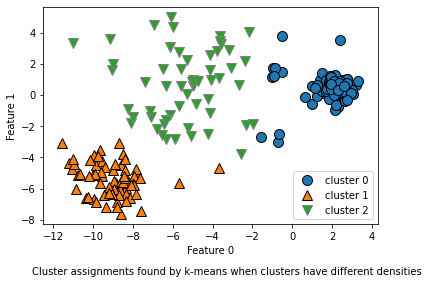

In [ ]:
X_varied, y_varied = make_blobs(n_samples=200,
                                cluster_std=[1.0, 2.5, 0.5],
                                random_state=170)

y_pred = KMeans(n_clusters=3, random_state=0).fit_predict(X_varied)

mglearn.discrete_scatter(X_varied[:, 0], X_varied[:, 1], y_pred)
plt.legend(["cluster 0", "cluster 1", "cluster 2"], loc='best')

plt.xlabel("Feature 0")
plt.ylabel("Feature 1")
plt.figtext(0.1, -0.05, "Cluster assignments found by k-means when clusters \
have different densities")

plt.show()

One might have expected the dense region in the lower left to be the first cluster, the dense region in the upper right to be the second, and the less dense region in the center to be the third. Instead, both cluster 0 and cluster 1 have some points that are far away from all the other points in these clusters that "reach" toward the center.

k-means also assumes that all directions are equally important for each cluster. The following plot shows a two-dimensional dataset where there are three clearly separated parts in the data. However, these groups are stretched toward the diagonal. As k-means only considers the distance to the nearest cluster center, it can't handle this kind of data:

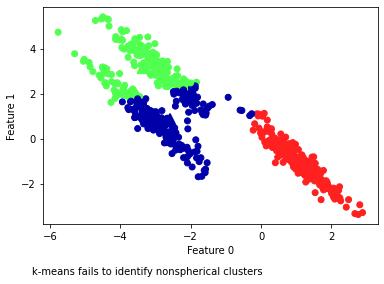

In [ ]:
# generate some random cluster data 
X, y = make_blobs(random_state=170, n_samples=600)
rng = np.random.RandomState(74)

# transform the data to be stretched
transformation = rng.normal(size=(2, 2))
X = np.dot(X, transformation)

# cluster the data into three clusters
kmeans = KMeans(n_clusters=3)
kmeans.fit(X)
y_pred = kmeans.predict(X)

# plot the cluster assignmetns and cluster centers
plt.scatter(X[:, 0], X[:, 1], c=y_pred, cmap=mglearn.cm3)
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1],
            marker='^', c=[0, 1, 2], s=100, linewidth=2, cmap=mglearn.cm3)

plt.xlabel("Feature 0")
plt.ylabel("Feature 1")
plt.figtext(0.1, -0.05, "k-means fails to identify nonspherical clusters")

plt.show()

k-means also performs poorly if the clusters have more complex shapes, like the `two_moons` data we encountered in Chapter 2

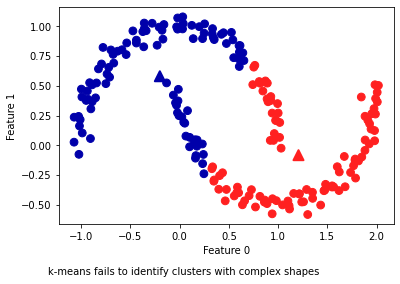

In [ ]:
# generate synthetic two_moons data (with less noise this time)
from sklearn.datasets import make_moons 

X, y = make_moons(n_samples=200, noise=0.05, random_state=0)

# cluster the data into two clusters
kmeans = KMeans(n_clusters=2)
kmeans.fit(X)
y_pred = kmeans.predict(X)

# plot the cluster assignments and cluster centers
plt.scatter(X[:, 0], X[:, 1], c=y_pred, cmap=mglearn.cm2, s=60)
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1],
            marker='^', c=[mglearn.cm2(0), mglearn.cm2(1)], s=100, linewidth=2)

plt.xlabel("Feature 0") 
plt.ylabel("Feature 1")
plt.figtext(0.1, -0.05, "k-means fails to identify clusters with complex shapes")

plt.show()

Here,  we would hope that the clustering algorithm can discover the two half-moon shapes. However, this is not possible using the k-means algorithm.

**Vector quantization, or seeing k-means as decomposition**

Even though k-means is a clustering algorithm, there are interesting parallels between k-means and the decomposition methods like PCA and NMF that we discussed earlier. You might remember that PCA tries to find directions of maximum variance in the data, while NMF tries to find additive components, which often correspond to "extremes" or "parts" of the data. Both methods tried to express the data points as a sum over some components. k-means, on the other hand, tries to represent each data point using a cluster center. You can think of that as each point being represented using only a single component, which is given by the cluster center. This view of k-means as a decomposition method, where each point is represented using a single component, is called vector quantization.

Let's do a side-by-side comparison of PCA, NMF, and k-means, showing the components extracted, as well as reconstructions of faces from the test set using 100 components. For k-means, the reconstruction is the closest cluster center found on the training set:

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_people,
                                                    y_people,
                                                    stratify=y_people,
                                                    random_state=0)

nmf = NMF(n_components=100, random_state=0)
nmf.fit(X_train)

pca = PCA(n_components=100, random_state=0)
pca.fit(X_train)

kmeans = KMeans(n_clusters=100, random_state=0)
kmeans.fit(X_train)

X_reconstructed_pca = pca.inverse_transform(pca.transform(X_test))
X_reconstructed_kmeans = kmeans.cluster_centers_[kmeans.predict(X_test)]
X_reconstructed_nmf = np.dot(nmf.transform(X_test), nmf.components_)

/usr/local/lib/python3.8/dist-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


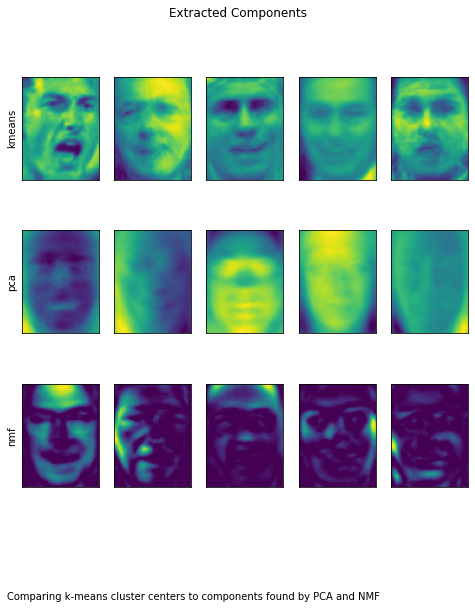

In [ ]:
fig, axes = plt.subplots(3, 5, figsize=(8, 8),
                         subplot_kw={'xticks': (), 'yticks': ()})

fig.suptitle("Extracted Components")
for ax, comp_kmeans, comp_pca, comp_nmf in zip(axes.T, kmeans.cluster_centers_,
                                               pca.components_, nmf.components_):
  ax[0].imshow(comp_kmeans.reshape(image_shape))
  ax[1].imshow(comp_pca.reshape(image_shape), cmap='viridis')
  ax[2].imshow(comp_nmf.reshape(image_shape))

axes[0, 0].set_ylabel("kmeans")
axes[1, 0].set_ylabel("pca")
axes[2, 0].set_ylabel("nmf")

plt.figtext(0.1, -0.05, "Comparing k-means cluster centers \
to components found by PCA and NMF")

plt.show()

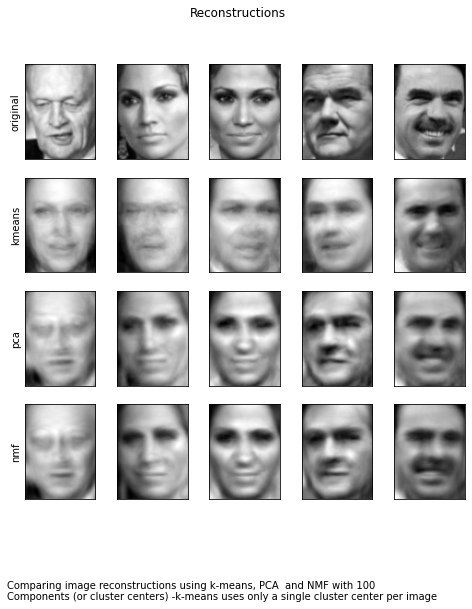

In [ ]:
fig, axes = plt.subplots(4, 5, subplot_kw={'xticks': (), 'yticks': ()},
                         figsize=(8, 8))

fig.suptitle("Reconstructions")
for ax, orig, rec_kmeans, rec_pca, rec_nmf in zip(
    axes.T, X_test, X_reconstructed_kmeans, X_reconstructed_pca,
    X_reconstructed_nmf):
  
  ax[0].imshow(orig.reshape(image_shape), cmap='gray')
  ax[1].imshow(rec_kmeans.reshape(image_shape), cmap='gray')
  ax[2].imshow(rec_pca.reshape(image_shape), cmap='gray')
  ax[3].imshow(rec_nmf.reshape(image_shape), cmap='gray')

axes[0, 0].set_ylabel("original")
axes[1, 0].set_ylabel("kmeans")
axes[2, 0].set_ylabel("pca")
axes[3, 0].set_ylabel("nmf")

plt.figtext(0.1, -0.05, "Comparing image reconstructions using k-means, PCA \
 and NMF with 100 \nComponents (or cluster centers) -k-means uses only \
a single cluster center per image")

plt.show()

An interesting aspect of vector quantization using k-means is that we can use many more clusters than input dimensions to encode our data. Let's go back to the `two_moons` data. Using PCA or NMF, there is nothing much we can do to this data, as it lives in only two dimensions. Reducing it to one dimension with PCA or NMF would completely destroy the structure of the data. But we can find a more expressive representation with k-means, by using more cluster centers. 

cluster memberships:
[9 2 5 4 2 7 9 6 9 6 1 0 2 6 1 9 3 0 3 1 7 6 8 6 8 5 2 7 5 8 9 8 6 5 3 7 0
 9 4 5 0 1 3 5 2 8 9 1 5 6 1 0 7 4 6 3 3 6 3 8 0 4 2 9 6 4 8 2 8 4 0 4 0 5
 6 4 5 9 3 0 7 8 0 7 5 8 9 8 0 7 3 9 7 1 7 2 2 0 4 5 6 7 8 9 4 5 4 1 2 3 1
 8 8 4 9 2 3 7 0 9 9 1 5 8 5 1 9 5 6 7 9 1 4 0 6 2 6 4 7 9 5 5 3 8 1 9 5 6
 3 5 0 2 9 3 0 8 6 0 3 3 5 6 3 2 0 2 3 0 2 6 3 4 4 1 5 6 7 1 1 3 2 4 7 2 7
 3 8 6 4 1 4 3 9 9 5 1 7 5 8 2]


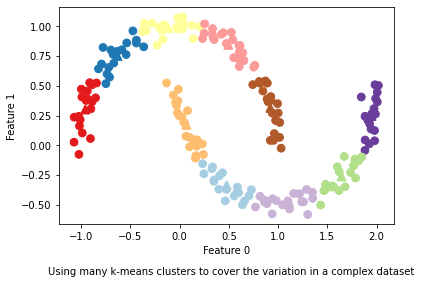

In [ ]:
X, y = make_moons(n_samples=200, noise=0.05, random_state=0)

kmeans = KMeans(n_clusters=10, random_state=0)
kmeans.fit(X)
y_pred = kmeans.predict(X)

plt.scatter(X[:, 0], X[:, 1], c=y_pred, s=60, cmap='Paired')
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s=60,
            marker='^', c=range(kmeans.n_clusters), linewidth=2, cmap='Paired')

plt.xlabel("Feature 0")
plt.ylabel("Feature 1")
plt.figtext(0.1, -0.05, "Using many k-means clusters to cover \
the variation in a complex dataset")

print("cluster memberships:\n{}".format(y_pred))

plt.show()

We used 10 cluster centers, which means each point is now assigned a number between 0 and 9. We can see this as the data being represented using 10 components (that is, we have 10 new features), with all features being 0, apart from the one that represents the cluster center the point is assigned to. Using this 10-dimensional representation, it would now be possible to separate the two half-moon shapes using a linear model, which would not have been possible using the original two features. It is also possible to get an even more expressive representation of the data by using the distances to each of the cluster centers as features. This can be accomplished using the `transform` method of `kmeans`: 

In [ ]:
distance_features = kmeans.transform(X)
print("Distance feature shape: {}".format(distance_features.shape))
print("Distance feature shape:\n{}".format(distance_features))

Distance feature shape: (200, 10)
Distance feature shape:
[[0.9220768  1.46553151 1.13956805 ... 1.16559918 1.03852189 0.23340263]
 [1.14159679 2.51721597 0.1199124  ... 0.70700803 2.20414144 0.98271691]
 [0.78786246 0.77354687 1.74914157 ... 1.97061341 0.71561277 0.94399739]
 ...
 [0.44639122 1.10631579 1.48991975 ... 1.79125448 1.03195812 0.81205971]
 [1.38951924 0.79790385 1.98056306 ... 1.97788956 0.23892095 1.05774337]
 [1.14920754 2.4536383  0.04506731 ... 0.57163262 2.11331394 0.88166689]]


k-means is a very popular algorithm for clustering, not only because it is relatively easy to understand and implement, but also because it runs relatively quickly. k-means scales easily to large datasets, and `scikit-learn` even includes a more scalable variant in the `MiniBatchKMeans` class, which can handle very large datasets. 

One of the drawbacks of k-means is that it relies on a random initialization, which means the outcome of the algorithm depends on a randm seed. By default, `scikit-learn` runs the algorithm 10 times with 10 different random initializations, and returns the best result. Further downside of k-means are the relatively restrictive assumptions made on the shape of clusters, and the requirement to specify the number of clusters you are looking for (which might not be known in a real-world application).

Next, we will look at two more clustering algorithms that improve upon these properties in some ways.

**Agglomerative Clustering**

**Agglomerative clustering** refers to a collection of clustering algorithms that all build upon the same principles: the algorithm starts by **declaring each point its own cluster**, and then merges the two most similar clusters until some stopping criterion is satisfied. The stopping criterion implemented in `scikit-learn` is the number of clusters, so similar clusters are merged until only the specified number of clusters are left. There are several linkage critegia that specify how exactly the "most similar cluster" is measured. This measure is always defined between two existing clusters.

The following three choices are implemented in `scikit-learn`:

`ward`
* the deault choice, `ward` picks the two clusters to merge such tha the variance within all clusters increases that least. This often leads to clusters that are relatively equally sized.

`average`
* `average` linkage merges the two clusters that have the smallest average distance between all their points.

`complete`
* `complete` linkage (also known as maximum linkage) merges the two clusters that have the smallest maximum distance between their points.

`ward` works on most datasets, and we will use it in our examples. If  the clusters have very dissimilar numbers of members (if one is much bigger than all the others, for example), `average` or `complete` might work better.

The following plot illustrates the progression of agglomerative clustering on a two-dimensional dataset, looking for three clusters:

Agglomerative clustering iteratively joins the two closet clusters


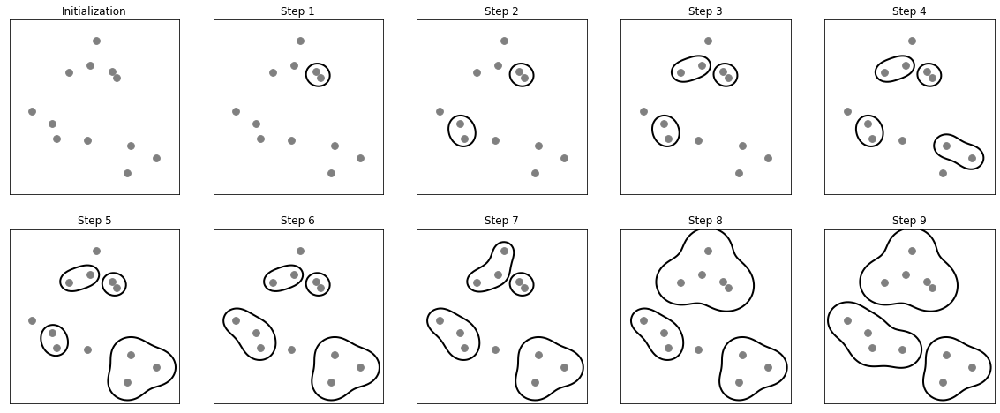

In [ ]:
mglearn.plots.plot_agglomerative_algorithm()

print("Agglomerative clustering iteratively joins the two closet clusters")

Initially, each point is its own cluster. Then, in each step, the two clusters that are **closest are mearged** In the first four steps, two single-point clusters are picked and these are joined into two-point clusters. In step 5, one of the two-point clusters is extended to a third point, and so on. In step 9, there are only three clusters remaining. As we specified that we are looking for three clusters, the algorithm then stops.

Let's have a look at how agglomerative clustering performs on the simple three-cluster data we used here. Because of the way the algorithm works, agglomerative clustering cannot make predictions for new data points. Therefore, `AggomerativeClustering` has no `predict` method. To build the model and get the cluster memberships on the training set, use the `fit_predict` method instead. The result is shown in The figure below.

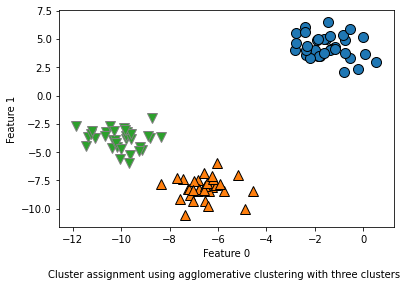

In [ ]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.datasets import make_blobs

X, y = make_blobs(random_state=1)

agg = AgglomerativeClustering(n_clusters=3)
assignment = agg.fit_predict(X)

mglearn.discrete_scatter(X[:, 0], X[:, 1], assignment)

plt.xlabel("Feature 0")
plt.ylabel("Feature 1")
plt.figtext(0.1, -0.05, "Cluster assignment using agglomerative clustering \
with three clusters")

plt.show()

As expected, the algorithm recovers the clustering perfectly. While the `scikit-learn` implementation of agglomerative clustering requires you to specify the number of clusters you want the algorithm to find, agglomerative clustering methods provide some help with choosing the right number, which we will discuss next. 

**Hierarchical clustering and dendrograms**

Agglomerative clustering produces what is known as a hierarchical clustering. The clustering proceeds iteratively, and every point makes a journey from being a single point cluster to belonging to some final cluster. Each intermediate step provides a clustering of the data (with a different number of clusters). It is sometimes helpful to look at all possible clusterings jointly. The next example shows an overlay of all the possible clusterings, providing some insight into how each cluster breaks up into smaller clusters:


Hierarchical cluster assignment (shown as lines) generated
with agglomerative clustering, with numbered data points


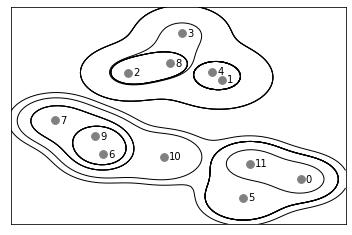

In [ ]:
mglearn.plots.plot_agglomerative()

print("Hierarchical cluster assignment (shown as lines) generated\n\
with agglomerative clustering, with numbered data points")

While this visualization provides a very detailed view of the hierarchical clustering, it relies on the two-dimensional nature of the data and therefore cannot be used on datasets that have more than two features. There is, however, another tool to visualize hierarchical clustering, called a dendrogram, that can handle multidimensional datasets.

Unfortunately, `scikit-learn` currently doe not have the functionality to draw dendrograms. However, you can generate them easily using Scipy. The SciPy clustering algorithms have a slightly different interface to the `scikit-learn` clustering algorithms. SciPy provides a function that takes a data array X and computes a linkage array, which encodes hierarchical cluster similarities. We can then feed this linkage array into the scipy `dendrogram` function to plot the dendrogram.

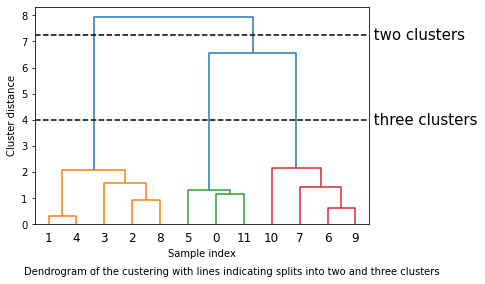

In [ ]:
# import the dendrogram function and the word clustering function from SciPy
from scipy.cluster.hierarchy import dendrogram, ward

X, y = make_blobs(random_state=0, n_samples=12)
# Apply the ward clustering to the data array X
# The SciPy ward function returns on array that specifies the distances
# bridged when performing agglomerative clustering
linkage_array = ward(X)
# Now we plot the dendrogram for  the linkage_array containing the distances
# between clusters
dendrogram(linkage_array)

# Mark the cuts in the tree that signify two or three clusters
ax = plt.gca()
bounds = ax.get_xbound()

ax.plot(bounds, [7.25, 7.25], '--', c='k')
ax.plot(bounds, [4, 4], '--', c='k')

ax.text(bounds[1], 7.25, ' two clusters', va='center', fontdict={'size': 15})
ax.text(bounds[1], 4, ' three clusters', va='center', fontdict={'size': 15})

plt.xlabel("Sample index")
plt.ylabel("Cluster distance")
plt.figtext(0.1, -0.05, "Dendrogram of the custering with lines indicating\
 splits into two and three clusters")

plt.show()

The dendrogram shows data points as points on the bottom (numbered from 0 to 11). Then, a tree is plotted wiht these points (representing single-point clusters) as the leaves, and a new node parent is added for each two clusters that are joined.

Reading from bottom to top, the data points 1 and 4 are joined first. Next points 6 and 9 are joined into a cluster, and so on. At the top level, there are two branches, one consisting of points 11, 0, 5 10, 7, 6 and 9, and the other consisting of points 1, 4, 3, 2, and 8. These correspond to the two largest clusters in the lefthand side of the plot.

The y-axis in the dendrogram doesn't just specify when in the agglomerative algorithm two clusters get merged. The length of each branch also shows hwo far apart the merged clusters are. The longest branches in this dendrogram are the three lines that are marked by the dashed line labeled "three clusters." That these are the longest branches indicates that going from three to two clusters meant merging some very far-apart points. We see this again at the top of the chart, where merging the two remaining clusters into a single cluster again bridges a relatively large distance.

Unfortunately, agglomerative clustering still fails at separating complex shapes like the `two_moons` dataset. But the same is not true for the next algorithm we will look at, DBSCAN 

**DBSCAN**

Another very useful clustering algorithm is DBSCAN (which stands for "density-based spatial clustring of applications with noise"). The main benerits of DBSCAN are that it does not require the user to set the number of clusters a priori, it can capture clusters of complex shapes, and it can identify points that are not part of any cluster. DBSCAN is somewhat slower than agglomerative clustering and k-means, but still scales to relatively large datasets.

DBSCAN works by idenfitying points that are in "crowded" regions of the feature space, where many data points are close together. These regions are referred to as dense regions in feature space. The idea behind DBSCAN is that clusters form dense regions of data, separated by regions that are relatively empty.

Points that are within a dense region are called core samples (or core points), and they are defined as follows. These are two parameters in DBSCAN: `min_sample` and `eps`. If there are at least `min_samples` many data points within a distance of `eps` to a given data point, that data point is classified as a core sample. Core samples that are closer to each other than the distance `esp` are put into the same cluster by DBSCAN. 

The algorithm works by picking an arbitrary point to start with. It then finds all points with distance `eps` or less from that point. If there are less than `min_samples` points within distance `eps` of the starting point, this point is labeled as noise, meaning that it doesn't belong to any cluster. If there are more than `min_samples` points within a distance of `eps`, the point is labeled a core sample and assigned a new cluster label. Then, all neighbors (with `eps`) of the point are visited. If they have not been assigned a cluster yet, they are assigned the new cluster label that was just created. If they are core samples, their neighbors are visited in turn, and so on. The cluster grows until there are no more core samples within distance `eps` of the cluster. Then another point that hasn't yet been visited is picked, and the same procedure is repreated.

In the end, there are three kinds of points: core points, points that are within distance `eps` of core points (called boundary points), and noise. When the DBSCAN algorithm is run on a particular dataset multiple times, the clustering of the core points is always the same, and the same points will always be labeled as noise. However, a boundary point might be neighbor to core samples of more than one cluster. Therefore, the cluster membership of boundary points depends on the order in which points are visited. Usually there are only few boundary points, and this slight dependence on the order of points is not important.

Let's apply DBSCAN on the synthetic dataset we used to demonstrate agglomerative clustering. Like agglomerative clustering, DBSCAN does not allow predictions on new test data, so we will use the `fit_predict` method to perform clustering and return the cluster labels in one step:

In [ ]:
from sklearn.cluster import DBSCAN 

X, y = make_blobs(random_state=0, n_samples=12)

dbscan = DBSCAN()
clusters = dbscan.fit_predict(X)

print("Cluster memberships:\n{}".format(clusters))

Cluster memberships:
[-1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1]


As you can see, all data points were assigned the label -1 which stnads for noise. This is a consequence of the default parameter settings for `eps` and `min_samples`, which are not tuned for small toy datasets. The cluster assignments for different values of `min_samples` and `eps` are shown below 

min_samples: 2 eps: 1.000000  cluster: [-1  0  0 -1  0 -1  1  1  0  1 -1 -1]
min_samples: 2 eps: 1.500000  cluster: [0 1 1 1 1 0 2 2 1 2 2 0]
min_samples: 2 eps: 2.000000  cluster: [0 1 1 1 1 0 0 0 1 0 0 0]
min_samples: 2 eps: 3.000000  cluster: [0 0 0 0 0 0 0 0 0 0 0 0]
min_samples: 3 eps: 1.000000  cluster: [-1  0  0 -1  0 -1  1  1  0  1 -1 -1]
min_samples: 3 eps: 1.500000  cluster: [0 1 1 1 1 0 2 2 1 2 2 0]
min_samples: 3 eps: 2.000000  cluster: [0 1 1 1 1 0 0 0 1 0 0 0]
min_samples: 3 eps: 3.000000  cluster: [0 0 0 0 0 0 0 0 0 0 0 0]
min_samples: 5 eps: 1.000000  cluster: [-1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1]
min_samples: 5 eps: 1.500000  cluster: [-1  0  0  0  0 -1 -1 -1  0 -1 -1 -1]
min_samples: 5 eps: 2.000000  cluster: [-1  0  0  0  0 -1 -1 -1  0 -1 -1 -1]
min_samples: 5 eps: 3.000000  cluster: [0 0 0 0 0 0 0 0 0 0 0 0]
Cluster assignments found by DBSCAN with varying 
setting for the min_samples and eps parameters


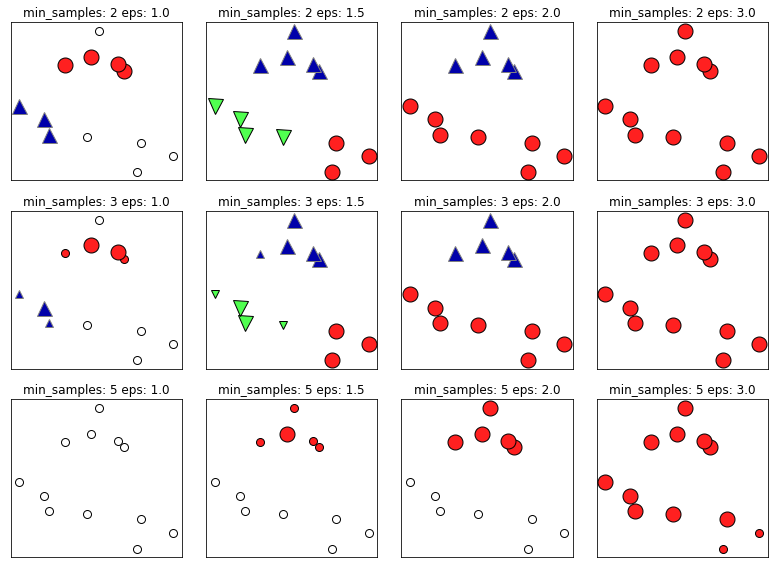

In [ ]:
mglearn.plots.plot_dbscan()

print("Cluster assignments found by DBSCAN with varying \n\
setting for the min_samples and eps parameters")

In this plot, points that belong to clusters are solid, while the noise points are shown in white. Core samples are shown as large markers, while boundary points are displayed as smaller markers. Increasing `eps` (going from left to right in the figure) means that more points will be included in a cluster. This makes clusters grow, but might also lead to multiple clusters joining into one. Increasing `min_sample` (going from top to bottom in the figure) means that fewer points will be core points, and more points will be labeled as noise.

The parameter `eps` is somewhat more important, as it determines what it means for points to be "close." Setting `eps` to be very small will mean that no points are core samples, and may lead to all points being labeled as noise. Setting `eps` to be very large will result in all points forming a  single cluster. 

The `min_samles` setting mostly determines whether points in less dense regions wll be labeled as outliers or as their own clusters. If you decrease `min_samples`, anything tha would have been a cluster with less than `min_samples` may samples will now be labeled as noise. `min_samples` therefore determines the minimum cluster size. When going from `min_sample=3` to `min_samples=5` with `eps=1.5`. With `min_samples=3`, there are three clusters: one of four points, one of five points, and one of three points. Using `min_samples=5`, the two smaller clusters (with three and four points) are now labeled as noise, and only the cluster with five samples remains.

While DBSCAN doesn't require setting the number of clusters explicitly, setting `esp` implicitly controls how many clusters will be found. Finding a good setting for `esp` is sometimes easier after scaling the data using `StandardScaler` or `MinMaxScaler`, as using these scaling techniques will ensure that all features have similar ranges.


The Figure below shows the result of running DBSCAN on the `two_moons` datasets. The algorithm actually finds the two half-circles and separates them using the default settings: 

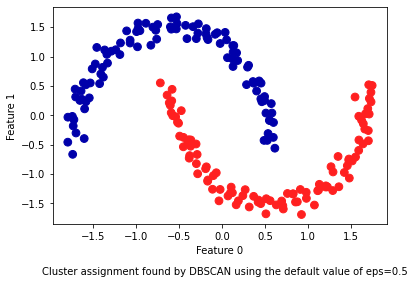

In [ ]:
from sklearn.datasets import make_moons
from sklearn.preprocessing import StandardScaler

X, y = make_moons(n_samples=200, noise=0.05, random_state=0)

# rescale the data to zero mean and unit variance
scaler = StandardScaler() 
scaler.fit(X)
X_scaled = scaler.transform(X)

dbscan = DBSCAN()
clusters = dbscan.fit_predict(X_scaled)

# plot the cluster assignments
plt.scatter(X_scaled[:, 0], X_scaled[:, 1], c=clusters, cmap=mglearn.cm2, s=60)
plt.xlabel("Feature 0")
plt.ylabel("Feature 1")
plt.figtext(0.1, -0.05, "Cluster assignment found by DBSCAN using \
the default value of eps=0.5")

plt.show()

As the algorithm produced the desired number of clusters (two), the parameter settings seem to work well. If we decrease `eps` to 0.2 (from the default of 0.5), we will get eight clusters, which is clearly too many. Increasing `eps` to 0.7 results in a single cluster.

When using DBSCAN, you need to be careful about handling the returned cluster assignments. The use of -1 to indicate noise might result in unexpected effects when using the cluster labels to index another array.

**Comparing and Evaluating Clustering Algorithms**

One of the challenges in applying clustsering algorithms is that it is very hard to assess how well an algorithm worked, and to compare outcomes between different algorithms. After talking about the algorithms behind k-means, agglomerative clustering, and DBSCAN, we will now compare them on some real-word datasets.



**Evaluating clustering with ground truth**

There are metrics that can be used to assess the outcome of a clustering algorithm relative to a ground truth clustering, the most important ones being the **adjusted rand index (ARI)** and **normalized mutual information (NMI)**, which both provide a quantitative measure between 0 and 1.

Here, we compare the k-means, agglomerative clustering, and  DBSCAN algorithms using ARI. We also include what it looks like when we randomly assign points to two clusters for comparison:

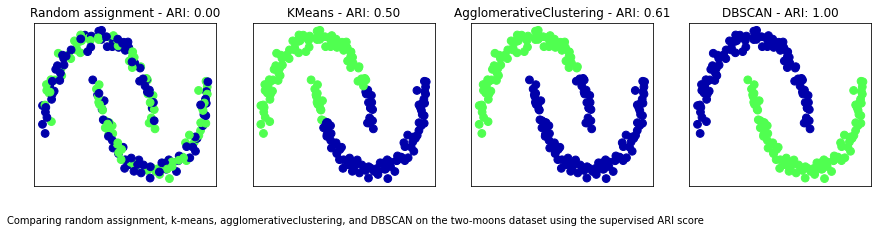

In [ ]:
from sklearn.metrics.cluster import adjusted_rand_score
from sklearn.cluster import DBSCAN

X, y = make_moons(n_samples=200, noise=0.05, random_state=0)

# rescale the data to zero mean and unit variance
scaler = StandardScaler()
scaler.fit(X)
X_scaled = scaler.transform(X)

fig, axes = plt.subplots(1, 4, figsize=(15, 3),
                         subplot_kw={'xticks': (), 'yticks': ()})

# make a list of algorithms to use
algorithms = [KMeans(n_clusters=2), AgglomerativeClustering(n_clusters=2),
              DBSCAN()]

# create a random cluster assignment for reference
random_state = np.random.RandomState(seed=0)
random_clusters = random_state.randint(low=0, high=2, size=len(X))

# plot random assignment
axes[0].scatter(X_scaled[:, 0], X_scaled[:, 1], c=random_clusters,
                cmap=mglearn.cm3, s=60)
axes[0].set_title("Random assignment - ARI: {:.2f}".format(
    adjusted_rand_score(y, random_clusters)))

for ax, algorithm in zip(axes[1:], algorithms):
  # plot the cluster assignments and cluster centers
  clusters = algorithm.fit_predict(X_scaled)
  ax.scatter(X_scaled[:, 0], X_scaled[:, 1], c=clusters,
             cmap=mglearn.cm3, s=60)
  ax.set_title("{} - ARI: {:.2f}".format(algorithm.__class__.__name__,
                                         adjusted_rand_score(y, clusters)))
  
plt.figtext(0.1, -0.05, "Comparing random assignment, k-means, agglomerative\
clustering, and DBSCAN on the two-moons dataset using the supervised ARI score")
plt.show()

The adjusted rand index provides intuitive results, with a random cluster assignment having a score of 0 and DBSCAN (which recovers the desired clustering perfectly) having a score of 1.

A common mistake when evaluating clustering in this way is to use `accuracy_score` instead of `adjusted_rand_score`, `normalized_mutual_info_score`, or some other clustering metric. The problem is using accuracy is that it requires the assigned cluster labels to exactly match the ground truth. However, the cluster labels themselves are meaningless -the only thing that matters is which points are in the same cluster: 

In [ ]:
from sklearn.metrics import accuracy_score

# these two labelings of points correspond to the same clustering
cluster1 = [0, 0, 1, 1, 0]
cluster2 = [1, 1, 0, 0, 1]

# accuracy is zero, as none of the labels are the same
print("Accuracy: {:.2f}".format(accuracy_score(cluster1, cluster2)))
# adjusted rand score is 1, as the clustering is exactly the same
print("ARI: {:.2f}".format(adjusted_rand_score(cluster1, cluster2)))

Accuracy: 0.00
ARI: 1.00


**Evaluating clustering without ground truth**

Although we have just shown one way to evaluate clustering algorithms, in practice, there is a big problem with using measure like ARI. When applying clustering algorithms, there is usually no ground truth to which to compare the results. If we knew the right clustering of the data, we could use this information to build a supervised model like a classifier. Therefore, using metrics like ARI and NMI usually only helps in developing algorithms, not in assessing success in an application.

There are scoring metrics for clustering that don't require ground truth, like the silhouette coefficient. However, these often don't work well in practice. The silhouette score computes the compactness of a cluster, where higher is better, with a perfect score of 1. While compact clusters are good, compactness doesn't allow for complex shapes.

Here is an example comparing the outcome of the k-means, agglomerative clustering, and DBSCAN on the `two-moons` dataset using the silhouette score: 

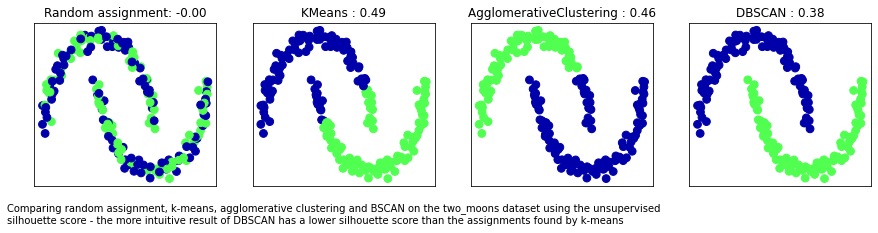

In [ ]:
from sklearn.metrics.cluster import silhouette_score
from sklearn.preprocessing import StandardScaler

X, y = make_moons(n_samples=200, noise=0.05, random_state=0)

# rescale the data to zero mean and unit variance
scaler = StandardScaler()
scaler.fit(X)
X_scaled = scaler.transform(X)

fig, axes = plt.subplots(1, 4, figsize=(15, 3),
                         subplot_kw={'xticks': (), 'yticks': ()})

# create a random cluster assignment for reference
random_state = np.random.RandomState(seed=0)
random_clusters = random_state.randint(low=0, high=2, size=len(X))

# plt random assignment
axes[0].scatter(X_scaled[:, 0], X_scaled[:, 1], c=random_clusters,
                cmap=mglearn.cm3, s=60)
axes[0].set_title("Random assignment: {:.2f}".format(
    silhouette_score(X_scaled, random_clusters)))

algorithms = [KMeans(n_clusters=2), AgglomerativeClustering(n_clusters=2),
              DBSCAN()]

for ax, algorithm in zip(axes[1:], algorithms):
  clusters = algorithm.fit_predict(X_scaled)
  # plot the cluster assignments and cluster centers
  ax.scatter(X_scaled[:, 0], X_scaled[:, 1], c=clusters, cmap=mglearn.cm3,
             s=60)
  ax.set_title("{} : {:.2f}".format(algorithm.__class__.__name__,
                                    silhouette_score(X_scaled, clusters)))

plt.figtext(0.1, -0.05, "Comparing random assignment, k-means, agglomerative \
clustering and BSCAN on the two_moons dataset using the unsupervised \
\nsilhouette score - the more intuitive result of DBSCAN has a lower silhouette \
score than the assignments found by k-means")
plt.show()

As you can see, k-means gets the highest silhouette score, even though we might prefer the result produced by DBSCAN. A slightly better strategy for evaluating clusters is using robustness-based clustering metrics. These run an algorithm after adding some noise to the data, or using different parameter settings, and compare the outcomes. The idea is that if many algorithm parameters and many perturbations of the data return the same result, it is likely to be trustworthy. Unfortunately, this strategy is not implemented in `scikit-learn` at the time of writing. 

Even if we get a very robust clustering, or a vey high silhouette score, we still don't know if there is any semantic meaning in the clustering, or whether the clustering reflects an aspect of the data that we are interested in. Let's go back to example of face images. We hope to find groups of similar faces -say, men and woman, or old people and young people, or people with beard and without. Let's say we cluster the data into two clusters, and all algorithms agree about which points should be clustered together. We still don't know if the clusters that are found correspond in any way to the concepts we are interested in. It could be that they found side views versus front views, or pictures taken at night versus pictures taken during the day, or pictures taken with iPhones versus pictures taken with Android phones. The only way to know whether the clustering corresponds to anything we are interested in is to analyze the clusters manually.

**Comparing algorithms on the faces dataset**

Let's apply the k-means, DBSCAN, and agglomerative clustering algorithms to the Labeled Faces in the Wild dataset, and see if any of them find interesting structure. We will use the eigenface representation of the data, as produced by `PCA(whiten=True)`, with 100 components:

In [ ]:
# extract eigenfaces from lfw data and transform data
from sklearn.decomposition import PCA 

pca = PCA(n_components=100, whiten=True, random_state=0)
pca.fit_transform(X_people)
X_pca = pca.transform(X_people)

We saw earlier that this is a more semantic representation of the face images that the raw pixels. It will also make computation faster. A good exercise would be for you to run the following experiments on the original data, without PCA, and see if you find similar clusters.

**Analyzing the faces dataset with DBSCAN**

We will start by applying DBSCAN, which we just discussed:

In [ ]:
# apply DBSCAN with default parameters
dbscan = DBSCAN() 
labels = dbscan.fit_predict(X_pca)
print("Unique labels: {}".format(np.unique(labels)))

Unique labels: [-1]


We see that all the returned labels are -1, so all of the data was labeled as "noise" by DBSCAN. There are two things we can change to help this: we can make `eps` higher, to expand the neighborhood of each point, and set `min_samples` lower, to consider smaller groups of points as clusters. Let's try changing `min_samples` first:

In [ ]:
dbscan = DBSCAN(min_samples=3)
labels = dbscan.fit_predict(X_pca)
print("Unique labels: {}".format(np.unique(labels)))

Unique labels: [-1]


Even when considering groups of three points, everything is labeled as noise. So, we need to increase `eps`:

In [ ]:
dbscan = DBSCAN(min_samples=3, eps=15)
labels = dbscan.fit_predict(X_pca)
print("Unique labels: {}".format(np.unique(labels)))

Unique labels: [-1  0]


Using a much larger `eps` of 15, we get only a single cluster and noise points. We can use this result to find out what the "noise" looks like compared to the rest of the data. To understand better what's happening, let's look at how many points are noise, and how many points are inside the cluster:

In [ ]:
# Count number of points in all clusters and noise.
# bincount doesn't allow negative numbers. So we need to add 1.
# The first number in the result corresponds to noise points.
print("Number of points per cluster: {}".format(np.bincount(labels + 1)))

Number of points per cluster: [  32 2031]


There are very few noise points -only 32 -so we can look at all of them.

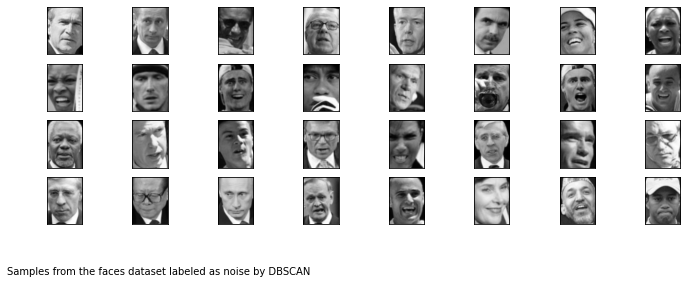

In [ ]:
noise = X_people[labels==-1]

fig, axes = plt.subplots(4, 8, subplot_kw={'xticks': (), 'yticks': ()},
                         figsize=(12, 4))

for image, ax in zip(noise, axes.ravel()):
  ax.imshow(image.reshape(image_shape), vmin=0, vmax=1, cmap='gray')

plt.figtext(0.1, -0.05, "Samples from the faces dataset labeled as noise by\
 DBSCAN")

plt.show()

We can guess why they were labeled as noise: the 6th image in the second row shows a person drinking from a glass, there are images of people wearing hats, and in some image there's a hand in front of  the person's face. The other images contain odd angles or crops that are too close or too wide.

This kind of analysis - trying to find "the odd one out" -is called outlier detection. If this was a real application, we might try to do a better job of cropping images, to get more homogeneous data. There is little we can do about people in photos sometimes wering hats, drinkng, or holding something in front of their faces, but it's good to know that these are issues in the data that any algorithm we might apply needs to handle.

If we want to find more interesting clusters than just one large one, we need to set `eps` smaller, somewhere between 15 and 0.5 (the default). Let's have a look at what different values of `eps` result in:

In [ ]:
for eps in [1, 3, 5, 7, 11, 13]:
  print("\neps={}".format(eps))
  dbscan = DBSCAN(eps=eps, min_samples=3)
  labels = dbscan.fit_predict(X_pca)
  print("Cluster present: {}".format(np.unique(labels)))
  print("Cluster sizes: {}".format(np.bincount(labels + 1)))


eps=1
Cluster present: [-1]
Cluster sizes: [2063]

eps=3
Cluster present: [-1]
Cluster sizes: [2063]

eps=5
Cluster present: [-1]
Cluster sizes: [2063]

eps=7
Cluster present: [-1  0  1  2  3  4  5  6  7  8  9 10 11 12]
Cluster sizes: [2004    3   14    7    4    3    3    4    4    3    3    5    3    3]

eps=11
Cluster present: [-1  0]
Cluster sizes: [ 413 1650]

eps=13
Cluster present: [-1  0]
Cluster sizes: [ 120 1943]


For low settings of `eps`, all points are labeled as noise. For `eps=7`, we get many nose points and many smaller clusters. For `eps=9` we still get many noise points, but we get one big cluster and some smaller clusters. Starting from `eps=11`, we get only one large cluster and noise.

What is interesting to note is that there is never more than one large cluster. At most, there is one large cluster containing most of the points, and some smaller clusters. The indicates that there are not two or three different kinds of face images in the data that are very distinct, but rather than all images are more or less equally similar to (or dissimilar from) the rest.

The results for `eps=7` look most interesting, with many small clusters. We can investigate this clustering in more detail by visualizing all of the points in each of the 13 small clusters`

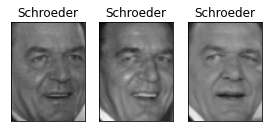

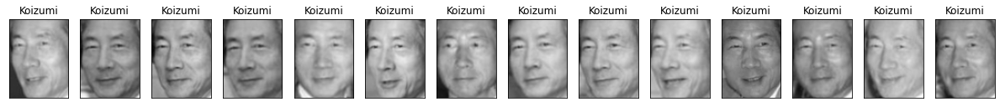

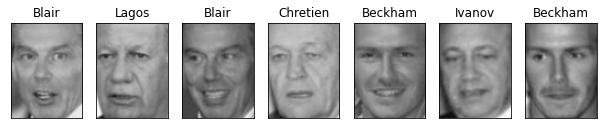

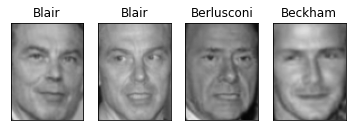

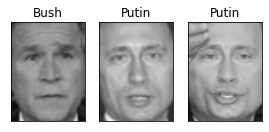

...

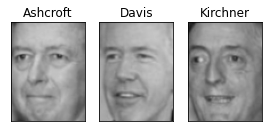

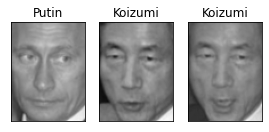

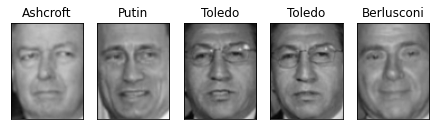

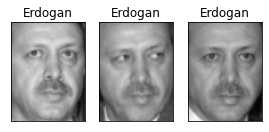

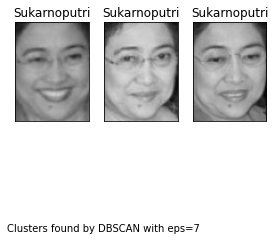

In [ ]:
dbscan = DBSCAN(min_samples=3, eps=7)
labels = dbscan.fit_predict(X_pca)

for cluster in range(max(labels) + 1):
  mask = labels == cluster
  n_images = np.sum(mask)
  fig, axes = plt.subplots(1, n_images, figsize=(n_images * 1.5, 4),
                           subplot_kw={'xticks': (), 'yticks': ()})
  
  for image, label, ax in zip(X_people[mask], y_people[mask], axes):

    ax.imshow(image.reshape(image_shape), vmin=0, vmax=1, cmap='gray')
    ax.set_title(people.target_names[label].split()[-1])

plt.figtext(0.1, -0.05, "Clusters found by DBSCAN with eps=7")
plt.show()

Some of the clusters correspond to people with very distinct faces (within this dataset), such as Sharon or Koizumi. Within each cluster, the orientation of the face is also quite fixed, as well as the facial expression. Some of the clusters contain faces of multiple people, but they share a similar orientation and expression. 

This concludes our analysis of the DBSCAN algorithm applied to the faces dataset. As you can see, we are doing a manual analysis here, different from the much more automatic search approach we could use for supervised learning based on R<sup>2</sup> score or accuracy.

Let's move on to applying k-means and agglomerative clustering.

**Analyzing the face dataset with k-means**

We saw that it was not possible to create more than one big cluster using DBSCAN. Agglomerative clustering and k-means are much more likely to create clusters of even size, but we do need to set a target number of clusters. We could set the number of clusters to the known number of people in the dataset, though it is very unlikely that an unsupervised clustering algorithm will recover them. Instead, we can start with a low number of clusters, like 10, which might allow us to analyze each of the clusters:


In [ ]:
# extract clusters with k-means
km = KMeans(n_clusters=10, random_state=0)
labels_km = km.fit_predict(X_pca)
print("Cluster sizes k-means: {}".format(np.bincount(labels_km)))

Cluster sizes k-means: [155 175 238  75 358 257  91 219 323 172]


As you can see, k-means clustering partitioned the data into relatively similarly sized clusters from 75 to 358. This is quite different from the result of DBSCAN.

We can further analyze the outcome of k-means by visualizing the cluster centers. As we clustered in the representation produced by PCA, we need to rotate the cluster centers back into the original space to visualize them, using `pca.inverse_transform`: 

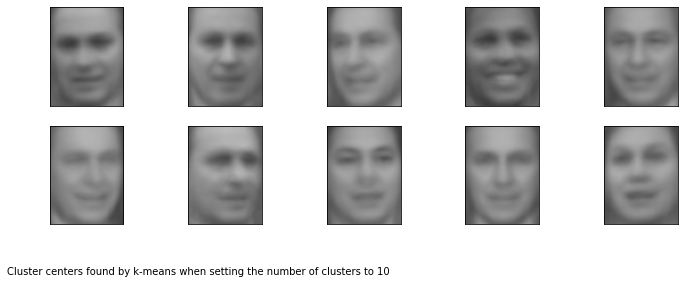

In [ ]:
fig, axes = plt.subplots(2, 5, subplot_kw={'xticks': (), 'yticks': ()},
                         figsize=(12, 4))

for center, ax in zip(km.cluster_centers_, axes.ravel()):
  ax.imshow(pca.inverse_transform(center).reshape(image_shape),
            vmin=0, vmax=1, cmap='gray')
  
plt.figtext(0.1, -0.05, "Cluster centers found by k-means when setting \
the number of clusters to 10")

plt.show()

The cluster centers found by k-means are very smooth versions of faces. This is not very surprising, given that each center is an average of 75 to 358 face images. Working with a reduced PCA representation adds to the smoothness of the images (compared to the faces reconstructed using 100 PCA dimensions). The clustering seems to pick up on different orientations of the face, different expressions (the some cluster center seems to show a smiling face), and the presence of shirt collars (see the second-to-last cluster center).

For a more detailed view, we show for each cluster center the five most typical images in the cluster (the images assigned to the cluster that are closest to the cluster center) and the five most atypical images in the cluster (the images assigned to the cluster that are furthest from the cluster center):

Sample images for each cluster found by k-means -the cluster centers are on the
left, followed by the five closet points to each center and the five points that
are assigned to the cluster but are furthest away from the center


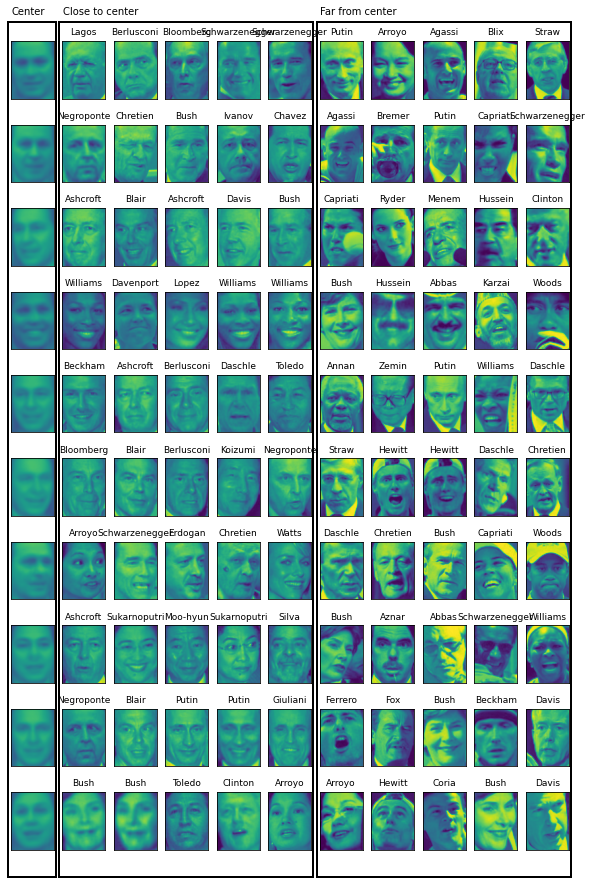

In [ ]:
mglearn.plots.plot_kmeans_faces(km, pca, X_pca, X_people, 
                                y_people, people.target_names)

print("Sample images for each cluster found by k-means -the cluster centers \
are on the\nleft, followed by the five closet points to each center and the \
five points that\nare assigned to the cluster but are furthest away from the \
center")

The figure above confirms our intuition about smiling faces for the third cluster, and also the importance of orientation for the other clusters. The "atypical" points are not very similar to the cluster centers, though, and their assignment seems somewhat arbitrary. This can be attributed to the face that k-means partitions all the data points and doesn't have a concept of "noise" points, as DBSCAN does. Using a large number of clusters, the algorithm could find finer distinctions. However, adding more clusters makes manual inspection even harder.

**Analyzing the faces dataset with agglomerative clustering**

Now, let's look at the results of agglomerative clustering:

In [ ]:
# extract clusters with ward agglomerative clustering
agglomerative = AgglomerativeClustering(n_clusters=10)
labels_agg = agglomerative.fit_predict(X_pca)
print("Cluster sizes agglomerative clustering: {}".format(
    np.bincount(labels_agg)))

Cluster sizes agglomerative clustering: [169 660 144 329 217  85  18 261  31 149]


Agglomerative clustering also produces relatively equally sized clusters, with cluster sizes between 18 to 660. These are more uneven than those produced by k-means, but much more even than the ones produced by DBSCAN.

We can compute the ARI to measure whether the two partitions of the data given by agglomerative clustering and k-means are similar:

In [ ]:
print("ARI: {:.2f}".format(adjusted_rand_score(labels_agg, labels_km)))

ARI: 0.09


An ARI of only 0.09 means that the two clustering `labels_agg` and `labels_km` have little in common. This is not very surprising, given the fact that points further away from the cluster centers seem to have little in common for k-means.

Next, we might want to plot the dendrogram. We'll limit the depth of the tree in the plot, as branching down t othe individual 2,063 data points would result in an unreadably dense plot:

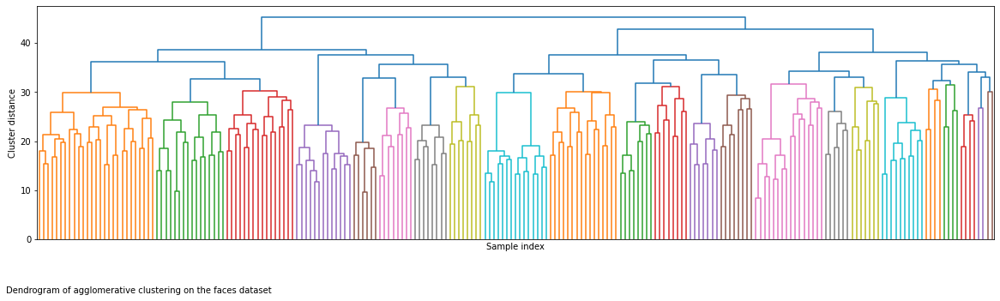

In [ ]:
linkage_array = ward(X_pca)

# now we plot the dendrogram for the linkage_array
# containing the distances between clusters
plt.figure(figsize=(20, 5))
dendrogram(linkage_array, p=7, truncate_mode='level', no_labels=True)

plt.xlabel("Sample index")
plt.ylabel("Cluster distance")
plt.figtext(0.1, -0.05, "Dendrogram of agglomerative clustering on \
the faces dataset")

plt.show()

Creating 10 clusters, we cut across the tree at the very top, where there are 10 vertical lines. you could see by the length of the branches that two or three clusters might capture the data appropriately. For the faces data, there doesn't seem to be a very natural cutoff point. There are some branches that represent more distinct groups, but there doesn't appear to be a particular number of clusters that is a good fit. This is not surprising, given the results of DBSCAN, which tried to cluster all points together.

Let's visualize the 10 clusters, as we did for k-means earlier. Note that there is no notion of cluster center in agglomerative clustering (though we could compute the mean), and we simply show the first couple of points in each cluster. We show the number of points in ech cluster to the left of the first image:

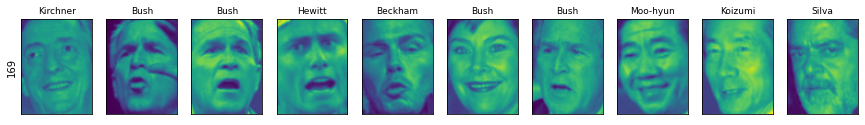

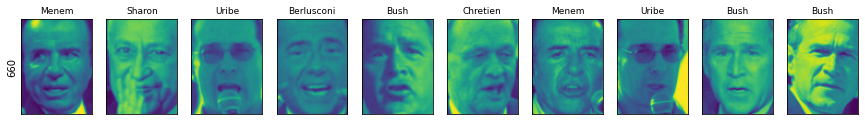

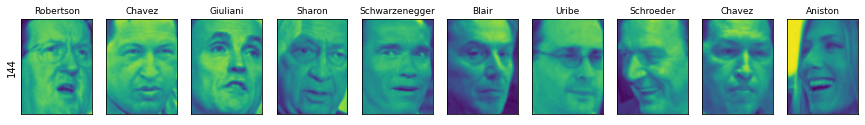

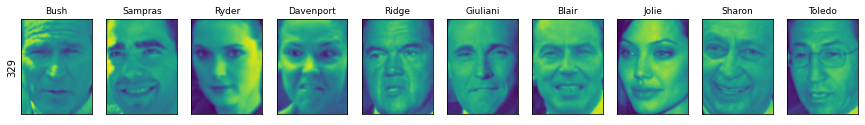

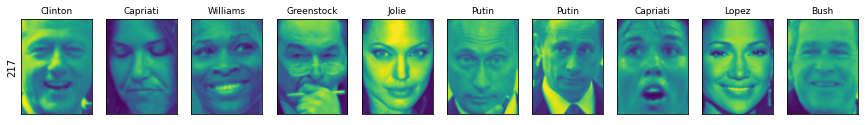

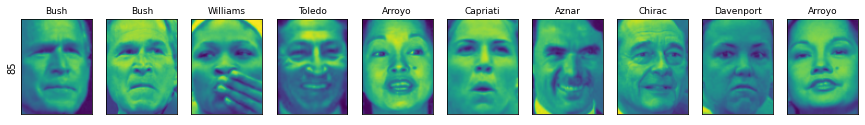

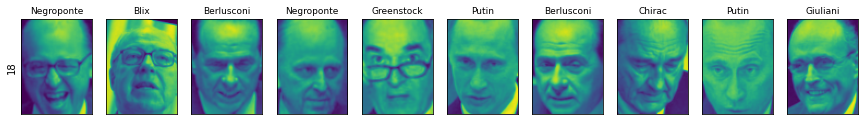

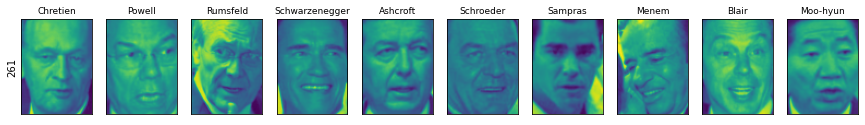

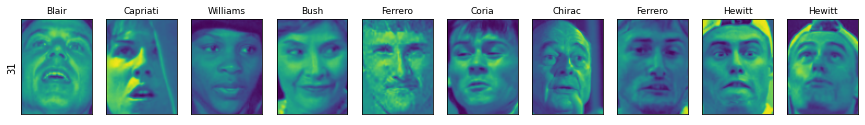

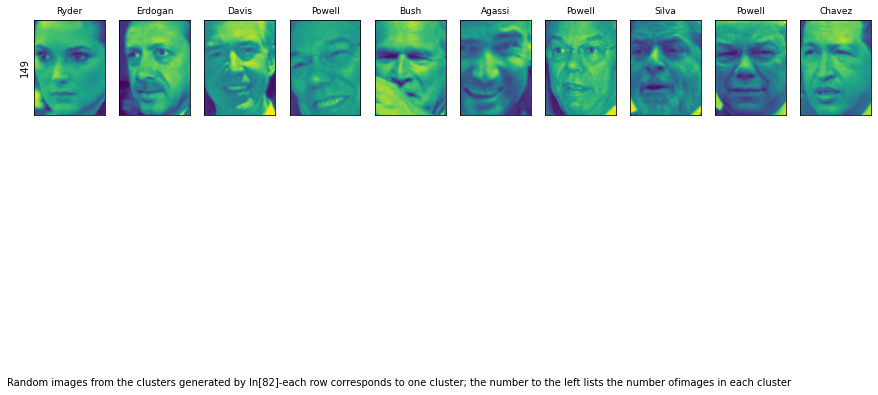

In [ ]:
n_clusters = 10
for cluster in range(n_clusters):
  mask = labels_agg == cluster
  fig, axes = plt.subplots(1, 10, subplot_kw={'xticks': (), 'yticks': ()},
                           figsize=(15, 8))
  
  axes[0].set_ylabel(np.sum(mask))
  for image, label, asdf, ax in zip(X_people[mask], y_people[mask],
                                  labels_agg[mask], axes):
    ax.imshow(image.reshape(image_shape), vmin=0, vmax=1)
    ax.set_title(people.target_names[label].split()[-1],
                fontdict={'fontsize':9})

plt.figtext(0.1, -0.05, "Random images from the clusters generated by In[82]-\
each row corresponds to one cluster; the number to the left lists the number of\
images in each cluster")
plt.show()

While some of the clusters seem to have a semantic theme, many of them are too large to be actually homogeneous. To get more homogeneous clusters, we can run the algorithm again, this time with 40 clusters, and pick out some of the clusters that are particularly interesting

cluster sizes agglomerative clustering: [ 43 120 100 194  56  58 127  22   6  37  65  49  84  18 168  44  47  31
  78  30 166  20  57  14  11  29  23   5   8  84  67  30  57  16  22  12
  29   2  26   8]


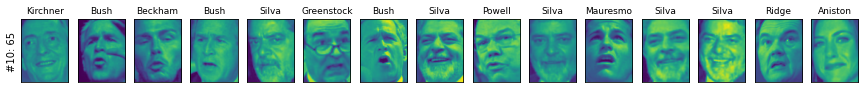

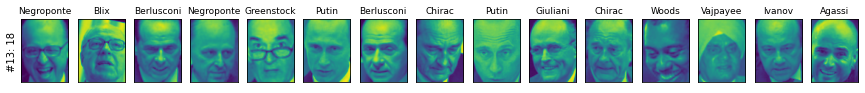

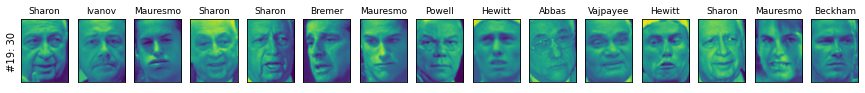

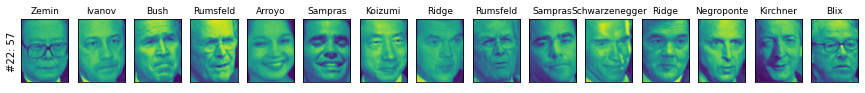

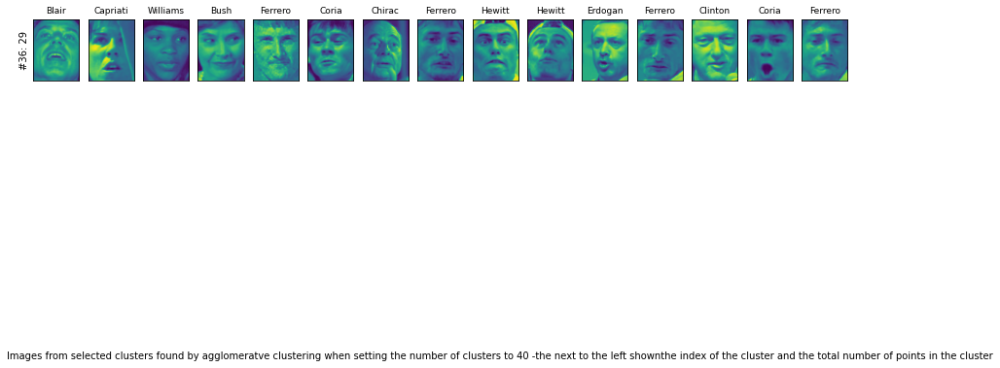

In [ ]:
# extract clusters with ward agglomerative clustering
agglomerative = AgglomerativeClustering(n_clusters=40)
labels_agg = agglomerative.fit_predict(X_pca)
print("cluster sizes agglomerative clustering: {}".format(np.bincount(labels_agg)))

n_clusters = 40
for cluster in [10, 13, 19, 22, 36]: # hand-picked "interesting" clusters
  mask = labels_agg == cluster
  fig, axes = plt.subplots(1, 15, subplot_kw={'xticks': (), 'yticks': ()},
                           figsize=(15, 8))
  cluster_size = np.sum(mask)
  axes[0].set_ylabel("#{}: {}".format(cluster, cluster_size))
  for image, label, asdf, ax in zip(X_people[mask], y_people[mask],
                                   labels_agg[mask], axes):
    ax.imshow(image.reshape(image_shape), vmin=0, vmax=1)
    ax.set_title(people.target_names[label].split()[-1],
                 fontdict={'fontsize': 9})
  for i in range(cluster_size, 15):
    axes[i].set_visible(False)

plt.figtext(0.1, -0.05, "Images from selected clusters found by agglomeratve \
clustering when setting the number of clusters to 40 -the next to the left shown\
the index of the cluster and the total number of points in the cluster")

plt.show()

Here, the clustering seems to have picked up on "dark skinned and smiling," "collared shirt," "smiling women," "Hussein," and "high forehead." We could also find these highly similar cluster using the dendrogram, if we did more a detailed analysis.

**Summary of Clustering Methods**

This section has shown that applying and evaluating clustering is a highly qualitative procedure, and often most helpful in the exploratory phase of data analysis. We looked at three clustering algorithms: k-means, DBSCAN, and agglomerative clustering. All three have a way of controlling the granularity of clustering. k-means and agglomerative clustering allow you to specify the number of desired clusters,  while DBSCAN lets you define proximity using the `eps` parameter, which indirectly influences cluster size. All three methods can be used on large, real-world datasets, are realatively easy to understand, and allow for clustering into many clusters.

Each of the algorithms has somewhat different strengths. k-means allows for a characterization of the clusters using the cluster means. It can also be viewed as a decomposition method, where each data point is represented by its cluster center. DBSCAN allows for the detection of "noise points" that are not assigned any cluster, and it cna help automatically determine the number of clusters. In contrast to the other tow methods, it allow for complex cluster shape, as we saw in the `two_moons` example. DBSCAN sometimes produces clusters of very differing size, which can be a strength or a weakness. Agglomerative clustering can provide a whole hierarchy of possible partitions of the data, which can be easily inspected via dendrograms.

**Summary and Outlook**

This chapter introduced a range of unsupervised learning algorithms that can be applied for exploratory data analysis and preprocessing. Having the right representation of the data is often crucial for supervised or unsupervised learning to succedd, and preprocessing and decomposition methods play an important part in data preparation.

Decomposition, manifold learning, and clustering are essential tools to further your understanding of your data, and can be the only ways to make sense of your data in the absence of supervision information. Even in a supervised setting, exploratory tools are important for a better understanding of the properties of the data. Often it is hard to quantify the usefulness of an unsupervised algorithm, though this shouldn't deter you from using them to gather insights from your data. With these methods under your belt, you are now equipped with all the essential learning algorithms that machine learning practitioners use every day.

We encourage you to try clustering and decomposition methods both on two-dimensional toy data and on real-word datasets included in `scikit-learn`, lie the `digits`, `iris` and `cancer` datasets.


# <center><b>Chapter 4: Representing Data and Engineering Features</b></center>

So far, we've assumed that our data comes in as a two-dimensional array of floating-point numbers, where each column is a continuous feature that describes the data points. For many applications, this is not how the data is collected. A particularly common type of feature is the categorical features. Also known as discrete features, these are usually not numeric. The distinction between categorical features and continuous features is analogous to the distinction between classification and regression, only on t he input side rather than the output side. Examples of continuous features that we have seen are pixel brightnesses and size measurements of plant flowers. Examples of categorical features are the brand of a product, the color of a product, or the department (books, clothing, hardware) it is sold in. These are all properties that can describe a product, but they don't vary in a contiouous way. A product belongs either in the clothing department of in the books department. There is no middle ground between books and clothing, and no natural order for the different categories (books is not greater or less than clothing, hardware is not between books and clothing, etc.).

Regardless of the types of features you data consists of, how you represent them can have an enormous effect on the performance of machine learning models. We saw in Chapters 2 and 3 that scaling of the data is important. In other words, if you don't rescale your data (say, to unit variance), then it makes a difference wheter you represent a measurement in centimeters or inches. We also saw in Chapter 2 that it can be helpful to augment your data with additional features, like adding interactions (products) of features or more general polynomials.

The question of how to represent your data best for a particular application is known as **feature engineering**, and it is one of the main tasks of data scientists and machine learning practitioners trying to solve real-world problems. Representing your data in the right way can have a bigger influence on the performance of a supervised model than the exact parameters you choose.

In this chapter, we will first go over the improtant and very common case of categorical features, and then give some examples of helpful transformations for specific combinations of features and models.

## **Categorical Variables**

As an example, we will use the dataset of adult incomes in the United States, derived from the 1994 census database. The task of the `adult dataset ` is to predict whether a worker has an income of over \$50,000 or under \$50,000. The features in this dataset include the workers' ages, how they are employed (self employed, private industry employee, government employee, etc.) their education,  their gender, their working hours per week, occupation, and more. Table 4-1 shows the first few entries in the dataset.

<table>
  <tr>
    <td colspan="8"><h5>Table 4-1. The first few entries in the adult dataset</h5></td>
  </tr>
  <tr>
    <th></th>
    <th>age</th>
    <th>workclass</th>
    <th>education</th>
    <th>gender</th>
    <th>hours-per-week</th>
    <th>occupation</th>
    <th>income</th>
  </tr>
  <tr>
    <td>0</td>
    <td>39</td>
    <td>State-gov</td>
    <td>Bachelors</td>
    <td>Male</td>
    <td>40</td>
    <td>Adm-clerical</td>
    <td><=50K</td>
  </tr>
  <tr>
    <td>1</td>
    <td>50</td>
    <td>Self-emp-not-inc</td>
    <td>Bachelors</td>
    <td>Male</td>
    <td>13</td>
    <td>Exec-managerial</td>
    <td><=50K</td>
  </tr>
  <tr>
    <td>2</td>
    <td>38</td>
    <td>Private</td>
    <td>HS-grad</td>
    <td>Male</td>
    <td>40</td>
    <td>Handlers-clearners</td>
    <td><=50K</td>
  </tr>
  <tr>
    <td>3</td>
    <td>53</td>
    <td>Private</td>
    <td>11th</td>
    <td>Male</td>
    <td>40</td>
    <td>Handlers-cleaners</td>
    <td><=50K</td>
  </tr>
  <tr>
    <td>4</td>
    <td>28</td>
    <td>Private</td>
    <td>Bachelors</td>
    <td>Female</td>
    <td>40</td>
    <td>Prof-specialty</td>
    <td><=50K</td>
  </tr>
  <tr>
    <td>5</td>
    <td>37</td>
    <td>Private</td>
    <td>Masters</td>
    <td>Female</td>
    <td>40</td>
    <td>Exec-managerial</td>
    <td><=50K</td>
  </tr>
  <tr>
    <td>6</td>
    <td>49</td>
    <td>Private</td>
    <td>9th</td>
    <td>Female</td>
    <td>16</td>
    <td>Other-service</td>
    <td><=50K</td>
  </tr>
  <tr>
    <td>7</td>
    <td>52</td>
    <td>Self-emp-not-inc</td>
    <td>HS-grad</td>
    <td>Male</td>
    <td>45</td>
    <td>Exec-managerial</td>
    <td>>50K</td>
  </tr>
  <tr>
    <td>8</td>
    <td>31</td>
    <td>Private</td>
    <td>Masters</td>
    <td>Female</td>
    <td>50</td>
    <td>Prof-specialty</td>
    <td>>50K</td>
  </tr>
  <tr>
    <td>9</td>
    <td>42</td>
    <td>Private</td>
    <td>Bachelors</td>
    <td>Male</td>
    <td>40</td>
    <td>Exec-managerial</td>
    <td>>50K</td>
  </tr>
  <tr>
    <td>10</td>
    <td>37</td>
    <td>Private</td>
    <td>Some-college</td>
    <td>Male</td>
    <td>80</td>
    <td>Exec-managerial</td>
    <td>>50K</td>
  </tr>
</table>

The task is phrased as a clssification task with the two classes being income `<=50K` and  `>50K`. It would also be possible to predict the exact income, and make this a regression task. However, that would be much more difficult, and the 50K division is interesting to understand on its own. 

In this dataset, `age` and `hours-per-week` are continuous features, which we known how to treat. The `workclass`, `education`, `sex`, and `occupation` features are categorical, however. All of them come from a fixed list of possible values, as opposed to a range, and denote a qualitative property, as opposed to a quantity. 

As a string point, let's say we want to learn a logistic regression classifier on this data. We know from Chapter 2 tht a logistic regression makes predictions, `ŷ`, using the following formula:

$$ŷ\:=\:w\left[0\right]\:\cdot \:x\left[0\right]\:+\:w\left[1\right]\:\cdot \:x\left[1\right]\:+\:...\:+\:w\left[p\right]\:\cdot \:x\left[p\right]\:+\:b\:>\:0$$

Where w[i] and b are coefficients learned from the training set and x[i] are the input features. This formula makes sense when x[i] are numbers, but not when x[2] is `"Masters"` or `"Bachelors"`. Clearly we need to represent our data in some different way when applying logistic regression. The next section will explain how we can overcome this problem.

**One-Hot-Encoding (Dummy Variables)**

By far the most common way to represent categorical variables is using the one-hot-encoding or one-out-of-N encoding, also known as dummy variables. The idea behind dummy variables is to replace a categorical variable with one or more new features that can have the values 0 and 1. The values 0 and 1 make sense in the formula for linear binary classification (and for all other models in `scikit-learn`), and we can represent any number of categories by introducing one new feature per category, as described here.

Let's say for the `workclass` feature we have possible values of `"Government Employee"`, `"Private Employee"`, `Self Employed`, and `Self Employed Incorporated`. To encode these four possible values, we create four new features, called `"Government Employee`, `Private Employee`, `Self Employed`, and `Self Employed Incorporated`. A feature is 1 if `workclass` for this person has the corresponding value and 0 otherwise, so exactly one of the four new features will be 1 for each data point. This is why this is called one-hot or one-out-of-N encoding.

The principle is illustrated in Table 4-2. A single feature is encoded using four new features. When using this data in a machine learning algorithm, we would drop the original `workclass` feature and only keep the 0-1 features. 

<table>
  <tr>
    <td colspan="5"><h5>Table 4-2. Encoding the workclass feature using one-hot encoding</h5></td>
  </tr>
  <tr>
    <th>workclass</th>
    <th>Government Employee</th>
    <th>Private Employee</th>
    <th>Self Employed</th>
    <th>Self Employed Incorporate</th>
  </tr>
  <tr>
    <td>Government Employee</td>
    <td>1</td>
    <td>0</td>
    <td>0</td>
    <td>0</td>
  </tr>
  <tr>
    <td>Private Employee</td>
    <td>0</td>
    <td>1</td>
    <td>0</td>
    <td>0</td>
  </tr>
  <tr>
    <td>Self Employee</td>
    <td>0</td>
    <td>0</td>
    <td>1</td>
    <td>0</td>
  </tr>
  <tr>
    <td>Self Employee Incorporated</td>
    <td>0</td>
    <td>0</td>
    <td>0</td>
    <td>1</td>
  </tr>
</table>

There are two ways to convert your data to a one-hot encoding of categorical variables, using either `pandas` or `scikit-learn`. At the time of writing, using `pandas` is slightly easier, so let's go this route. First we load the data using `pandas` from a comma-separated values (CSV) file: 

In [9]:
import pandas as pd

# this file has no headers naming the columns, so we pass header=None 
# and provide the column names explicitly in "names"
data = pd.read_csv("data/adult.data", header=None, index_col=False,
                  names=['age', 'workclass', 'fnlwgt', 'education', 
                         'education-num','marital-status', 'occupation', 
                         'relationship', 'race', 'gender', 'capital-gain',
                         'capital-loss', 'hours-per-week', 'native-country',
                         'income'])

# For illustration purposes, we only select some of the columns
data = data[['age', 'workclass', 'education', 'gender', 'hours-per-week',
             'occupation', 'income']]

# IPython.display allows nice output formatting within the notebook
display(data.head())

,age,workclass,education,gender,hours-per-week,occupation,income
0,39,State-gov,Bachelors,Male,40,Adm-clerical,<=50K
1,50,Self-emp-not-inc,Bachelors,Male,13,Exec-managerial,<=50K
2,38,Private,HS-grad,Male,40,Handlers-cleaners,<=50K
3,53,Private,11th,Male,40,Handlers-cleaners,<=50K
4,28,Private,Bachelors,Female,40,Prof-specialty,<=50K


**Checking string-encoded categorical data**

After reading a dataset like this, it is often good to first check if a column actually contains meaningful categorical data. When working with data that was input by humans (say, users on a website), there might not be a fixed set of categories, and differences in spelling and capitalization might require preprocessing. For example, it might be that some people specified gender as "male" and some as "man," and we might want to represnt these two input using the same category. A good way to check the contents of a column is using the `value_counts` function of a `pandas` `Series` (the type of a single column in a `DataFrame`), to show us what the unique values are and how often they appear:

In [10]:
print(data.gender.value_counts())

 Male      21790
 Female    10771
Name: gender, dtype: int64


We can see that there are exactly two values for gender in this dataset, `Male` and `Female`, meaning the data is already in a good format to be represented using one-hot-encoding. In a real application, you should look at all columns and check their values. We will skip this here for brevity's sake.

There is a very simple way to encode the data in  `pandas`, using the `get_dummies` function. The `get_dummies` function automatically transforms all columns that have object type (like strings) or are categorical (which is a special ` pandas` concept that we haven't talked about yet):


In [11]:
print("Original features:\n", list(data.columns), "\n")
data_dummies = pd.get_dummies(data)
print("Features after get_dummies:\n", list(data_dummies.columns))

Original features:
 ['age', 'workclass', 'education', 'gender', 'hours-per-week', 'occupation', 'income'] 

Features after get_dummies:
 ['age', 'hours-per-week', 'workclass_ ?', 'workclass_ Federal-gov', 'workclass_ Local-gov', 'workclass_ Never-worked', 'workclass_ Private', 'workclass_ Self-emp-inc', 'workclass_ Self-emp-not-inc', 'workclass_ State-gov', 'workclass_ Without-pay', 'education_ 10th', 'education_ 11th', 'education_ 12th', 'education_ 1st-4th', 'education_ 5th-6th', 'education_ 7th-8th', 'education_ 9th', 'education_ Assoc-acdm', 'education_ Assoc-voc', 'education_ Bachelors', 'education_ Doctorate', 'education_ HS-grad', 'education_ Masters', 'education_ Preschool', 'education_ Prof-school', 'education_ Some-college', 'gender_ Female', 'gender_ Male', 'occupation_ ?', 'occupation_ Adm-clerical', 'occupation_ Armed-Forces', 'occupation_ Craft-repair', 'occupation_ Exec-managerial', 'occupation_ Farming-fishing', 'occupation_ Handlers-cleaners', 'occupation_ Machine-op-i

You can see that the continuous features `age` and `hours-per-week` were not touched, while the categorical features were expanded into one new feature for each possible value:

In [12]:
data_dummies.head()

,age,hours-per-week,workclass_ ?,workclass_ Federal-gov,workclass_ Local-gov,workclass_ Never-worked,workclass_ Private,workclass_ Self-emp-inc,workclass_ Self-emp-not-inc,workclass_ State-gov,...,occupation_ Machine-op-inspct,occupation_ Other-service,occupation_ Priv-house-serv,occupation_ Prof-specialty,occupation_ Protective-serv,occupation_ Sales,occupation_ Tech-support,occupation_ Transport-moving,income_ <=50K,income_ >50K
0,39,40,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,1,0
1,50,13,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,1,0
2,38,40,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,1,0
3,53,40,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,1,0
4,28,40,0,0,0,0,1,0,0,0,...,0,0,0,1,0,0,0,0,1,0


We can now use the `values` attribute to convert the `data_dummies DataFrame` into a NumPy array, and then train a machine learning model on it. Be careful to separate the target variable (which is now encoded in two `income` columns) from the data before training a model. Including the output variable, or some derived property of the output variable, into the feature representation is a very common mistake in building supervised machine learning models.

In this case, we extract only the columns containing features -that is, all columns from `age` to `occupation_ Transport-moving`. This range contains all the features but not the target: 

In [13]:
features = data_dummies.loc[:, 'age':'occupation_ Transport-moving']

# Extract NumPy arrays
X = features.values
y = data_dummies['income_ >50K'].values

print("X.shape: {} y.shape: {}".format(X.shape, y.shape))

X.shape: (32561, 44) y.shape: (32561,)


Now the data is represented in a way that `scikit-learn` can work with, and we can processed as usual:

In [14]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    random_state=0)

logreg = LogisticRegression(max_iter=1000)
logreg.fit(X_train, y_train)

print("Test score: {:.2f}".format(logreg.score(X_test, y_test)))

Test score: 0.81


**Number Can Encode Categoricals**

In the example of the `adult` dataset, the categorical variables were encoded as strings. On the one hand, that opens up the possibility of speeling errors, but on the other hand, it clearly marks a variable as categorical. Often, whether for ease of storage or because of the way the data is colleted, categorical variables are encoded as integers. For examle, imagine the census data in the `adult` dataset was collected using a questionnaire, and the answer for `workclass` were recorded as 0 (first box ticked), 1 (second box ticked), 2 (third box ticked), and so on. NOw the column will contain numbers from 0 to 8, instead of strings like `"Private"`, and it won't be immediately obvious to someone looking at the table representing the dataset whether they should treat this variable as continuous or categorical. Knowing that the numbers indicate employment status, however, it is clear that these are very distinct states and should not be modeled by a single continuous variable.

The `get_dummies` function in `pandas` treats all numbers as continuous and will not create dummy variables for them. To get around this, you can either use `scikit-learn`'s `OneHotEncoder`, for which you can specify which variables are continuous and which are discrete, or convert numeric columns in the `DataFrame` to strings. To illustrate, let's create a `DataFrame` object with two columns, one containing strings and one containing integers: 

In [15]:
# create a DataFrame with an integer feature and a categorical string feature
demo_df = pd.DataFrame({'Integer Feature': [0, 1, 2, 1],
                        'Categorical Feature': ['socks', 'fox', 'socks', 'box']})

display(demo_df)

,Integer Feature,Categorical Feature
0,0,socks
1,1,fox
2,2,socks
3,1,box


Using `get_dummies` will only encode the string feature and will not change the integer feature, as you can see 

In [16]:
pd.get_dummies(demo_df)

,Integer Feature,Categorical Feature_box,Categorical Feature_fox,Categorical Feature_socks
0,0,0,0,1
1,1,0,1,0
2,2,0,0,1
3,1,1,0,0


If you want dummy variables to be created for the "Integer Feature" column, you can explicily list the columns you want to encode using the `columns` parameter. Then, both features will be treated as categorical

In [17]:
demo_df['Integer Feature'] = demo_df['Integer Feature'].astype(str)
pd.get_dummies(demo_df, columns=['Integer Feature', 'Categorical Feature'])

,Integer Feature_0,Integer Feature_1,Integer Feature_2,Categorical Feature_box,Categorical Feature_fox,Categorical Feature_socks
0,1,0,0,0,0,1
1,0,1,0,0,1,0
2,0,0,1,0,0,1
3,0,1,0,1,0,0


## **Binning, Discretization, Linear Models, and Trees**

The best way to represent data depends not oly on the semantics of the data, but also on the kind of model you are using. Linear models and tree-based models (such as decision trees, gradient boosted trees, and random forests), two large and very commonly used families, have very different properties when it comes to how they work with different feature representations. Let's go back to the `wave` regression dataset that we used  in Chapter 2. It has only a single input feature. Here is a comparison of a linear regression model and a decision tree regressor on this dataset: 

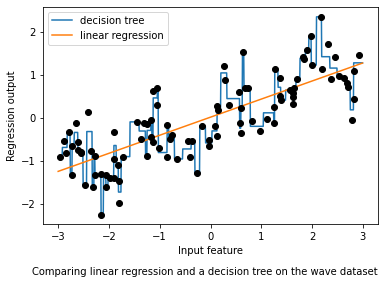

In [18]:
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor

X, y = mglearn.datasets.make_wave(n_samples=100)
line = np.linspace(-3, 3, 1000, endpoint=False).reshape(-1, 1)

reg = DecisionTreeRegressor(min_samples_split=3).fit(X, y)
plt.plot(line, reg.predict(line), label="decision tree")

reg = LinearRegression().fit(X, y)
plt.plot(line, reg.predict(line), label="linear regression")

plt.plot(X[:, 0], y, 'o', c='k')
plt.ylabel("Regression output")
plt.xlabel("Input feature")
plt.legend(loc="best")
plt.figtext(0.1, -0.05, "Comparing linear regression and a decision tree\
 on the wave dataset")

plt.show()

As you know, linear models can only model linear relationships, which are lines in the case of a single feature. The decision tree can build a much more complex model of the data. However, this is strongly dependent on the representation of the data. One way to make linear models more powerful on continuous data is to use binnig (also knowns as discretization) of  the feature to split it up into multiple features, as described here.

We imagine a partition of the input range for the feature (in this case, the numbers from -3 to 3) into a fixed number of bins -say, 10. A data point will then be represented by which bin it falls into. To determine this, we first have to define the bins. In this case, we'll define 10 bins equally spaced between -3 and 3. We use the `np.linspace` function for this, creating 11 entries, which will create 10 bins -they are the spaces in between two consecutive boundaries:

In [19]:
bins = np.linspace(-3, 3, 11)
print("bins: {}".format(bins))

bins: [-3.  -2.4 -1.8 -1.2 -0.6  0.   0.6  1.2  1.8  2.4  3. ]


Here, the first bin contains all data points with feature values -3 to -2.68, the second bin contains all points with feature values from -2.68 to -2.37, and so on.

Next, we record for each data point which bin falls into. This can be easily computed using the `np.digitize` function:

In [20]:
which_bin = np.digitize(X, bins=bins)
print("\nData points:\n", X[:5])
print("\nBin membership for data points:\n", which_bin[:5])


Data points:
 [[-0.75275929]
 [ 2.70428584]
 [ 1.39196365]
 [ 0.59195091]
 [-2.06388816]]

Bin membership for data points:
 [[ 4]
 [10]
 [ 8]
 [ 6]
 [ 2]]


What we did here is transform the single continuous input feature in the `wave` dataset into a categorical feature that encodes which bin a data point is in. To use a `scikit-learn` model on this data, we transform this discrete feature to a one-hot encoding using the `OneHotEncoder` from the `preprocessing` module. The `OneHotEncoder` does the same encoding as `pandas.get_dummies`, though it currently only works on categorical variables that are integers:

In [21]:
from sklearn.preprocessing import OneHotEncoder

# transform using the OneHotEncoder
encoder = OneHotEncoder(sparse=False)

# encode.fit finds the unique values that appear in which_bin
encoder.fit(which_bin)

# transform creates th one-hot encoding
X_binned = encoder.transform(which_bin)

print(X_binned[:5])

[[0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]]


Because we specified 10 bins, the transformed dataset `X_binned` now is made up of 10 features: 

In [22]:
print("X_binned.shape: {}".format(X_binned.shape))

X_binned.shape: (100, 10)


Now we build a new linear regression model and a new decision tree model on the one-hot-encoded data. The result is visualized, togethe with the bin boundaries, shown as dotted black lines:


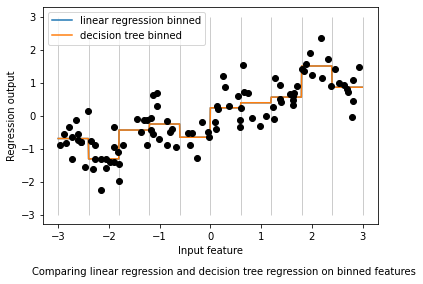

In [23]:
line_binned = encoder.transform(np.digitize(line, bins=bins))

reg = LinearRegression().fit(X_binned, y)
plt.plot(line, reg.predict(line_binned), label='linear regression binned')

reg = DecisionTreeRegressor(min_samples_split=3).fit(X_binned, y)
plt.plot(line, reg.predict(line_binned), label='decision tree binned')
plt.plot(X[:, 0], y, 'o', c='k')
plt.vlines(bins, -3, 3, linewidth=1, alpha=.2)

plt.legend(loc="best")
plt.ylabel("Regression output")
plt.xlabel("Input feature")
plt.figtext(0.1, -0.05, "Comparing linear regression and decision tree \
regression on binned features")

plt.show()

The dashed line and solid line are exactly on top of each other, meaning the linear regression model and the decision tree make exactly the same predictions. For each bin, they predict a constant value. As features are constant within each bin, any model must predict the same value for all points within a bin. Comparing what the models learned before binning the features and after, we see that the linear model became much more flexible, because it now has a different value for eah bin, while the decision tree model got much less flexible. Binning features generally has no beneficial effect for tree-based models, as these models can learn to split up the data anywhere. In a sense, that means decision trees can learn whatever binning is most useful for predicting on this data. Additionally, decision trees look at multiple features at once, while binnig is usually done on a per-feature basis. However, the linear model benefited greatly in expressiveness from the transformation of the data.

If there are good reasons to use a linear model for a particular dataset -say, becaue it is very large and high-dimensional, but some features have nonlinear relations with the output -binning can be a great way to increase modeling power.


## **Interactions and Polynomials**

Another way to enrich a feature representation, particularly for linear models, is **adding** interaction features and polynomial **features of the original data**. This kind of feature engineering is often used in statistical modeling, but it's also common in many practical machine learning applications.

As a first example, look again in the previous figure The linear model learned a constant value for each bin in the `wave` dataset. we know, however, that linear models can learn not only offsets, but also slopes. One way to add a slope to the linear model on the binned data is to add the original feature (the x-axis in the plot) back in. This leads to an 11-dimensional dataset, as seen in the figure below

In [24]:
X_combined = np.hstack([X, X_binned])
print(X_combined.shape)

(100, 11)


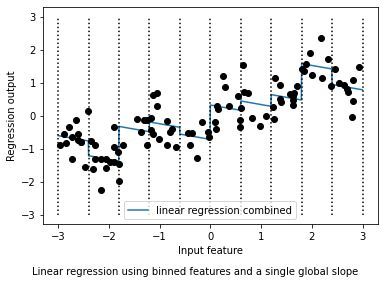

In [25]:
reg = LinearRegression().fit(X_combined, y)

line_combined = np.hstack([line, line_binned])
plt.plot(line, reg.predict(line_combined), label='linear regression combined')

for bin in bins:
  plt.plot([bin, bin], [-3, 3], ':', c='k')

plt.legend(loc="best")
plt.ylabel("Regression output")
plt.xlabel("Input feature")
plt.plot(X[:, 0], y, 'o', c='k')
plt.figtext(0.1, -0.05, "Linear regression using binned features and \
a single global slope")

plt.show()

In this example, the model learned an offset for each bin, together with a slope. The learned slope is downward, and shared across all the bins -there is a single x-axis feature, which has a single slope. Because the slope is shared across all bins, it doesn't seem to be very helpful. We would rather have a separate slope for each bin! we can achieve this by adding an interaction or product feature that indicates which bin a data point is in and where it lies on the x-axis. This feature is a product of the bin indicator and the original feature. Let's create this dataset:

In [26]:
X_product = np.hstack([X_binned, X * X_binned])
print(X_product.shape)

(100, 20)


The dataset now has **20 features**: the indicators for which bin a data point is in, and a product of the original feature and the bin indicator. You can think of the product feature as a separate copy of the x-axis feature for each bin. It is the original feature within the bin, and zero everywhere else. The figure below shows the result of the linear model on this new representation:

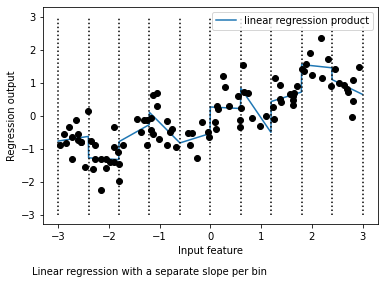

In [27]:
reg = LinearRegression().fit(X_product, y)

line_product = np.hstack([line_binned, line * line_binned])
plt.plot(line, reg.predict(line_product), label='linear regression product')

for bin in bins:
  plt.plot([bin, bin], [-3, 3], ':', c='k')

plt.plot(X[:, 0], y, 'o', c='k')
plt.ylabel("Regression output")
plt.xlabel("Input feature")
plt.legend(loc="best")
plt.figtext(0.1, -0.05, "Linear regression with a separate slope per bin")

plt.show()

As you can see, now each bin has its own offset and slope in this model. Using binning is one way to expand a continuous feature. Another one is to use polynomials of the original features. For a given feature x, we might want to consider x \*\* 2, x \*\* 3, x \*\* 4, and so on. This is implemented in `PolynomialFeatures` in the `preprocessing` module:

In [28]:
from sklearn.preprocessing import PolynomialFeatures 

# include polynomials up to x ** 10:
# the default "include_bias=True" adds a feature that's constantly 1
poly = PolynomialFeatures(degree=10, include_bias=False)
poly.fit(X)
X_poly = poly.transform(X)

Using a degree of 10 yields 10 features:

In [29]:
print("X_poly.shape: {}".format(X_poly.shape))

X_poly.shape: (100, 10)


Let's compare the entries of `X_poly` to those of `X`:

In [30]:
print("Entries of X:\n{}".format(X[:5]))
print("Entries of X_poly:\n{}".format(X_poly[:5]))

Entries of X:
[[-0.75275929]
 [ 2.70428584]
 [ 1.39196365]
 [ 0.59195091]
 [-2.06388816]]
Entries of X_poly:
[[-7.52759287e-01  5.66646544e-01 -4.26548448e-01  3.21088306e-01
  -2.41702204e-01  1.81943579e-01 -1.36959719e-01  1.03097700e-01
  -7.76077513e-02  5.84199555e-02]
 [ 2.70428584e+00  7.31316190e+00  1.97768801e+01  5.34823369e+01
   1.44631526e+02  3.91124988e+02  1.05771377e+03  2.86036036e+03
   7.73523202e+03  2.09182784e+04]
 [ 1.39196365e+00  1.93756281e+00  2.69701700e+00  3.75414962e+00
   5.22563982e+00  7.27390068e+00  1.01250053e+01  1.40936394e+01
   1.96178338e+01  2.73073115e+01]
 [ 5.91950905e-01  3.50405874e-01  2.07423074e-01  1.22784277e-01
   7.26822637e-02  4.30243318e-02  2.54682921e-02  1.50759786e-02
   8.92423917e-03  5.28271146e-03]
 [-2.06388816e+00  4.25963433e+00 -8.79140884e+00  1.81444846e+01
  -3.74481869e+01  7.72888694e+01 -1.59515582e+02  3.29222321e+02
  -6.79478050e+02  1.40236670e+03]]


You can obtain the semantics of the features by calling the `get_feature_names_out` method, which provides the exponent for each feature:

In [31]:
print("Polynomial feature names:\n{}".format(poly.get_feature_names_out()))

Polynomial feature names:
['x0' 'x0^2' 'x0^3' 'x0^4' 'x0^5' 'x0^6' 'x0^7' 'x0^8' 'x0^9' 'x0^10']


You can see that the first column of `X_poly` corresponds exactly to `X`, while the other columns are the powers of the first entry. It's interesting to see how large some of the values can get. The second column has entries above 20,000, orders of magnitude different from the rest. 

Using polynomial features together with a linear regression model yields the classical model of polynomial regression:

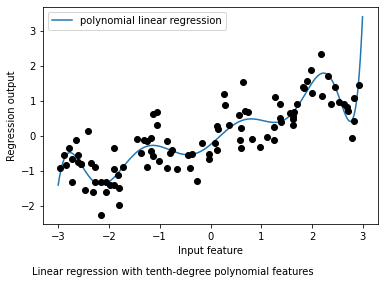

In [32]:
reg = LinearRegression().fit(X_poly, y)

line_poly = poly.transform(line)
plt.plot(line, reg.predict(line_poly), label='polynomial linear regression')
plt.plot(X[:, 0], y, 'o', c='k')

plt.ylabel("Regression output")
plt.xlabel("Input feature")
plt.legend(loc="best")
plt.figtext(0.1, -0.05, "Linear regression with tenth-degree polynomial features")

plt.show()

As you can see, polynomial features yield a very smooth fit on this one-dimensional data. However, polynomials of high degress tend to behave in extreme ways on the boundaries or in regions with little data.

As a comparison, here is a kernel SVM model learned on the original data, without any transformation:

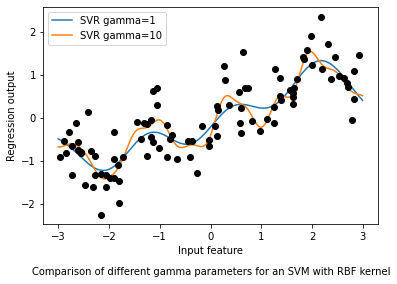

In [33]:
from sklearn.svm import SVR

for gamma in [1, 10]:
  svr = SVR(gamma=gamma).fit(X, y)
  plt.plot(line, svr.predict(line), label='SVR gamma={}'.format(gamma))

plt.plot(X[:, 0], y, 'o', c='k')
plt.ylabel("Regression output")
plt.xlabel("Input feature")
plt.legend(loc="best")
plt.figtext(0.1, -0.05, "Comparison of different gamma parameters for an SVM \
with RBF kernel")

plt.show()

Using a more complex model, a kernal SVM, we are able to learn a similarly complex prediction to the polynomial regression without an explicit transformation of the features.

As a more realistic application of interactions and polynomials, let's look again at the Boston Housing dataset. We already used polynomial features on this dataset in Chapter 2. Now let's have a look at how these features were constructed, and at how much the polynomial features help. First we load the data, and rescale it to be between 0 and 1 using `MinMaxScaler`:

In [34]:
import pandas as pd
import numpy as np

# load  the object that contains all the the information about Boston Housing Dataset.
data_url = "http://lib.stat.cmu.edu/datasets/boston"
raw_df = pd.read_csv(data_url, sep="\s+", skiprows=22, header=None)
data = np.hstack([raw_df.values[::2, :], raw_df.values[1::2, :2]])
target = raw_df.values[1::2, 2]

columns = ['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE',
           'DIS', 'RAD', 'TAX','PTRATIO', 'B', 'LSTAT']

In [35]:
from sklearn.model_selection import train_test_split 
from sklearn.preprocessing import MinMaxScaler

boston = data
X_train, X_test, y_train, y_test = train_test_split(boston,
                                                    target,
                                                    random_state=0)

# rescale data
scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

Now, we extract polynomial features and interactions up to a degress of 2:

In [36]:
poly = PolynomialFeatures(degree=2).fit(X_train_scaled)
X_train_poly = poly.transform(X_train_scaled)
X_test_poly = poly.transform(X_test_scaled)

print("X_train.shape: {}".format(X_train.shape))
print("X_train_poly.shape: {}".format(X_train_poly.shape))

X_train.shape: (379, 13)
X_train_poly.shape: (379, 105)


The data originally had 13 features, which were expanded into 105 interaction features. These new features represent all possible interactions between two different original features, as well as the square of each original feature. `degree=2` here means that we look at all features that are the product of up to two original features. The exact correspondence between input and output features can be found using the `get_features_name_out` method:

In [37]:
print("Polynomial feature names:\n{}".format(poly.get_feature_names_out()))

Polynomial feature names:
['1' 'x0' 'x1' 'x2' 'x3' 'x4' 'x5' 'x6' 'x7' 'x8' 'x9' 'x10' 'x11' 'x12'
 'x0^2' 'x0 x1' 'x0 x2' 'x0 x3' 'x0 x4' 'x0 x5' 'x0 x6' 'x0 x7' 'x0 x8'
 'x0 x9' 'x0 x10' 'x0 x11' 'x0 x12' 'x1^2' 'x1 x2' 'x1 x3' 'x1 x4' 'x1 x5'
 'x1 x6' 'x1 x7' 'x1 x8' 'x1 x9' 'x1 x10' 'x1 x11' 'x1 x12' 'x2^2' 'x2 x3'
 'x2 x4' 'x2 x5' 'x2 x6' 'x2 x7' 'x2 x8' 'x2 x9' 'x2 x10' 'x2 x11'
 'x2 x12' 'x3^2' 'x3 x4' 'x3 x5' 'x3 x6' 'x3 x7' 'x3 x8' 'x3 x9' 'x3 x10'
 'x3 x11' 'x3 x12' 'x4^2' 'x4 x5' 'x4 x6' 'x4 x7' 'x4 x8' 'x4 x9' 'x4 x10'
 'x4 x11' 'x4 x12' 'x5^2' 'x5 x6' 'x5 x7' 'x5 x8' 'x5 x9' 'x5 x10'
 'x5 x11' 'x5 x12' 'x6^2' 'x6 x7' 'x6 x8' 'x6 x9' 'x6 x10' 'x6 x11'
 'x6 x12' 'x7^2' 'x7 x8' 'x7 x9' 'x7 x10' 'x7 x11' 'x7 x12' 'x8^2' 'x8 x9'
 'x8 x10' 'x8 x11' 'x8 x12' 'x9^2' 'x9 x10' 'x9 x11' 'x9 x12' 'x10^2'
 'x10 x11' 'x10 x12' 'x11^2' 'x11 x12' 'x12^2']


The first new feature is a constant feature, called "1" here. The next 13 features are the original features (called "x0" to "x12"). Then follows the first feature squared ("x0^2") and combinations of the first and the other features.

Let's compare the performance using `Ridge` on the data with and without interactions:

In [38]:
from sklearn.linear_model import Ridge

ridge = Ridge().fit(X_train_scaled, y_train)
print("Score without interactions: {:.3f}".format(ridge.score(X_test_scaled,
                                                              y_test)))

ridge = Ridge().fit(X_train_poly, y_train)
print("Score with interactions: {:.3f}".format(ridge.score(X_test_poly,
                                                           y_test)))

Score without interactions: 0.621
Score with interactions: 0.753


Clearly, the interactions and polynomial features give us a good boost in performance when using `Ridge`. When using a more complex model like a random forest, the story is a bit different, though:

In [39]:
from sklearn.ensemble import RandomForestRegressor

rf = RandomForestRegressor(n_estimators=100).fit(X_train_scaled, y_train)
print("Score without interactions: {:.3f}".format(rf.score(X_test_scaled,
                                                           y_test)))

rf = RandomForestRegressor(n_estimators=100).fit(X_train_poly, y_train)
print("Score with interactions: {:.3f}".format(rf.score(X_test_poly,
                                                        y_test)))

Score without interactions: 0.797
Score with interactions: 0.784


You can see that even without additional features, the random forest beats the perform of `Ridge`. Adding interactions and polynomials actually decreases performance slightly.

## **Univariate Nonlinear Transformations**

We just saw that adding squared or cubed features can help linear models for regression. There are other transformations that often prove useful for transforming certain features: in particular, applying mathematical functions like `log`, `exp`, or `sin`. While tree-based models only care about the ordering of the features, linear models and neural networks are very tied to the scale and distribution of each feature, and if there is a nonlinear relation between the feature and the target, that becomes hard to model -particularly in regression. The functions `log` and `exp` can help by adjusting the relative scales in the data so that they can be captured better by a linear model or neural network. We saw an application of that in Chapter 2 with the memory price data. The `sin` and `cos` functions can come in handly when dealing with data that encodes periodic patterns.

Most models work best when each feature (and in regression also the target) is loosely Gaussian distributed -that is, a histogram of each feature should have something resembling the familiar "bell curve" shape. Using transformations like `log` and `exp` is a hacky but simpl and efficient way to achieve this. A particularly common case when such a transformation can be helpful is when dealing with integer count data. By count data, we mean features like "how often did user A log in?" Counts are never negative, and often follow particular statistical patterns. We are using a synthetic dataset of counts here that has properties similar to those you can find in the wild. The features are all integer-valued, while the response in continuous:

In [40]:
rnd = np.random.RandomState(0)
X_org = rnd.normal(size=(1000, 3))
w = rnd.normal(size=3)

X = rnd.poisson(10 * np.exp(X_org))
y = np.dot(X_org, w)

Let's look at the first 10 entries of the first feature. All are integer values and positive, but apart from that it's hard to make out a particular pattern.

If we count the appearance of each value, the distribution of values becomes clearer:

In [41]:
print("Number of feature appearances:\n{}".format(np.bincount(X[:,0])))

Number of feature appearances:
[28 38 68 48 61 59 45 56 37 40 35 34 36 26 23 26 27 21 23 23 18 21 10  9
 17  9  7 14 12  7  3  8  4  5  5  3  4  2  4  1  1  3  2  5  3  8  2  5
  2  1  2  3  3  2  2  3  3  0  1  2  1  0  0  3  1  0  0  0  1  3  0  1
  0  2  0  1  1  0  0  0  0  1  0  0  2  2  0  1  1  0  0  0  0  1  1  0
  0  0  0  0  0  0  1  0  0  0  0  0  1  1  0  0  1  0  0  0  0  0  0  0
  1  0  0  0  0  1  0  0  0  0  0  0  0  0  0  0  0  0  0  0  1]


The value 2 seems to be the most common, with 62 appearances (`bincount` always starts at 0), and the counts for higher values fall quickly. However, there are some very high values, like 134 appearing twice. We visualize the counts in The figure below:

In [42]:
from sklearn.linear_model import Ridge

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)
score = Ridge().fit(X_train, y_train).score(X_test, y_test)

print("Test score: {:.3f}".format(score))

Test score: 0.622


As you can see from the relatively low R<sup>2</sup> score `Ridge` was not able to really capture the relationsip between `X` and `y`. Applying a logarithmic transformation can help, though. Because the value 0 appears in the data (and the logarithm is not defined at 0), we can't actually just apply `log`, but we have to compute `log(X+1)`:

In [43]:
X_train_log = np.log(X_train + 1)
X_test_log = np.log(X_test + 1)

After the transformation, the distribution of the data is less asymmetrical and doesn't have very large outliers anymore

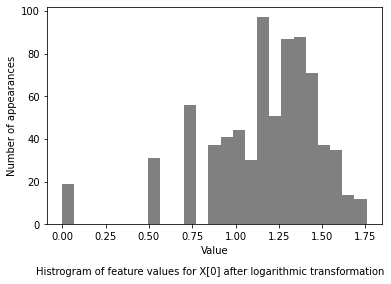

In [44]:
plt.hist(np.log(X_train_log[:, 0] + 1), bins=25, color='gray')
plt.ylabel("Number of appearances")
plt.xlabel("Value")
plt.figtext(0.1, -0.05, "Histrogram of feature values for X[0] \
after logarithmic transformation")

plt.show()

Building a ridge model on the new data provides a much better fit:

In [45]:
score = Ridge().fit(X_train_log, y_train).score(X_test_log, y_test)
print("Test score: {:.3f}".format(score))

Test score: 0.875


Finding the transformation that works best for each combination of dataset and model is somewhat of an art. In this example, all the features had the same properties. This is rarely the case in practice, and usually only a subset of the features should be transformed, or sometimes each feature needs to be transformed in a different way. AS we mentioned earlier, these kinds of transformations are irrelevant for tree-based models but might be essential for linear models. Sometimes it is also a good idea to transform the target variable `y` in regression. Trying to predict counts (say, number of order) is a fairly common task, and using the `log(y + 1)` transformation often helps.

As you saw in the previous examples, binning, polynomials, and interactions can have a huge influence on how models perform on a given dataset. This is particularly true for less complex models like linear models and naive Bayes models. Tree-based models, on the other hand, are often able to discover important interactions themselves, and don't require transforming the data explicitly most of the time. Other models, like SVMs, nearest neighbors, and neural networks, might sometimes benefit from using binning interactions, or polynomials, but the impliations there are usually much less clear than in the case of linear models.

## **Automatic Feature Selection**

With so many ways to create new features, you might get tempted to increase the dimensionality of the data way beyond the number of original features. However, **adding more features makes all models more complex**, and so **increases the chance of overfitting**. When adding new features, or with high-dimensional datasets in general, it can be a good idea to **reduce the number of features** to only the most useful ones, and discard the rest. This can lead to s**impler models that generalize better**. But how can you know how good each feature is? 

**There are three basic strategies**: 
* univariate statistics, 
* model-based selection, and 
* iterative selection. 

We will discuss all three of them in detail. **All of these methods are supervised methods**, meaning they need the target for fitting the model. This means we need to split the data into training and test sets, and fit the feature selection only on the training part of the data.

### **Univariate Statistics**

In univariate statistics, we compute whether there is **a statistically significant relationship between each feature and the target**. Then the features that are related wiht **the highest confidence are selected**. In the case of classification, this is also known as analysis of variance (ANOVA). A key property of these tests is that they are univariate, meaning that they **only consider each feature individually**, Consequently, a feature will be discaraded if it is only informative when combined with another feature. Univariate tests are often very fast to compute, and don't require building a model. On the other hand, they are completely independent of  the model that you might want to apply after the feature selection.

To use univaiate feature selection in `scikit-learn`, you need ot choose a test, usually either `f_classif` (the defualt) for classification or `f_regression` for regression, and a method to discard features based on the p-values determined in the test. All methods for discarding parameters use a threshold to discard all features with too high a p-value (which means they are unlikely to be related to the target). The methods differ in how they compute this threshold, with the simplest ones being `SelectKBest`, which slects a fixed number `k` of features, and `SelectPercentile`, which selects a fixed percentage of features. Let's apply the feature selection for classification on the `cancer` dataset. To make the task a bit harder, we'll add some noninformative noise features to the data. We expact the feature selection to be able to identify the features that are noinformative and remove them:

In [47]:
from sklearn.datasets import load_breast_cancer
from sklearn.feature_selection import SelectPercentile
from sklearn.model_selection import train_test_split

cancer = load_breast_cancer()

# get deterministic random numbers
rng = np.random.RandomState(42)
noise = rng.normal(size=(len(cancer.data), 50))

# add noise features to the data
# the first 30 features are from the dataset, the next 50 are noise
X_w_noise = np.hstack([cancer.data, noise])

X_train, X_test, y_train, y_test = train_test_split(X_w_noise,
                                                    cancer.target,
                                                    random_state=0,
                                                    test_size=0.5)

# use f_classif (the default) and SelectPercentile to select 50% of features
select = SelectPercentile(percentile=50)
select.fit(X_train, y_train)

# transform training set
X_train_selected = select.transform(X_train)

print("X_train.shape: {}".format(X_train.shape))
print("X_train_selected.shape: {}".format(X_train_selected.shape))

X_train.shape: (284, 80)
X_train_selected.shape: (284, 40)


As you can see, the number of features was reduced from 80 to 40 (50 percent of the original number of features). We can find out which features have been selected using the `get_support` method, which returns a Boolean mask of the selected features.

[ True  True  True  True  True  True  True  True  True False  True False
  True  True  True  True  True  True False False  True  True  True  True
  True  True  True  True  True  True False False False  True False  True
 False False  True False False False False  True False False  True False
 False  True False  True False False False False False False  True False
  True False False False False  True False  True False False False False
  True  True False  True False False False False]


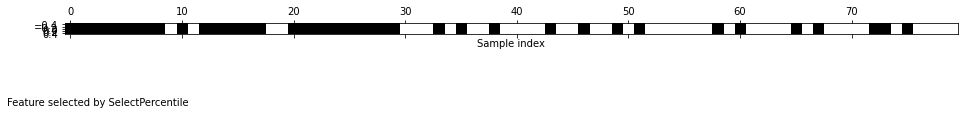

In [50]:
mask = select.get_support()
print(mask)

# visualize the mask -- black is True, white is False
plt.matshow(mask.reshape(1, -1), cmap='gray_r')

plt.xlabel("Sample index")
plt.figtext(0.1, -0.05, "Feature selected by SelectPercentile")

plt.show()

As you can see from the visualization of the mask, most of the selected features are the original features, and most of the noise features were removed. However, the recovery of the original features is not perfect. Let's compare the performance of logictic regression on all features against the performance using only the selected features:

In [63]:
from sklearn.linear_model import LogisticRegression

# transform test data
X_test_selected = select.transform(X_test)

lr = LogisticRegression(solver='liblinear', max_iter=1000)


lr.fit(X_train, y_train)
print("Score with all features: {:.3f}".format(lr.score(X_test,
                                                        y_test)))

lr.fit(X_train_selected, y_train)
print("Score with only selected features: {:.3f}".format(lr.score(X_test_selected,
                                                                 y_test)))

Score with all features: 0.930
Score with only selected features: 0.940


In this case, removing the noise features improved performance, even though some of the original features were lost, This was a very simple synthetic example, and out comes on real data are usually mixed. Univariate feature selection can still be very helpful, though, if there is such a large number of features that building a model on them is infeasible, or if you suspect that many features are completely uninformative.

### **Model-Based Feature Selection**

Model-based feature selection uses a supervised machine learning model to **judge the importance of each feature, and keeps only the most important ones**. The supervised model that is used for feature selection doesn't need to be the same model that is used for the final supervised modeling. The feature selection model needs to provide **some measure of importance for each feature**, so that they can **be ranked by this measure**. Decision trees and decision tree-based models provide a `feature_importances_` attribute, which direcly encodes the importance of each feature. Linear models have coefficients, which can also be used to capture importances by considering the absolute values. As we saw in Chapter 2, linear models with L1 penalty learn sparse coefficients, which only use a small subset of features. This can be viewed as a form of feature selection for the model itself, but can also be used as a preprocessing step to select features for another model. In contrast to univariate selection, model-based selection considers all features at once, and so can capture interactions (if the model can capture them). To use model-based feature selection, we need to use the `SelectFromModel` transformer:

In [64]:
from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import RandomForestClassifier 

select = SelectFromModel(RandomForestClassifier(n_estimators=100,
                                                random_state=12),
                                                threshold='median')

The `SelectFromModel` class selects all features that have an importance measure of the feature (as provided by the supervised model) greater than the provided threshold. To get a comparable result to what we got with univariate feature selection, we used the median as a threshold, so that half of the features will be selected. We use a random forsest classifier with 100 trees to compute the feature importances. This is a quite complex model and much more powerful than using univariate tests. Now let's actually fit the model:

In [65]:
select.fit(X_train, y_train)
X_train_l1 = select.transform(X_train)

print("X_train.shape: {}".format(X_train.shape))
print("X_train_l1.shape: {}".format(X_train_l1.shape))

X_train.shape: (284, 80)
X_train_l1.shape: (284, 40)


Again, we can have a look at the features that were selected

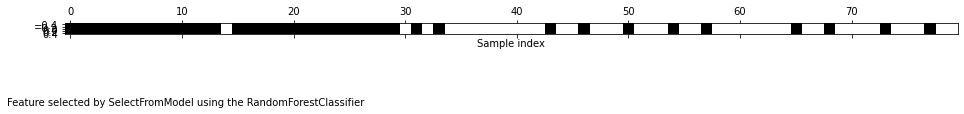

In [66]:
mask = select.get_support()

# visualize the mask -- black is True, white is False
plt.matshow(mask.reshape(1, -1), cmap='gray_r')

plt.xlabel("Sample index")
plt.figtext(0.1, -0.05, "Feature selected by SelectFromModel \
using the RandomForestClassifier") 

plt.show()

This time, all but two of the original features were selected. Because we specified to select 40 features, some of the noise features are also selected. Let's take a look at the performance:

In [69]:
X_test_l1 = select.transform(X_test)
score = LogisticRegression(solver='liblinear', max_iter=1000).fit(X_train_l1, y_train).score(X_test_l1, y_test)

print("Test score: {:.3f}".format(score))

Test score: 0.954


With the better feature selection, we also gained some improvements here.

### **Iterative Feature Selection**

In univariate testing we used no model, while in model-based selection we used a single model to select features. In iterative feature selection, a **series of models are built, with varying numbers of features.** 

There are **two basic methods**: 
* starting with **no features and adding features** one by one until some stopping criterion is reached.
* starting with **all features and removing features one by one** until some stopping criterion is reached. Because a series of models are built. 

These methods are much more computationally expensive than the methods we discussed previously. One particular method of this kind is **recurisve feature elimination (RFE)**, which start with all features, builds a model, and **discards the least important featue according to the model**. Then a new model is built using all but the discarded feature, and so on until only a prespecified number of features are left. For this to work, the model used for selection needs to provide some way to determine feature importance, as was the case for the model-based selection. Here we use the same random forest model that we used earlier, and get the results.

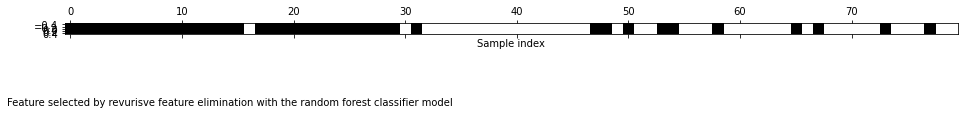

In [71]:
from sklearn.feature_selection import RFE

select = RFE(RandomForestClassifier(n_estimators=100,
                                    random_state=42),
                                    n_features_to_select=40)

select.fit(X_train, y_train)

# visualize the selected features:
mask = select.get_support()

plt.matshow(mask.reshape(1, -1), cmap='gray_r')
plt.xlabel("Sample index")
plt.figtext(0.1, -0.05, "Feature selected by revurisve feature elimination \
with the random forest classifier model") 

plt.show()

The feature selection got better compared to the univariate and model-based selection, but one feature was still missed. Running this code also takes significantly longer than that for the model-based selection, because a random forest model is trained 40 times, once for each feature that is dropped. Let's test the accuracy of the logistic regression model when using RFE for feature selection:

In [73]:
X_train_rfe = select.transform(X_train)
X_test_rfe = select.transform(X_test)

score = LogisticRegression(solver='liblinear', max_iter=1000).fit(X_train_rfe, y_train).score(X_test_rfe, y_test)
print("Test score: {:.3f}".format(score))

Test score: 0.951


We can also use the model used inside the RFE to make predictions. This uses only the feature set that was selected:

In [74]:
print("Test score: {:.3f}".format(select.score(X_test, y_test)))

Test score: 0.951


Here, the performance of the random forest used inside the RFE is the same as that achieved by training a logistic regression model on top of the selected features. In other words, once we've selected the right features, the linear model performs as well as the random forest.

If you are unsure when selecting what to use as input to your machine learning algorithms, automatic feature selection can be quite helpful. It is also great for reducing the amount of features needed -for example, to speed up prediction or to allow for more interpretable models. In most real-world cases, applying feature selection is unlikely to provide large gains in performance. However, it is still a valuable tool in the toolbox of the feature engineer.

## **Utilizing Expert Knowledge**

Feature engineering is often an important place to use **expert knowledge** for a particular application. While the purpose of machine learning in many cases is to avoid having to create a set of expert-designed rules, that dones't mean that prior knowledge of the application or domain should be discarded. Often, domain experts can help in identifying useful features that are much more informative than the initial representation of the data. Imagine you work for a travel agency and want to predict flight prices. Let's say you have a record of prices together with dates, airlines, start locations, and destinations. A machine learning model might be able to build a decent model from that. Some important factors in flight prices, however, cannot be learned. For example, flights are usually more expansive during peak vacation months and around holidays. While the dates of some holidays (like Christmas) are fixed, and their effect can therefore be learned from the data, others might depend on the phases of the moon (like Hanukkah and Ester) or be set by authorities (like school holidays). These events cannot be learned from the data if each flight is only recorded using the (Gregorian) data. However, it is easy to add a feature that encodes whether a flight was on, preceding, or following a public or school holiday. In this way, prior knowledge about the nature of the task can be encoded in the features to aid a machine learning algorithm. Adding a feature does not force a machine learning algorithm to use it, and even if the holiday information turns out to be noninformative for flight prices, augmenting the data with this information doesn't hurt.

We'll now look at one particular case of using expert knowledge -though in this case it might be more rightfully called "common sense." The task is predicting bicycle rentals in front of Andreas's house.

In New York, Citi Bike operates a network of bicycle rental stations with a subscription system. The stations are all over the city and provide a convenient way to get around. Bike rental data is made public in an anonymized form and has been analyzed in various ways. The task we want to solve is to predict for a given time and day how many people will rent a bike in front of Andreas's house -so he knows if any bikes will be left for him.

We first load the data for August 2015 for this particular station as a `pandas` `DataFrame`. We resample the data into three-hour intervals to obtain the main trends for each day:

In [158]:
citibike = mglearn.datasets.load_citibike()

print("City Bike data:\n{}".format(citibike.head()))

City Bike data:
starttime
2015-08-01 00:00:00     3
2015-08-01 03:00:00     0
2015-08-01 06:00:00     9
2015-08-01 09:00:00    41
2015-08-01 12:00:00    39
Freq: 3H, Name: one, dtype: int64


The following example shows a visualization of the rental frequencies for the whole month:

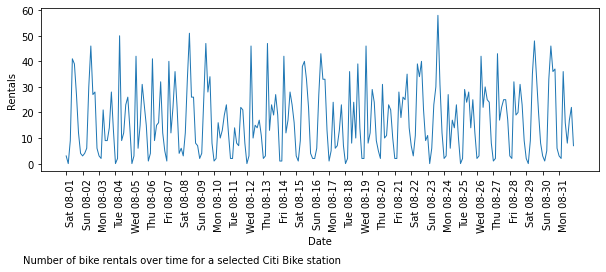

In [159]:
plt.figure(figsize=(10, 3))
xticks = pd.date_range(start=citibike.index.min(), end=citibike.index.max(),
                       freq='D')

plt.xticks(xticks, xticks.strftime("%a %m-%d"), rotation=90, ha="left")
plt.plot(citibike, linewidth=1)

plt.xlabel("Date")
plt.ylabel("Rentals")
plt.figtext(0.1, -0.3, "Number of bike rentals over time for \
a selected Citi Bike station")

plt.show()

Looking at the data, we can clearly distinguish day and night for each 24-hour interval. The patterns for weekdays and weekends also seem t obe quite different. When evaluating a prediction task on a time series like this, we usually want to learn from the past and predict for the feature. This means when doing a split into a training and a test set, we want to use all the data up to  a certain data as the training set and all the data past that date as the test set. This is how we would usually use time series prediction: given everything that we know about rentals in the past, what do we think will happen tomorrow? We will use the first 184 data points, corresponding to the first 23 days, as our training set, and the remaining 64 data points, corresponding to the remaining 8 days, as our test set.

The only feature that we are using in our prediction taks is the data and time when a particular number of rentals occurred. So, the input feature is the date and time -say, `2015-08-01 00:00:00` -and the output is the number of rentals in the following three hours (three in this case, according to our `DataFrame`).

A (surprisingly) common way that dates are stored on computer is using POSIX time, which is the number of seconds since January 1970 00:00:00 (aka the beginning of Unix time). As a first try, we can use this single integer feature as our data representation:

In [160]:
# extract the target values (number of rentals)
y = citibike.values
# convert the time to POSIX time using "%s"
X = citibike.index.strftime("%s").astype("int")
X = np.array(X).reshape(-1, 1)

In [161]:
print((dir(X)))

['T', '__abs__', '__add__', '__and__', '__array__', '__array_finalize__', '__array_function__', '__array_interface__', '__array_prepare__', '__array_priority__', '__array_struct__', '__array_ufunc__', '__array_wrap__', '__bool__', '__class__', '__complex__', '__contains__', '__copy__', '__deepcopy__', '__delattr__', '__delitem__', '__dir__', '__divmod__', '__doc__', '__eq__', '__float__', '__floordiv__', '__format__', '__ge__', '__getattribute__', '__getitem__', '__gt__', '__hash__', '__iadd__', '__iand__', '__ifloordiv__', '__ilshift__', '__imatmul__', '__imod__', '__imul__', '__index__', '__init__', '__init_subclass__', '__int__', '__invert__', '__ior__', '__ipow__', '__irshift__', '__isub__', '__iter__', '__itruediv__', '__ixor__', '__le__', '__len__', '__lshift__', '__lt__', '__matmul__', '__mod__', '__mul__', '__ne__', '__neg__', '__new__', '__or__', '__pos__', '__pow__', '__radd__', '__rand__', '__rdivmod__', '__reduce__', '__reduce_ex__', '__repr__', '__rfloordiv__', '__rlshift_

We first define a function to split the data into training and test sets, build the model, and visualize the result:

In [164]:
# use the first 184 data points for training, and the rest for testing 
n_train = 184

# function to evaluate and plot a regressor on a given feature set
def eval_on_features(features, target, regressor):
  # split the given features into a training and a test set
  X_train, X_test = features[:n_train], features[n_train:]
  # also split the target array
  y_train, y_test = target[:n_train], target[n_train:]
  regressor.fit(X_train, y_train)
  print("Test-set R^2: {:.2f}".format(regressor.score(X_test, y_test)))
  y_pred = regressor.predict(X_test)
  y_pred_train = regressor.predict(X_train)
  plt.figure(figsize=(10, 3))

  plt.xticks(range(0, len(X), 8), xticks.strftime("%a %m-%d"), rotation=90,
             ha="left")
  
  plt.plot(range(n_train), y_train, label="train")
  plt.plot(range(n_train, len(y_test) + n_train), y_test, '-', label="test")
  plt.plot(range(n_train), y_pred_train, '--', label="prediction train")
  plt.plot(range(n_train, len(y_test) + n_train), y_pred, '--',
           label="prediction test")
  
  plt.legend(loc=(1.01, 0))
  plt.xlabel("Date")
  plt.ylabel("Rentals")

We saw earlier that random forests require very little preprocessing of  the data, which makes this seem like a good model to start with. We use the POSIX time feature `X` and pass a random forest regressor to our `evel_on_features` function. 

Test-set R^2: -0.04
Predictions made by a random forest using only the POSIX


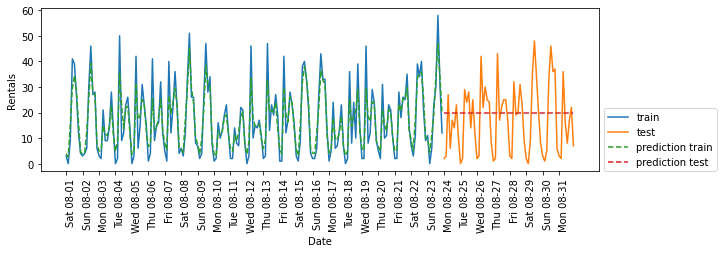

In [188]:
from sklearn.ensemble import RandomForestRegressor

regressor = RandomForestRegressor(n_estimators=100, random_state=0, max_features=1)
eval_on_features(X, y, regressor)
print("Predictions made by a random forest using only \
the POSIX")

The predictions on the training set are quite good, as it usual for random forests. However, for the test set, a constant line is preidcted. The R<sup>2</sup> is -0.03, which mean that we learned nothing. What happened?

The problem lies lin the combination of our feature and the random forest. The value of the POSIX time feature for the test set is outside of the range of the feature values in the training set: the points in the test set have timestamps that are later than all the points in the training set. Trees, and therefore random forests, cannot extrapolate to feature ranges outside the training set. The result is that the model simply predicts the target value of the closest point in the training set -which is the last time it observed any data.

Clearly we can do better than this. This is where out "expert knowledge" comes in From looking at the rental figures in the training data, two factors seem to be very important: the time of day and  the day of the week. So, let's add these two features. We can't really learn anything from the POSIX times, so we drop that feature. First, let's use only the hour of the day. AS The figure below shows, now the predictions have the same pattern for each day of the week:

Test-set R^2: 0.60
Predictions made by a random forest using only the hour of the day


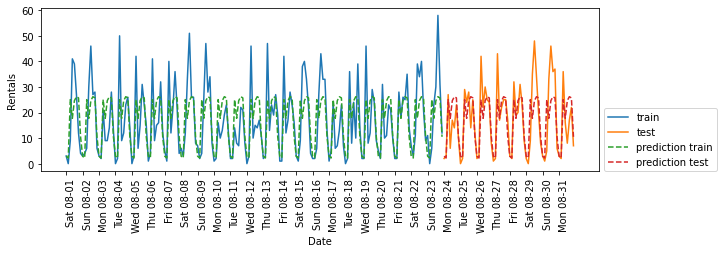

In [190]:
X_hour = np.array(citibike.index.hour).reshape(-1, 1)
eval_on_features(X_hour, y, regressor)
print("Predictions made by a random forest using only the hour of the day")

The R<sup>2</sup> is alreay much better, but the predictions clearly miss the weekly pattern. Now let's also add the day of the week:

Test-set R^2: 0.84
Predictions with a random forest using day of week and hour of day feature


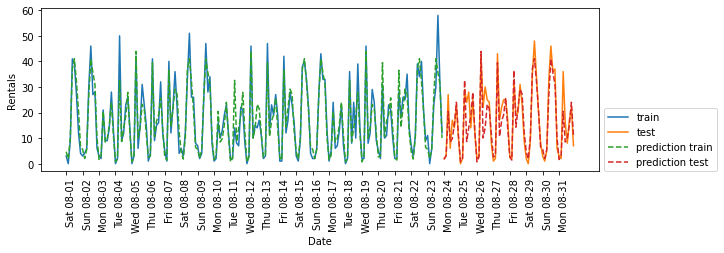

In [192]:
X_hour_week = np.hstack([np.array(citibike.index.dayofweek).reshape(-1,1),
                         np.array(citibike.index.hour).reshape(-1,1)])

eval_on_features(X_hour_week, y, regressor)
print("Predictions with a random forest using day of week and\
 hour of day feature")

Now we have a model that captures the periodic behavior by considering the day of week and time of day. It has an R<sup>2</sup> of 0.84, and shows pretty good predictive performance. What this model likely is learning is the mean number of rentals for each combination of weekday and time of day from the first 23 days of August. This actually does not require a complex model like a random forest, so let's try with a  simpler model, `LinearRegression`:

Test-set R^2: 0.13
Predictions made by linear regression using day of week and hour of day as features


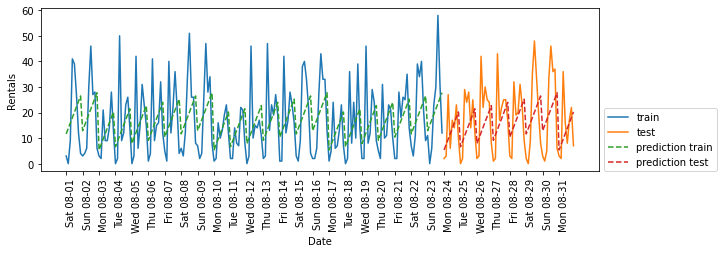

In [195]:
from sklearn.linear_model import LinearRegression

eval_on_features(X_hour_week, y, LinearRegression())
print("Predictions made by linear regression using day of week \
and hour of day as features")

`LinearRegression` works much worse, and the periodic pattern looks odd. The reason for this is that we encoded day of week and time of day using integers, which are interpreted as categorical variables. Therefore, the linear model can only learn a linear function of the time of day -and it learned that later in the day, there are more rentals. However, the patterns are much more complex than that. We can capture this by interpreting the integers as categorical variables, by transforming them using `OneHotEncoder`:

Test-set R^2: 0.62
Predictions made by linear regression using a one-hot encoding of hour of day and day of week


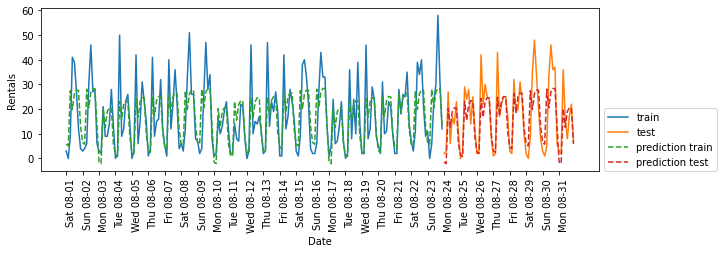

In [197]:
enc = OneHotEncoder()
X_hour_week_onehot = enc.fit_transform(X_hour_week).toarray()
eval_on_features(X_hour_week_onehot, y, Ridge())
print("Predictions made by linear regression using a one-hot encoding \
of hour of day and day of week")

This gives us a much better match than the continuous feature encoding. Now the linear model learns one coefficient for each day of the week, and one coefficient for each time of the day. That means that the "time of day" pattern is shared over all days of the week, though.

Using interaction features, we can allow the model to learn one coefficient for each combination of day and time of day:

Test-set R^2: 0.85
Predictions made by linear regression using a product of the day of week and hour of day features


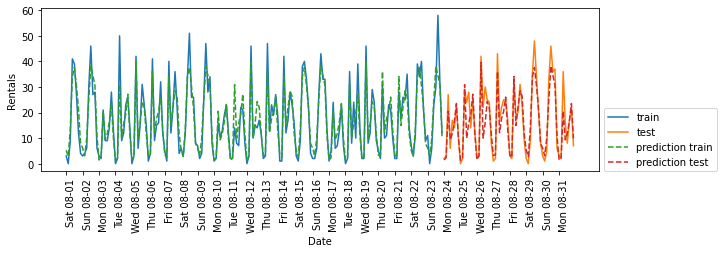

In [198]:
poly_transformer = PolynomialFeatures(degree=2, interaction_only=True,
                                      include_bias=False)
X_hour_week_onehot_poly = poly_transformer.fit_transform(X_hour_week_onehot)

lr = Ridge()
eval_on_features(X_hour_week_onehot_poly, y, lr)
print("Predictions made by linear regression using a product of \
the day of week and hour of day features")

This transformation finally yields a model that performs similarly well to the random forest. A big benefit of this model is that it is very clear what is learned: one coefficient for each day and time. We can simply plot the coefficients learned by the model, something that would not be possible for the random forest.

First, we create feature names for the hour and day features:

In [199]:
hour = ["%02d:00" %  i for i in range(0, 24, 3)]
day = ["Mon", "Tue", "Wed", "Thu", "Fri", "Sat", "sun"]
features = day + hour

Then we name all the interaction features extracted by `PolynomialFeatures`, using the `get_feature_name_out` method, and keep only the features with nonzero coefficients:

In [201]:
features_poly = poly_transformer.get_feature_names_out(features)
features_nonzero = np.array(features_poly)[lr.coef_ != 0]
coef_nonzero = lr.coef_[lr.coef_ != 0]

Now we can visualize the coefficients learned by the linear model, as seen in the figure below:

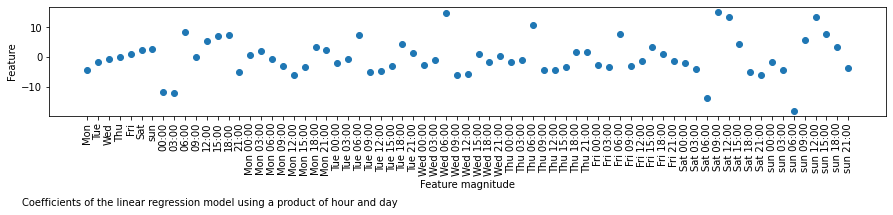

In [205]:
plt.figure(figsize=(15, 2))
plt.plot(coef_nonzero, 'o')
plt.xticks(np.arange(len(coef_nonzero)), features_nonzero, rotation=90)

plt.xlabel("Feature magnitude")
plt.ylabel("Feature")
plt.figtext(0.1, -0.5, "Coefficients of the linear regression model \
using a product of hour and day")

plt.show()

## **Summary and Outlook**

In this chapter, we discussed how to deal with different data types (in particular, with categorical variables). We emphasized the importance of representing data in a way that is suitable for the machine learning algorithm -for example, by one-hot-encoding categorical variables, We also discussed the importance of engineering new features, and the possibility of utilizing expert knowledge in creating derived features from your data. In particular, linear models might benefit greatly from generating new features via binning and adding polynomials and interactions, while more complex, nonlinear models like random forests and SVMs might be able to learn more complex tasks without explicitly expanding the feature space. In practice, the features that are used (and the match between features and method) is often the most important piece in making a machine learning approach work well.

Now that you have a good idea of how to represent your data in an appropriate way and which algorithm to use for which task, the next chapter will focus on evaluating the performance of machine learning models and seleting the right parameter settings.